# import modules

In [64]:
import os
import sys
import re
import pickle
import random
import subprocess
import time
import threading
import shutil
from concurrent.futures import ThreadPoolExecutor, ProcessPoolExecutor, wait, ALL_COMPLETED
from datetime import datetime, timedelta
from multiprocessing import Process, Pool

import numpy as np
import pandas as pd
import anndata as ad
import h5py
# import Bio
# from Bio import motifs
import pysam
import pyranges
import pybedtools
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import sklearn
from sklearn import preprocessing
import scipy
from scipy import io
import scanpy as sc
from sklearn.cluster import KMeans
from adjustText import adjust_text
# import episcanpy
import ruamel.yaml
yaml = ruamel.yaml.YAML(typ="safe")
yaml.default_flow_style = False


import SCRIPT
from SCRIPT.utilities import utils
from SCRIPT.utilities.utils import print_log, safe_makedirs, read_SingleCellExperiment_rds

import warnings
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)

plt.rcParams.update({
    'figure.figsize': [8.0, 8.0],
    'font.size' : 15,
    'font.family': 'Arial',
    'font.style' : 'normal',
    'font.weight':'bold',
    'figure.titleweight': 'bold',
    'axes.labelsize': 14 ,
    'axes.titleweight': 'normal',
    'axes.labelweight': 'bold',
    'axes.spines.right': False,
    'axes.spines.top': False,
})

N = 256
vals = np.ones((N, 4))
vals[:, 0] = np.linspace(220/256, 34/256, N)
vals[:, 1] = np.linspace(220/256, 7/256, N)
vals[:, 2] = np.linspace(220/256, 141/256, N)
regulation_cmp = mpl.colors.ListedColormap(vals)

In [2]:
a = yaml.load("""a:\n  b: 2\n  c: 3\n""")

with open('./test.yml', 'w+') as f:
    yaml.dump(a,f)

,TGGTCTATCATGGTTT,TATCCGGGTGGGTAAC,GAACTTAAGATTCGTT,AGTAACGGTATAGTGG,AGTAATCCAGCTACCC,GAGAGGAGTTTATTCC,GGGATAAAGTGAGGAA,TTTGCTGAGTATCGCC,CACTTCAAGATATTGG,GTATTGTTCCCGGAAA,...,AATGGCCCAGTAATCG,AAGAATCGTAAACCGA,GGCGCTTGTCATCACG,CGTAACCTCGTCCTTT,AAGAATCGTTAGCTCG,CCAACTGGTCCTTGAG,TCCGGTTAGCTTTAAC,GAAGTCAGTTACTCCC,ATTTCGCCACCACAAA,GATTACGCATGACAAT
Factor,,,,,,,,,,,,,,,,,,,,,
AC023509.3,AC023509.3_motif,AC023509.3_motif,AC023509.3_motif,AC023509.3_motif,AC023509.3_motif,AC023509.3_motif,AC023509.3_motif,AC023509.3_motif,AC023509.3_motif,AC023509.3_motif,...,AC023509.3_motif,AC023509.3_motif,AC023509.3_motif,AC023509.3_motif,AC023509.3_motif,AC023509.3_motif,AC023509.3_motif,AC023509.3_motif,AC023509.3_motif,AC023509.3_motif
AC138696.1,AC138696.1_motif,AC138696.1_motif,AC138696.1_motif,AC138696.1_motif,AC138696.1_motif,AC138696.1_motif,AC138696.1_motif,AC138696.1_motif,AC138696.1_motif,AC138696.1_motif,...,AC138696.1_motif,AC138696.1_motif,AC138696.1_motif,AC138696.1_motif,AC138696.1_motif,AC138696.1_motif,AC138696.1_motif,AC138696.1_motif,AC138696.1_motif,AC138696.1_motif
ADNP,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,...,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582
AEBP2,AEBP2_64454,AEBP2_64454,AEBP2_64454,AEBP2_64454,AEBP2_64454,AEBP2_64454,AEBP2_64454,AEBP2_64454,AEBP2_64454,AEBP2_64454,...,AEBP2_64454,AEBP2_64454,AEBP2_64454,AEBP2_64454,AEBP2_64454,AEBP2_64454,AEBP2_64454,AEBP2_64454,AEBP2_64454,AEBP2_64454
AFF1,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,...,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSCAN5C,ZSCAN5C_motif,ZSCAN5C_motif,ZSCAN5C_motif,ZSCAN5C_motif,ZSCAN5C_motif,ZSCAN5C_motif,ZSCAN5C_motif,ZSCAN5C_motif,ZSCAN5C_motif,ZSCAN5C_motif,...,ZSCAN5C_motif,ZSCAN5C_motif,ZSCAN5C_motif,ZSCAN5C_motif,ZSCAN5C_motif,ZSCAN5C_motif,ZSCAN5C_motif,ZSCAN5C_motif,ZSCAN5C_motif,ZSCAN5C_motif
ZTA,ZTA_52241,ZTA_52241,ZTA_52241,ZTA_52241,ZTA_52241,ZTA_52241,ZTA_52241,ZTA_52241,ZTA_52241,ZTA_52241,...,ZTA_52241,ZTA_52241,ZTA_52241,ZTA_52241,ZTA_52241,ZTA_52241,ZTA_52241,ZTA_52241,ZTA_52241,ZTA_52241
ZXDB,ZXDB_63902,ZXDB_63902,ZXDB_63902,ZXDB_63902,ZXDB_63902,ZXDB_63902,ZXDB_63902,ZXDB_63902,ZXDB_63902,ZXDB_63902,...,ZXDB_63902,ZXDB_63902,ZXDB_63902,ZXDB_63902,ZXDB_63902,ZXDB_63902,ZXDB_63902,ZXDB_63902,ZXDB_63902,ZXDB_63902


In [ ]:
sc.settings.verbosity = 3
# sc.logging.print_header()
sc.logging.print_versions()

# Config

In [3]:
plt.rcParams.update({
    'figure.figsize': [8.0, 8.0],
    'font.size' : 15,
    'font.family': 'Arial',
    'font.style' : 'normal',
    'font.weight':'bold',
    'figure.titleweight': 'bold',
    'axes.labelsize': 14 ,
    'axes.titleweight': 'bold',
    'axes.labelweight': 'bold',
    'axes.spines.right': False,
    'axes.spines.top': False,
})

N = 256
vals = np.ones((N, 4))
vals[:, 0] = np.linspace(220/256, 34/256, N)
vals[:, 1] = np.linspace(220/256, 7/256, N)
vals[:, 2] = np.linspace(220/256, 141/256, N)
regulation_cmp = mpl.colors.ListedColormap(vals)

In [84]:
# pd.set_option('display.max_columns', 500)  
# pd.set_option('display.max_rows', None)  
# pd.set_option('display.expand_frame_repr', False)
# pd.set_option('max_colwidth', -1)

In [4]:
def print_full(x):
    pd.set_option('display.max_rows', None)
    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', 2000)
#     pd.set_option('display.float_format', '{:20,.2f}'.format)
    pd.set_option('display.max_colwidth', None)
    print(x)
    pd.reset_option('display.max_rows')
    pd.reset_option('display.max_columns')
    pd.reset_option('display.width')
#     pd.reset_option('display.float_format')
    pd.reset_option('display.max_colwidth')

In [4]:
human_chip_index = '/mnt/Storage/home/dongxin/Projects/scATAC/index/human_ChIP_index'
human_motif_index = '/mnt/Storage/home/dongxin/Projects/scATAC/index/human_motif_index'
mouse_chip_index = '/mnt/Storage/home/dongxin/Projects/scATAC/index/mouse_ChIP_index'
mouse_motif_index = '/mnt/Storage/home/dongxin/Projects/scATAC/index/mouse_motif_index'

In [6]:
I_tf_list = ['I_TBX21', 'I_IRF8', 'I_CEBPA', 'I_CEBPB', 'I_MYB', 'I_BCL11A', 'I_BCL11B', 'I_STAT1', 'I_SOX10', 'I_EBF1', 'I_BRD4']
C_tf_list = [i.replace('I_', 'C_') for i in I_tf_list]
non_tf_list = [i.replace('I_', '') for i in I_tf_list]

# define functions

In [7]:
def add_time(func):
    def wrapper(*args, **kw):
        sys.stdout.write('INFO {time} '.format(time=time.strftime("%Y-%m-%d %H:%M:%S")))
        return func(*args, **kw)
    return wrapper

@add_time
def print_log(string, end="\n"):
    print(string, end=end)

def excute_info(start_info=None, end_info=None):
    def call(func):
        def wrapper(*args, **kwargs):
            if start_info:
                print_log(start_info)
            ret = func(*args, **kwargs)
            if end_info:
                print_log(end_info)
            return ret
        return wrapper
    return call


## generate bed function

In [8]:
def read_SingleCellExperiment_rds(input_RDS):
    import anndata2ri
    from rpy2.robjects import r
    anndata2ri.activate()
    rscript = 'readRDS("{RDS_file_path}")'.format(RDS_file_path = input_RDS)
    adata = r(rscript)
    adata.var.columns = [str(i) for i in adata.var.columns]
    adata.obs.columns = [str(i) for i in adata.obs.columns]
    return adata

In [9]:
def generate_peak_list(cells, input_mat, peak_confidence=1):
    cell_above_cutoff_index = sc.pp.filter_genes(input_mat[cells,:], min_cells=peak_confidence, inplace=False)[0]
    peaks = input_mat.var_names[cell_above_cutoff_index].to_list()
    return peaks

def determine_number_of_cells_per_group(input_mat, start=1, end=70, iteration_time=30, aim_peak_number=10000, peak_confidence=None):
    peak_number = 0
    cell_pool = input_mat.obs_names.to_list()
    cell_number = start - 1 
    while peak_number <= aim_peak_number:
        cell_number += 1
        if peak_confidence == None:
            peak_confidence = np.ceil(0.2*cell_number)
        tmp_peak_number = []
        for i in range(iteration_time):
            cells = random.sample(cell_pool, cell_number)
            tmp_peak_number.append(generate_peak_list(cells, input_mat, peak_confidence).__len__())
        peak_number = sum(tmp_peak_number)/iteration_time
        print(tmp_peak_number)
    print(cell_number)


In [10]:
def generate_beds(file_path, cells, input_mat, peak_confidence): # peak confidence including =
    cell_above_cutoff_index = sc.pp.filter_genes(input_mat[cells,:], min_cells=peak_confidence, inplace=False)[0]
    peaks = input_mat.var_names[cell_above_cutoff_index].to_list()
    peaks = pd.DataFrame([p.split("_") for p in peaks])
    peaks.to_csv(file_path, sep="\t", header= None, index=None)
    cmd = 'sort --buffer-size 2G -k1,1 -k2,2n -k3,3n {bed_path} | bgzip -c > {bed_path}.gz\n'.format(bed_path=file_path)
    cmd += 'rm {bed_path}'.format(bed_path=file_path)
    subprocess.run(cmd, shell=True, check=True)

@excute_info('Start generating background beds ...', 'Finished generating background beds!')
def generate_background_bed(input_mat, bg_bed_path, map_dict_store_path, step=50, iteration=1000, peak_confidence=5, n_cores=8):
    map_dict = {}
    if not os.path.exists(bg_bed_path):
        os.makedirs(bg_bed_path)
    cl_name = input_mat.obs_names.to_list()
    total_cnt = iteration
    executor = ThreadPoolExecutor(max_workers=n_cores)
    all_task = []
    for i in range(0,iteration): 
        random.seed(i)
        map_dict[i] = random.sample(cl_name, step)
        all_task.append(executor.submit(generate_beds, bg_bed_path + "/" + str(i) + ".bed", map_dict[i], input_mat, peak_confidence))
    wait(all_task, return_when=ALL_COMPLETED)
    with open(map_dict_store_path, "wb") as map_dict_file:
        pickle.dump(map_dict, map_dict_file)
    return map_dict

@excute_info('Start generating group beds ...', 'Finished generating group beds!')
def generate_group_bed(adata, input_mat, bed_path, map_dict_store_path, step=50, cell_cutoff=20, peak_confidence=5):
    metadata = adata.obs
    map_dict = {}
    if not os.path.exists(bed_path):
        os.makedirs(bed_path)
    cluster_info = metadata["seurat_clusters"].unique().to_list()
    for i in cluster_info:
        cluster_cell_name = metadata[metadata['seurat_clusters'] == i].index.to_list()
        start = range(0, len(cluster_cell_name), step)
        j = 0
        for s in start:
            cl_name = cluster_cell_name[s:(s + step)]
            key = str(i) + "_" + str(j)
            map_dict[key] = cl_name
            if len(cl_name) <= cell_cutoff:
                print_log(key + " only have " + str(len(cl_name)), " cells, skip generate bed file.\n")
                continue
            else:
                generate_beds(bed_path + "/" + str(key) + ".bed", map_dict[key], input_mat, peak_confidence)
                j = j+1
    with open(map_dict_store_path, "wb") as map_dict_file:
        pickle.dump(map_dict, map_dict_file)
    return map_dict

def sub_coor_table_in_small_square(cell, coor_table, step, t):
    tmp = coor_table[(coor_table['X'] < coor_table.loc[cell, 'X'] + step * t) & 
                     (coor_table['X'] > coor_table.loc[cell, 'X'] - step * t) &  
                     (coor_table['Y'] < coor_table.loc[cell, 'Y'] + step * t) & 
                     (coor_table['Y'] > coor_table.loc[cell, 'Y'] - step * t)]
    return tmp.copy()

def find_nearest_cells(cell, coor_table, n_neighbor=20, step=None):
#   coor_table has two columns: X, Y, the index of coortable is cell barcodes
    if step == None:
        up_limit = coor_table.max()
        down_limit = coor_table.min()
        width = up_limit.X - down_limit.X
        height = up_limit.Y - down_limit.Y
        step = min(width, height)/200
    t = 1
    tmp = pd.DataFrame()
    while tmp.shape[0] < n_neighbor:
        tmp = sub_coor_table_in_small_square(cell, coor_table, step, t)
        t += 1
    squ_distance = [(tmp.loc[i,"X"] - tmp.loc[cell,"X"])**2 + (tmp.loc[i,"Y"] - tmp.loc[cell,"Y"])**2 for i in tmp.index]
    tmp['distance'] = squ_distance
    tmp = tmp.sort_values(by='distance', ascending=True)
    # since we use square to check the distance, check whether the point is out the circle
    while tmp.iloc[n_neighbor-1, 2] > ((step*t)**2):
        t += 1
        tmp = sub_coor_table_in_small_square(cell, coor_table, step, t)
        squ_distance = [(tmp.loc[i,"X"] - tmp.loc[cell,"X"])**2 + (tmp.loc[i,"Y"] - tmp.loc[cell,"Y"])**2 for i in tmp.index]
        tmp['distance'] = squ_distance
        tmp = tmp.sort_values(by='distance', ascending=True) 
    neighbor_bcs = tmp.index[0:n_neighbor].tolist()
    return neighbor_bcs

@excute_info('Start generating nearest neighbor cells beds ...', 'Finished generating nearest neighbor cells beds!')
def generate_neighbor_bed(adata, input_mat, bed_path, map_dict_store_path, n_neighbor=10, peak_confidence=2, n_cores=8):
    coor_table = pd.DataFrame(adata.obsm['X_umap'], index = adata.obs.index, columns=["X","Y"])
    width = coor_table.max().X - coor_table.min().X
    height = coor_table.max().Y - coor_table.min().Y
    step = min(width, height)/200
    map_dict = {}
    if not os.path.exists(bed_path):
        os.makedirs(bed_path)
    total_cnt = adata.obs.index.__len__()
    executor = ThreadPoolExecutor(max_workers=n_cores)
    all_task = []
#     for clstr in adata.obs['seurat_clusters'].unique().to_list()
#         clstr_cell_list = adata.obs.index[adata.obs['seurat_clusters'] == clstr].to_list()
#         coor_table = coor_table_all.loc[clstr_cell_list,]
    for cell in adata.obs.index:
        neighbor_cells = find_nearest_cells(cell, coor_table, n_neighbor, step)
        map_dict[cell] = neighbor_cells
        all_task.append(executor.submit(generate_beds, bed_path + "/" + str(cell) + ".bed", neighbor_cells, input_mat, peak_confidence))
    wait(all_task, return_when=ALL_COMPLETED)
    with open(map_dict_store_path, "wb") as map_dict_file:
        pickle.dump(map_dict, map_dict_file)
    return map_dict


## search giggle function

In [11]:
def search_giggle(bed_path, result_path, index_path):
#     bed = bed_path.split("/")[-1]
#     if bed_path.endswith('gz'):
    cmd = 'giggle search -i "{index_path}" -s -q "{bed_path}" > "{result_path}"\n'.format(index_path=index_path, result_path=result_path, bed_path=bed_path)
#     print(cmd)
#     else:
#         cmd = 'sort --buffer-size 2G -k1,1 -k2,2n -k3,3n {bed_path} | bgzip -c > {bed_path}.gz\n'.format(bed_path=bed_path)
#         cmd += 'giggle search -i {index_path} -s -q {bed_path}.gz > {result_path}\n'.format(index_path=index_path, result_path=result_path, bed_path=bed_path)
#         cmd += 'rm {bed_path}'.format(bed_path=bed_path)
    subprocess.run(cmd, shell=True, check=True)

def search_giggle_batch(bed_folder, result_folder, index_path, n_cores=8):
    if not os.path.exists(result_folder):
        os.makedirs(result_folder)
    beds = os.listdir(bed_folder)
    args = []
    for bed in beds:
        barcodes = bed[:-7] # remove suffix '.bed.gz'
        args.append((bed_folder + '/' + bed, result_folder + '/' + barcodes + '.txt', index_path))
    with Pool(n_cores) as p:
        p.starmap(search_giggle, args)

# def read_giggle_result(path):
#     """For giggle stored path, return a table, col is cell cluster / cell and row is factor"""
#     file_list = os.listdir(path)
#     print_log('Reading search result in {path}, in total {number} files.'.format(path=path, number=len(file_list)))
#     for i in range(len(file_list)):
#         if i%50 == 0:
#             print_log("finished {percentage:.2f} %".format(percentage = i*100/file_list.__len__()), end="\r")
#         giggle_result = file_list[i]
#         cell_bc = giggle_result[:-4] # remove suffix '.txt'
#         dtframe = pd.read_csv(os.path.join(path, giggle_result), sep="\t", index_col=False)
#         if i == 0:
#             dtframe = dtframe.loc[:,["#file", "combo_score"]]
#             total = dtframe.rename(columns={'combo_score':cell_bc}).copy()
#         else:
#             newcol = dtframe[["combo_score"]]
#             total[cell_bc] = newcol
#     idList = [i.replace(".bed.gz","") for i in total['#file']]
#     total = total.rename(columns={"#file":"id"})
#     total["id"] = idList
#     total = total.set_index("id")
#     return total

def read_giggle_result(files, i):
#     giggle_result = os.path.basename(files[0])
#     cell_bc = giggle_result[:-4] # remove suffix '.txt'
#     dtframe = pd.read_csv(files[0], sep="\t", index_col=False)
#     dtframe = dtframe.loc[:,["#file", "combo_score"]]
#     total = dtframe.rename(columns={'combo_score':cell_bc}).copy()
    for i in range(len(files)):
        giggle_result = os.path.basename(files[i])
        cell_bc = giggle_result[:-4] # remove suffix '.txt'
        dtframe = pd.read_csv(files[i], sep="\t", index_col=False)
        if i == 0:
            dtframe = dtframe.loc[:,["#file", "combo_score"]]
            total = dtframe.rename(columns={'combo_score':cell_bc}).copy()
        else:
            newcol = dtframe[["combo_score"]]
            total[cell_bc] = newcol
    idList = [i[:-7] for i in total['#file']] # remove suffix '.bed.gz'
    total = total.rename(columns={"#file":"id"})
    total["id"] = idList
    total = total.set_index("id")
    return total

def read_giggle_result_fisher(files, i):
    for i in range(len(files)):
        giggle_result = os.path.basename(files[i])
        cell_bc = giggle_result[:-4] # remove suffix '.txt'
        dtframe = pd.read_csv(files[i], sep="\t", index_col=False)
        if i == 0:
            dtframe = dtframe.loc[:,["#file", "fishers_two_tail"]]
            total = dtframe.rename(columns={'fishers_two_tail':cell_bc}).copy()
        else:
            newcol = dtframe[["fishers_two_tail"]]
            total[cell_bc] = newcol
    idList = [i[:-7] for i in total['#file']] # remove suffix '.bed.gz'
    total = total.rename(columns={"#file":"id"})
    total["id"] = idList
    total = total.set_index("id")
    return total

def read_giggle_result_odd(files, i):
    for i in range(len(files)):
        giggle_result = os.path.basename(files[i])
        cell_bc = giggle_result[:-4] # remove suffix '.txt'
        dtframe = pd.read_csv(files[i], sep="\t", index_col=False)
        if i == 0:
            dtframe = dtframe.loc[:,["#file", "odds_ratio"]]
            total = dtframe.rename(columns={'odds_ratio':cell_bc}).copy()
        else:
            newcol = dtframe[["odds_ratio"]]
            total[cell_bc] = newcol
    idList = [i[:-7] for i in total['#file']] # remove suffix '.bed.gz'
    total = total.rename(columns={"#file":"id"})
    total["id"] = idList
    total = total.set_index("id")
    return total

def read_giggle_result_fisher_batch(path, n_cores=8):
    print_log("Reading searching results, using {n} cores...".format(n=n_cores))
    file_list = os.listdir(path)
    result_split = np.array_split(file_list, n_cores)
    args = [[[os.path.join(path, j) for j in list_chunk], i] for (i, list_chunk) in enumerate(result_split)]
    with Pool(n_cores) as p:
        result = p.starmap(read_giggle_result_fisher, args)
    total = pd.concat([i for i in result], axis=1)
    return total

def read_giggle_result_odd_batch(path, n_cores=8):
    print_log("Reading searching results, using {n} cores...".format(n=n_cores))
    file_list = os.listdir(path)
    result_split = np.array_split(file_list, n_cores)
    args = [[[os.path.join(path, j) for j in list_chunk], i] for (i, list_chunk) in enumerate(result_split)]
    with Pool(n_cores) as p:
        result = p.starmap(read_giggle_result_odd, args)
    total = pd.concat([i for i in result], axis=1)
    return total


## pvalue calculation function

In [12]:
def cal_hist_auc(arrays, bins = 500):
    """Calculate the AUC of the arrays distribution
    """
    y_score = np.array(arrays)
    hist = arrays.value_counts(bins=bins)
    hist = hist.sort_index()
    append_right = hist.index[bins-1].right
    hist.index = hist.index.left
    # bins is the regions, like [1100, 1200, 1300 ...]
    bins = np.asarray(hist.index)
    # bins[0] = bins[1] - np.diff(bins)[1]
    bins = np.append(bins, append_right)
    # values is the height of each bins, like [0, 0, 1, 2, 0, 1 ...]
    values = np.asarray(hist.values)
    area = sum(np.diff(bins)*values)
    return area, bins, values

def find_bin_idx_of_value(bins, value):
    """Finds the bin which the value corresponds to."""
    array = np.asarray(value)
    idx = np.digitize(array, bins)
    if idx == 0:
        return 0
    return idx-1

def area_after_val(values, bins, val):
    """Calculates the area of the hist after a certain value"""
    left_bin_edge_index = find_bin_idx_of_value(bins, val)
#     bin_width = np.diff(bins)[1]
#     print(bin_width)
    area = sum(np.diff(bins)[left_bin_edge_index:] * values[left_bin_edge_index:])
    return area

def cal_p_unregular_distribution(fg_value, bg_area, bg_bins, bg_values):
    pvalue = area_after_val(bg_values, bg_bins, fg_value)/bg_area
    if pvalue > 1:
        pvalue = 1.0
    return pvalue


def cal_p_unregular_distribution_table(fg_table, bg_area, bg_bins, bg_values, i):
    print_log('chunk {i} calculating ...'.format(i=i))
    result_table_p = fg_table.copy()
#     result_table_fc = fg_table.copy()
    for factor in fg_table.index:
            result_table_p.loc[factor,:] = fg_table.loc[factor,:].apply(cal_p_unregular_distribution, args=(bg_area, bg_bins, bg_values)) 
#         result_table_fc.loc[factor,:] = fg_table.loc[factor,:].apply(cal_fc, **{'bg_mean': bg_mean})
    print_log('chunk {i} finished calculation!'.format(i=i))
    return result_table_p

def cal_p_unregular_distribution_table_batch(fg_table, score, n_cores=8):
    print_log("Calculating enrichment, divide into {n} chunks...".format(n=n_cores))
    fg_table_split = np.array_split(fg_table, n_cores)
    bg_area, bg_bins, bg_values = cal_hist_auc(score)
    args = [[table, bg_area, bg_bins, bg_values, i] for (i, table) in enumerate(fg_table_split)]
    with Pool(n_cores) as p:
        result = p.starmap(cal_p_unregular_distribution_table, args)
    print_log("Generating P value table ...")
    result_table_p = pd.concat([i for i in result])
#     print("INFO {time}, Generating FC value table ...".format(time=datetime.now()))
#     result_table_fc = pd.concat([i[1] for i in result])
    print_log('Finished calculation enrichment!')
    return result_table_p


# def cal_fc(fg_value, bg_mean):
#     if bg_mean * fg_value > 0: # if mean and value are opposite
#         fc = fg_value / bg_mean
#     elif bg_mean == 0:
#         fc = fg_value
#     else:
#         fc = bg_mean / (bg_mean - fg_value)
#     return fc

# calculate p value by area at the right of curve
# calculate fc by value / background average


def cal_deviation(val, mean, std):
    return (val-mean)/std

def cal_deviation_table(fg_table, bg_table, i):
    print_log('chunk {i} calculating ...'.format(i=i))
    result_table_p = fg_table.copy()
    for factor in fg_table.index:
        factor_bg = bg_table.loc[factor,:].tolist()
        bg_mean = np.mean(factor_bg)
        bg_std = np.std(factor_bg)
        if bg_mean != 0 and bg_std != 0:
            result_table_p.loc[factor,:] = fg_table.loc[factor,:].apply(cal_deviation, **{'mean':bg_mean, 'std':bg_std})
        else:
            result_table_p.loc[factor,:] = 0
    print_log('chunk {i} finished calculation!'.format(i=i))
    return result_table_p
    
def cal_deviation_table_batch(fg_table, bg_table, n_cores=8):
    print_log("Calculating enrichment, divide into {n} chunks...".format(n=n_cores))
    fg_table_split = np.array_split(fg_table, n_cores)
    args = [[table, bg_table, i] for (i, table) in enumerate(fg_table_split)]
    with Pool(n_cores) as p:
        result = p.starmap(cal_deviation_table, args)
    print_log("Generating P value table ...")
    result_table_p = pd.concat([i for i in result])
    print_log('Finished calculation enrichment!')
    return result_table_p


def cal_rank(val, bg):
    rank = [i for i in bg if i >= val].__len__()
    if rank == 0:
        rank = 1
    ret = rank/bg.__len__()
    return ret

def cal_rank_table(fg_table, bg_table, i):
    print_log('chunk {i} calculating ...'.format(i=i))
    result_table_p = fg_table.copy()
#     result_table_fc = fg_table.copy()
    for factor in fg_table.index:
        factor_bg = bg_table.loc[factor,:].tolist()
        bg_mean = np.mean(factor_bg)
        bg_std = np.std(factor_bg)
        if bg_mean != 0 and bg_std != 0:
            result_table_p.loc[factor,:] = fg_table.loc[factor,:].apply(cal_rank, **{'bg':factor_bg})
        else:
            result_table_p.loc[factor,:] = 1
#         result_table_fc.loc[factor,:] = fg_table.loc[factor,:].apply(cal_fc, **{'bg_mean': bg_mean})
    print_log('chunk {i} finished calculation!'.format(i=i))
    return result_table_p

def cal_rank_table_batch(fg_table, bg_table, n_cores=8):
    print_log("Calculating enrichment, divide into {n} chunks...".format(n=n_cores))
    fg_table_split = np.array_split(fg_table, n_cores)
    args = [[table, bg_table, i] for (i, table) in enumerate(fg_table_split)]
    with Pool(n_cores) as p:
        result = p.starmap(cal_rank_table, args)
    print_log("Generating P value table ...")
    result_table_p = pd.concat([i for i in result])
#     print("INFO {time}, Generating FC value table ...".format(time=datetime.now()))
#     result_table_fc = pd.concat([i[1] for i in result])
    print_log('Finished calculation enrichment!')
    return result_table_p




# def cal_z(score, mean, std):
#     return (score-mean)/std

# def cal_z_table(fg_table, bg_table, i):
#     print_log('chunk {i} calculating ...'.format(i=i))
#     result_table_z = fg_table.copy()
# #     result_table_fc = fg_table.copy()
#     for factor in fg_table.index:
#         factor_bg = bg_table.loc[factor,:]
#         bg_mean = np.mean(factor_bg)
#         bg_std = np.std(factor_bg)
#         if bg_mean != 0 and bg_std != 0:
#             result_table_z.loc[factor,:] = fg_table.loc[factor,:].apply(cal_z, args=(bg_mean, bg_std))
#         else:
#             result_table_z.loc[factor,:] = 0
# #         result_table_fc.loc[factor,:] = fg_table.loc[factor,:].apply(cal_fc, **{'bg_mean': bg_mean})
#     print_log('chunk {i} finished calculation!'.format(i=i))
#     return result_table_z

def cal_p_table(fg_table, bg_table, i):
    print_log('chunk {i} calculating ...'.format(i=i))
    result_table_p = fg_table.copy()
#     result_table_fc = fg_table.copy()
    for factor in fg_table.index:
        factor_bg = bg_table.loc[factor,:]
        bg_mean = np.mean(factor_bg)
        bg_std = np.std(factor_bg)
        if bg_mean != 0 and bg_std != 0:
            result_table_p.loc[factor,:] = fg_table.loc[factor,:].apply(scipy.stats.norm.sf, args=(bg_mean, bg_std)) # sf is more accurate than cdf, return 1-cdf
        else:
            result_table_p.loc[factor,:] = 0
#         result_table_fc.loc[factor,:] = fg_table.loc[factor,:].apply(cal_fc, **{'bg_mean': bg_mean})
    print_log('chunk {i} finished calculation!'.format(i=i))
    return result_table_p

def cal_p_table_batch(fg_table, bg_table, n_cores=8):
    print_log("Calculating enrichment, divide into {n} chunks...".format(n=n_cores))
    fg_table_split = np.array_split(fg_table, n_cores)
    args = [[table, bg_table, i] for (i, table) in enumerate(fg_table_split)]
    with Pool(n_cores) as p:
        result = p.starmap(cal_p_table, args)
    print_log("Generating P value table ...")
    result_table_p = pd.concat([i for i in result])
#     print("INFO {time}, Generating FC value table ...".format(time=datetime.now()))
#     result_table_fc = pd.concat([i[1] for i in result])
    print_log('Finished calculation enrichment!')
    return result_table_p

def correct_pvalues_for_multiple_testing(pvalues, correction_type = "Benjamini-Hochberg"):                
    """                                                                                                   
    consistent with R - print correct_pvalues_for_multiple_testing([0.0, 0.01, 0.029, 0.03, 0.031, 0.05, 0.069, 0.07, 0.071, 0.09, 0.1]) 
    modified from https://stackoverflow.com/questions/7450957/how-to-implement-rs-p-adjust-in-python/7453313
    """
    pvalues = np.array(pvalues) 
    n = pvalues.shape[0]     
    new_pvalues = np.empty(n)
    if correction_type == "Bonferroni":   
        new_pvalues = n * pvalues
    elif correction_type == "Bonferroni-Holm": 
        values = [(pvalue, i) for i, pvalue in enumerate(pvalues)]                                      
        values.sort()
        for rank, vals in enumerate(values):                                                              
            pvalue, i = vals
            new_pvalues[i] = (n-rank) * pvalue                                                            
    elif correction_type == "Benjamini-Hochberg":                                                         
        values = [(pvalue, i) for i, pvalue in enumerate(pvalues)]                                      
        values.sort()
        values.reverse()
        new_values = []
        for i, vals in enumerate(values): 
            rank = n - i
            pvalue, index = vals 
            new_values.append((n/rank) * pvalue) 
        for i in range(0, int(n)-1): 
            if new_values[i] < new_values[i+1]:                                                           
                new_values[i+1] = new_values[i]                                                           
        for i, vals in enumerate(values):
            pvalue, index = vals
            new_pvalues[index] = new_values[i]                                                                                                                  
    return new_pvalues

## post processing

In [13]:
@excute_info('Summary result from dataset level to factor level.') 
def map_factor_on_ChIP(table):
    ret = table.copy()
    # map factor by id "_"
    factor_index_list = []
    for i in ret.index:
        factor_name = i.split("_")
        if len(factor_name) != 2:
            try:
                factor_index_list.append(factor_dict[int(factor_name[0])])
            except:
                print(factor_name)
                factor_index_list.append("None")
        else:
            factor_index_list.append(factor_name[1])
    ret["Factor"] = factor_index_list
    return ret.groupby("Factor").min()

def map_factor_on_ChIP_max(table):
    ret = table.copy()
    # map factor by id "_"
    factor_index_list = []
    for i in ret.index:
        factor_name = i.split("_")
        if len(factor_name) != 2:
            try:
                factor_index_list.append(factor_dict[int(factor_name[0])])
            except:
                print(factor_name)
                factor_index_list.append("None")
        else:
            factor_index_list.append(factor_name[1])
    ret["Factor"] = factor_index_list
    return ret.groupby("Factor").max()

@excute_info('Extract cell by map dictionary ...', 'Finished all clusters!')
def extract_by_cell_cluster(result_table, map_dict):
    r_table = pd.DataFrame()
    for key in result_table.columns:
        key_cell_number = len(map_dict[key])
        table_index = result_table.index
        cell_bc = map_dict[key]
        new_table_np = np.tile(result_table[key].to_numpy(),[key_cell_number,1]).T
        tmp_table = pd.DataFrame(new_table_np, index = table_index, columns=cell_bc)
        r_table = pd.concat([r_table, tmp_table], axis=1)
    return r_table

def p_to_z_transform(p_table):
    z_table = -np.log10(p_table).T.apply(scipy.stats.zscore, axis=0).T.copy()
    return z_table

@excute_info('Generating merged anndata ... ', 'Finished Generating merged anndata!')
def merge_giggle_singlecell_experiment(adata, table, data_type, table2=''):
    # table : each row is a cell, each column is a TF/Gene
    new_adata = adata.copy()
    if data_type == 'integration':
        p_table = table.copy()
        p_table2 = table2.copy()
        new_adata.uns['ChIP_p'] = p_table
        new_adata.uns['motif_p'] = p_table2
        # table1, usually chip_table
        z_table = p_to_z_transform(p_table)
        new_adata.uns['ChIP_z'] = z_table
        # table2, usually motif table
        p_table2 = p_table2.reindex(index = p_table.index)
        z_table2 = p_to_z_transform(p_table2)
        new_adata.uns['motif_z'] = z_table2
        # extract factor
        chip_tfs = z_table.columns.tolist()
        motif_tfs = z_table2.columns.tolist()
        overlap_tf_list = list(set(chip_tfs).intersection(set(motif_tfs)))
        chip_other_tf_list = list(set(chip_tfs) - set(overlap_tf_list))
        motif_other_tf_list = list(set(motif_tfs) - set(overlap_tf_list))
        ovlp_chip_table = z_table[overlap_tf_list]
        ovlp_motif_table = z_table2[overlap_tf_list]
        unique_chip_table = z_table[chip_other_tf_list]
        unique_motif_table = z_table2[motif_other_tf_list]
        ovlp_final_table = pd.DataFrame()
        for ovlp_factor in overlap_tf_list:
            if np.std(ovlp_chip_table[ovlp_factor]) >= np.std(ovlp_motif_table[ovlp_factor]):
                ovlp_final_table[ovlp_factor] = ovlp_chip_table[ovlp_factor]
            else:
                ovlp_final_table[ovlp_factor] = ovlp_motif_table[ovlp_factor]
        final_table = pd.concat([ovlp_final_table,unique_chip_table,unique_motif_table], axis=1)
        final_table.columns = ['I_' + tf for tf in final_table.columns.tolist()]
        new_adata.uns['integrated_z'] = final_table
        new_adata.obs = pd.concat([new_adata.obs, final_table.reindex(new_adata.obs.index.tolist())], axis=1)
#         new_adata.uns['integrated_quantile'] = pd.DataFrame(quantile_transform(final_table.T, axis=0, output_distribution='uniform'), 
#                                                             index=final_table.index, columns=final_table.columns).T
    else:
        p_table = table.copy()
        if data_type == 'ChIP-seq':
            new_adata.uns['ChIP_p'] = p_table
            p_table.columns = ['C_' + tf for tf in p_table.columns.tolist()]
            z_table = p_to_z_transform(p_table)
            new_adata.uns['ChIP_z'] = z_table
        elif data_type == 'motif':
            new_adata.uns['motif_p'] = p_table
            p_table.columns = ['M_' + tf for tf in p_table.columns.tolist()]
            z_table = p_to_z_transform(p_table)
            new_adata.uns['ChIP_z'] = z_table

        new_adata.obs = pd.concat([new_adata.obs, z_table.reindex(new_adata.obs.index.tolist())], axis=1)
#         new_adata.uns['TF_quantile'] = pd.DataFrame(quantile_transform(z_table, axis=0, output_distribution='normal'), 
#                                                                index=z_table.index, columns=z_table.columns)
    return new_adata


## main function

In [14]:
def time_estimate(cell_number, bg_iteration_number, peak_methods, cell_number_per_group, chip_process, motif_process, core):
#   generate bed: 0.5 second per cell,  search index: 10 seconds per cell, cal p: 2 seconds per factor
    if peak_methods == "group":
        bed_number = int(cell_number/cell_number_per_group) + bg_iteration_number
        seconds = 3 * bed_number
        if chip_process == True:
            seconds += 10 * bed_number
        if motif_process == True:
            seconds += 10 * bed_number
    elif peak_methods == "nearest":
        seconds = int(cell_number * core / 50) # single core process, find nearest cells function
        bed_number = cell_number + bg_iteration_number
        seconds += 3 * bed_number
        if chip_process == True:
            seconds += 10 * bed_number
        if motif_process == True:
            seconds += 10 * bed_number
    chip_factor_number = 5069
    motif_factor_number = 1143
    if chip_process == True:
        seconds += 2 * chip_factor_number
    if motif_process == True:
        seconds += 2 * motif_factor_number
    seconds = seconds / core
    now_time = datetime.now()
    future_time = (datetime.now() + timedelta(seconds=seconds)).strftime("%Y-%m-%d %H:%M:%S")
    m, s = divmod(seconds, 60)
    h, m = divmod(m, 60)
    elapse = "{hour:0>2d}:{minute:0>2d}:{second:0>2d}".format(hour=int(h), minute=int(m), second=int(s))
    return elapse, future_time    

def check_para(processed_adata, feature_matrix, 
               aggregate_peak_method, cell_number_per_group, cell_cutoff, peak_confidence, 
               fg_bed_path, fg_map_dict_path, 
               bg_bed_path, bg_map_dict_path, bg_iteration, 
               search_chip, chip_index, fg_chip_result_path, bg_chip_result_path,
               search_motif, motif_index, fg_motif_result_path, bg_motif_result_path, 
               integration, store, result_store_path, confirm, clean, n_cores):
    if processed_adata.shape[0] > feature_matrix.shape[0]:
        print_log('WARNING: There are more cells in anndata than input feature matrix.')
    if aggregate_peak_method == 'group':
        if 'seurat_clusters' not in processed_adata.obs:
            print_log('There is no cluster infomation in anndata. "seurat_clusters in .obs is necessary."')
            sys.exit()
    if bg_iteration * cell_number_per_group < feature_matrix.shape[0] * 5:
        print_log('WARNING: Background iteration number less than 5 times number of cell. May be not enough to estimate background.')
    if re.match(r'chr.*_\d*_\d*', feature_matrix.var_names[0]) == None:
        print_log("feature_matrix's index should be like this: chr1_222222_333333. Each row is a feature and each column is a cell.")
        sys.exit()
    if cell_cutoff >= cell_number_per_group or peak_confidence >= cell_number_per_group:
        print_log("cell_cutoff or peak_confidence can not greater than cell_number_per_group.")
        sys.exit()
    if search_chip == True:
        if not os.path.exists(chip_index):
            print_log("chip_index do not exist!")
            sys.exit()
    if search_motif == True:
        if not os.path.exists(motif_index):
            print_log("motif_index do not exist!")
            sys.exit()
    if search_chip != True and search_motif != True:
        print_log("One of search_chip or search_motif must be chosen!")
        sys.exit()
    if store == True and (type(result_store_path) != str or not result_store_path.endswith('.h5ad')):
        print_log("The result_store_path must be set as .h5ad file when store is True!")
        sys.exit()
    # prepare information
    information = '\n~~~~~\nWelcome to use SCRIPT. Here are your settings:\n\n'
    information += 'There are UMAP information and cluster information in your processed_adata. '
    information += 'The aggregate peaks method is {aggregate_peak_method}.\n'.format(aggregate_peak_method=aggregate_peak_method)
    if aggregate_peak_method == 'group':
        information += 'This will aggregate {cell_number_per_group} cells from the same cluster, '.format(cell_number_per_group=cell_number_per_group) 
        information += 'the group that cell number is less than {cell_cutoff} will not generate.\n'.format(cell_cutoff=cell_cutoff)
        information += 'For each group, peaks that confidence is less than {peak_confidence} will be deleted.\n'.format(peak_confidence=peak_confidence)
        information += 'This setting is suitable for the background as well. '
    else:
        information += 'This will borrow peaks from {cell_number_per_group} nearest cells for every cell. '.format(cell_number_per_group=cell_number_per_group)
        information += 'For each cell, peaks that confidence is less than {peak_confidence} will be deleted.\n'.format(peak_confidence=peak_confidence)
    information += 'SCRIPT randomly aggregates {cell_number_per_group} cells peaks '.format(cell_number_per_group=cell_number_per_group)
    information += 'and deletes the peaks that confidence less than {peak_confidence}. '.format(peak_confidence=peak_confidence)
    information += 'This will iterate {bg_iteration} times.\n'.format(bg_iteration=bg_iteration)
    information += 'The background peaks will be stored in {bg_bed_path}, '.format(bg_bed_path=bg_bed_path)
    information += 'foreground peaks will be stored in {fg_bed_path}.\n'.format(fg_bed_path=fg_bed_path)
    if search_chip == True and search_motif == True:
        information += 'SCRIPT will search ChIP-seq and motif index both.\n'
        if integration == True:
            information += 'After that, SCRIPT will integrate into one result based on variability from each result.\n'
    elif search_chip == True:
        information += 'SCRIPT will search ChIP-seq index.\n'
    elif search_motif == True:
        information += 'SCRIPT will search motif index.\n'
    if search_chip == True:
        information += 'ChIP-seq index locates at {chip_index}.\n'.format(chip_index=chip_index)
        information += 'ChIP-seq background result will be stored in {bg_chip_result_path}, '.format(bg_chip_result_path=bg_chip_result_path)
        information += 'foreground result will be stored in {fg_chip_result_path}.\n'.format(fg_chip_result_path=fg_chip_result_path)
    if search_motif == True:
        information += 'Motif index locates at {motif_index}.\n'.format(motif_index=motif_index)
        information += 'Motif background result will be stored in {bg_motif_result_path}, '.format(bg_motif_result_path=bg_motif_result_path)
        information += 'foreground result will be stored in {fg_motif_result_path}.\n'.format(fg_motif_result_path=fg_motif_result_path)
    if store == True:
        information += 'Computed result will be stored in {result_store_path}.\n'.format(result_store_path=result_store_path)
    else:
        information += 'Computed result will not be stored.\n'.format(result_store_path=result_store_path)
    information += 'All folders will{not_string} be removed after processing. '.format(not_string='' if clean == True else ' not')
    information += 'All processes will use {n_cores} cores.\n~~~~~\n'.format(n_cores=n_cores)
    print(information)
        
def process(tp, bg_bed_path, bg_result_path, fg_bed_path, fg_result_path, index, n_cores, fg_map_dict, aggregate_peak_method):
    if tp == 'chip':
        log_list = [
            'Start searching background beds from ChIP-seq index ...',
            'Finished searching background beds from ChIP-seq index!',
            'Start searching foreground beds from ChIP-seq index ...',
            'Finished searching factors from ChIP-seq index!',
            'Finished reading background ChIP-seq index search result!',
            'Finished reading foreground ChIP-seq index search result!'
        ]
    else:
        log_list = [
            'Start searching background beds from motif index ...',
            'Finished searching background beds from motif index!',
            'Start searching foreground beds from motif index ...',
            'Finished searching factors from motif index!',
            'Finished reading background motif index search result!',
            'Finished reading foreground motif index search result!'
        ]
    try:
        if os.listdir(bg_bed_path).__len__() != os.listdir(bg_result_path).__len__():
            shutil.rmtree(bg_result_path)
            print_log(log_list[0])
            search_giggle_batch(bg_bed_path, bg_result_path, index, n_cores)
            print_log(log_list[1])
        else:
            print_log('WARNING: Using existing results, might wrong. If you want to rerun all results, press Ctrl-C to abort and delete {bg_result_path}'.format(bg_result_path=bg_result_path))
    except FileNotFoundError:
        print_log(log_list[0])
        search_giggle_batch(bg_bed_path, bg_result_path, index, n_cores)
        print_log(log_list[1])
    try:
        if os.listdir(fg_bed_path).__len__() != os.listdir(fg_result_path).__len__():
            shutil.rmtree(fg_result_path)
            print_log(log_list[2])
            search_giggle_batch(fg_bed_path, fg_result_path, index, n_cores)
            print_log(log_list[3])
        else:
            print_log('WARNING: Using existing results, might wrong. If you want to rerun all results, press Ctrl-C to abort and delete {fg_result_path}'.format(fg_result_path=fg_result_path))
    except FileNotFoundError:
        print_log(log_list[2])
        search_giggle_batch(fg_bed_path, fg_result_path, index, n_cores)
        print_log(log_list[3])
    bg_result = read_giggle_result_batch(bg_result_path, n_cores)
    print_log(log_list[4])
    result = read_giggle_result_batch(fg_result_path, n_cores)
    print_log(log_list[5])
    result_p = cal_p_table_batch(result, bg_result, n_cores)
    if aggregate_peak_method == "group":
        result_p = extract_by_cell_cluster(result_p.copy(), fg_map_dict)
    if tp == 'chip':
        result_p = map_factor_on_ChIP(result_p).T
    else:
        result_p = result_p.T
    return result_p


def enrich(processed_adata, cell_feature_adata, project='',
           aggregate_peak_method='group', cell_number_per_group=50, cell_cutoff=20, peak_confidence=5, bg_iteration='auto', 
           search_chip=True, chip_index='', search_motif=True, motif_index='',            
           integration=True, store=False, result_store_path='SCRIPT_computed.h5ad',
           confirm=True, clean=True, n_cores=8):
    if project == '':
        tmp_chr_list = [chr(i) for i in range(ord("A"), ord("Z") + 1)] + [chr(i) for i in range(ord("a"), ord("z") + 1)] + [chr(i) for i in range(ord("0"), ord("9") + 1)]
        random.seed(time.time())
        tmp_prefix = str(time.time())[6:13].replace('.','') + '_' + ''.join(random.sample(tmp_chr_list, 4))
        fg_bed_path='.SCRIPT_temp/{tmp_prefix}/fg_bed'.format(tmp_prefix = tmp_prefix)
        fg_map_dict_path='.SCRIPT_temp/{tmp_prefix}/fg_bed.pk'.format(tmp_prefix = tmp_prefix)
        bg_bed_path='.SCRIPT_temp/{tmp_prefix}/bg_bed'.format(tmp_prefix = tmp_prefix)
        bg_map_dict_path='.SCRIPT_temp/{tmp_prefix}/bg_bed.pk'.format(tmp_prefix = tmp_prefix)
        fg_chip_result_path='.SCRIPT_temp/{tmp_prefix}/fg_chip_result'.format(tmp_prefix = tmp_prefix)
        bg_chip_result_path='.SCRIPT_temp/{tmp_prefix}/bg_chip_result'.format(tmp_prefix = tmp_prefix)
        fg_motif_result_path='.SCRIPT_temp/{tmp_prefix}/fg_motif_result'.format(tmp_prefix = tmp_prefix)
        bg_motif_result_path='.SCRIPT_temp/{tmp_prefix}/bg_motif_result'.format(tmp_prefix = tmp_prefix)
    else:
        fg_bed_path='{project}/fg_bed'.format(project = project)
        fg_map_dict_path='{project}/fg_bed.pk'.format(project = project)
        bg_bed_path='{project}/bg_bed'.format(project = project)
        bg_map_dict_path='{project}/bg_bed.pk'.format(project = project)
        fg_chip_result_path='{project}/fg_chip_result'.format(project = project)
        bg_chip_result_path='{project}/bg_chip_result'.format(project = project)
        fg_motif_result_path='{project}/fg_motif_result'.format(project = project)
        bg_motif_result_path='{project}/bg_motif_result'.format(project = project)
    ##################################
    ### pre-check
    ##################################
    print_log('Checking paramaters ...')
    if bg_iteration == "auto":
        bg_iteration = int(processed_adata.shape[0] * 5 / cell_number_per_group) + 1
    check_para(processed_adata, cell_feature_adata, 
               aggregate_peak_method, cell_number_per_group, cell_cutoff, peak_confidence, 
               fg_bed_path, fg_map_dict_path, 
               bg_bed_path, bg_map_dict_path, bg_iteration, 
               search_chip, chip_index, fg_chip_result_path, bg_chip_result_path,
               search_motif, motif_index, fg_motif_result_path, bg_motif_result_path, 
               integration, store, result_store_path, confirm, clean, n_cores)
    print_log('Estimating running time ...')
    elapse, future_time = time_estimate(cell_number = cell_feature_adata.shape[0], bg_iteration_number=bg_iteration, 
                                        peak_methods=aggregate_peak_method, cell_number_per_group=cell_number_per_group, 
                                        chip_process=search_chip, motif_process=search_motif, core=n_cores)
    print_log("It will take about {elapse} to process and finish at {future_time}.\n".format(elapse = elapse, future_time = future_time))
    if confirm == True:
        print('Type "Y" to continue processing, "N" to abort.')
        while True:
            confirm_info = input()
            if confirm_info == 'y' or confirm_info == 'Y':
                break
            elif confirm_info == 'N' or confirm_info == 'n':
                print_log('Good Bye!')
                sys.exit(0)
            else:
                print('Please type Y / N.')
    ##################################
    ### bed generation
    ##################################
    # generate background peak, if length same as iteration, we consider it has estimated, skip generation.
    # if user generate same length background, but diff depth, may report unaccurate result.
    if os.path.exists(bg_bed_path):
        if os.listdir(bg_bed_path).__len__() != bg_iteration:
            shutil.rmtree(bg_bed_path)
            print_log('Not empty folder, removed existing files!')
            bg_map_dict = generate_background_bed(cell_feature_adata, bg_bed_path, bg_map_dict_path, cell_number_per_group, bg_iteration, peak_confidence, n_cores)
        else:
            print_log('WARNING: Using existing results, might wrong. If you want to rerun all results, press Ctrl-C to abort and delete {bg_bed_path}'.format(bg_bed_path=bg_bed_path))
            with open(bg_map_dict_path, "rb") as map_dict_file:
                bg_map_dict = pickle.load(map_dict_file)
    else:
        bg_map_dict = generate_background_bed(cell_feature_adata, bg_bed_path, bg_map_dict_path, cell_number_per_group, bg_iteration, peak_confidence, n_cores)
    # if user generated foregroud, but diff depth in same folder, may report unaccurate result.
    # this is fast, we just remove it.
    if aggregate_peak_method == "group":
        if os.path.exists(fg_bed_path):
            shutil.rmtree(fg_bed_path)
        fg_map_dict = generate_group_bed(processed_adata, cell_feature_adata, fg_bed_path, fg_map_dict_path, cell_number_per_group, cell_cutoff, peak_confidence)
    # generate foreground peaks, if length same as cell number, we consider it has estimated, skip generation.
    # if user generate same length background, but diff depth in same folder, may report unaccurate result.
    if aggregate_peak_method == "nearest":
        if os.path.exists(fg_bed_path):
            if os.listdir(fg_bed_path).__len__() != processed_adata.shape[0]:
                shutil.rmtree(fg_bed_path)
                print_log('Not empty folder, removed existing files!')
                fg_map_dict = generate_neighbor_bed(processed_adata, cell_feature_adata, fg_bed_path, fg_map_dict_path, 
                                                    cell_number_per_group, peak_confidence, n_cores)
            else:
                print_log('WARNING: Using existing results, might wrong. If you want to rerun all results, press Ctrl-C to abort and delete {fg_bed_path}'.format(fg_bed_path=fg_bed_path))
                with open(fg_map_dict_path, "rb") as map_dict_file:
                    fg_map_dict = pickle.load(map_dict_file)
        else:
            fg_map_dict = generate_neighbor_bed(processed_adata, cell_feature_adata, fg_bed_path, fg_map_dict_path, 
                                                cell_number_per_group, peak_confidence, n_cores)
    ##################################
    ### Search giggle and compute enrich score
    ##################################
    if search_chip == True:
        chip_result_p = process('chip', bg_bed_path, bg_chip_result_path, fg_bed_path, fg_chip_result_path, 
                                chip_index, n_cores, fg_map_dict, aggregate_peak_method)
    if search_motif == True:
        motif_result_p = process('motif', bg_bed_path, bg_motif_result_path, fg_bed_path, fg_motif_result_path, 
                                motif_index, n_cores, fg_map_dict, aggregate_peak_method)
    ##################################
    ### Summary results
    ##################################
    if search_chip == True and search_motif == True:
        if integration == True:
            regulation_adata = merge_giggle_singlecell_experiment(processed_adata, chip_result_p, 'integration', motif_result_p)
        else:
            regulation_adata = merge_giggle_singlecell_experiment(processed_adata, chip_result_p, 'ChIP-seq')
            regulation_adata = merge_giggle_singlecell_experiment(regulation_adata, motif_result_p, 'motif')
    elif search_chip == True and search_motif != True:
        regulation_adata = merge_giggle_singlecell_experiment(processed_adata, chip_result_p, 'ChIP-seq')
    else:
        regulation_adata = merge_giggle_singlecell_experiment(processed_adata, motif_result_p, 'motif')
    if result_store_path:
        regulation_adata.write(result_store_path)
    ##################################
    ### Clean files
    ##################################
    if clean == True:
        try:
            shutil.rmtree(fg_bed_path)
            shutil.rmtree(bg_bed_path)
            if search_chip == True:
                shutil.rmtree(fg_chip_result_path)
                shutil.rmtree(bg_chip_result_path)
            if search_motif == True:
                shutil.rmtree(fg_motif_result_path)
                shutil.rmtree(bg_motif_result_path)
        except:
            pass
    return regulation_adata


## RP calculation

In [15]:
# def ExtractGeneInfo(gene_bed):
#     """Extract gene information from gene bed file."""

#     bed = pd.read_csv(gene_bed, sep="\t", header=0, index_col=False)
#     bed['transcript'] = [x.strip().split(".")[0] for x in bed['name'].tolist()]
#     bed['tss'] = bed.apply(lambda x: x['txStart'] if x['strand']=='+' else x['txEnd'], axis=1)

#     ### adjacent P+GB
#     bed["start"] = bed.apply(lambda x: x['txStart']-2000 if x['strand']=='+' else x['txStart'], axis=1)
#     bed["end"] = bed.apply(lambda x: x['txEnd']+2000 if x['strand']=='-' else x['txEnd'], axis=1)
    
#     bed['promoter'] = bed.apply(lambda x: tuple([x['tss']-2000, x['tss']+2000]), axis=1)
#     bed['exons'] = bed.apply(lambda x: tuple([(int(i), int(j)) for i, j in zip(x['exonStarts'].strip(',').split(','), x['exonEnds'].strip(',').split(','))]), axis=1)

#     ### exon length
#     bed['length'] = bed.apply(lambda x: sum(list(map(lambda i: (i[1]-i[0])/1000.0, x['exons']))), axis=1)
#     bed['uid'] = bed.apply(lambda x: "%s@%s@%s"%(x['name2'], x['start'], x['end']), axis=1)
#     bed = bed.drop_duplicates(subset='uid', keep="first")
#     gene_info = []
#     for irow, x in bed.iterrows():
#         gene_info.append([x['chrom'], x['start'], x['end'], x['tss'], x['promoter'], x['exons'], x['length'], 1, x['uid']])
#     ### [chrom_0, start_1, end_2, tss_3, promoter_4, exons_5, length_6(kb), 1_7, uid_8(genename@start@end)]
#     return gene_info

In [16]:
def geneInfoSimple(gene_bed):
    genes_info = []
    genes_list = []
    fhd = open(gene_bed, 'rt')
    fhd.readline() # skip the first line. In our current gene txt file, there is no '#' in the first line. We need to, perhaps, use the 'ExtractGeneInfo' function.
    for line in fhd:
        line = line.strip().split('\t')
        if not line[0].startswith('#'):
            if line[3] == "+":
                genes_info.append((line[2], int(line[4]), 1, "%s@%s@%s" % (line[12], line[2], line[4])))
            else:
                genes_info.append((line[2], int(line[5]), 1, "%s@%s@%s" % (line[12], line[2], line[5])))
                # gene_info [chrom, tss, 1, gene_unique]
    fhd.close()
    genes_info = list(set(genes_info))
    for igene in range(len(genes_info)):
        tmp_gene = list(genes_info[igene])
        genes_list.append(tmp_gene[3])
        tmp_gene[3] = igene
        genes_info[igene] = tmp_gene
    return genes_info, genes_list

In [17]:
def RP_Simple(peaks_info, genes_info, decay):
    """Multiple processing function to calculate regulation potential."""

    Sg = lambda x: 2**(-x)
    gene_distance = 15 * decay
    genes_peaks_score_array = scipy.sparse.dok_matrix((len(genes_info), len(peaks_info)), dtype=np.float64)

    w = genes_info + peaks_info

    A = {}

    w.sort()
    for elem in w:
        if elem[2] == 1:
            A[elem[-1]] = [elem[0], elem[1]]
        else:
            dlist = []
            for gene_name in list(A.keys()):
                g = A[gene_name]
                tmp_distance = abs(elem[1] - g[1])
                if (g[0] != elem[0]) or (tmp_distance > gene_distance):
                    dlist.append(gene_name)
                else:
                    genes_peaks_score_array[gene_name, elem[-1]] = Sg(tmp_distance / decay)
            for gene_name in dlist:
                del A[gene_name]

    w.reverse()
    for elem in w:
        if elem[2] == 1:
            A[elem[-1]] = [elem[0], elem[1]]
        else:
            dlist = []
            for gene_name in list(A.keys()):
                g = A[gene_name]
                tmp_distance = abs(g[1] - elem[1])
                if (g[0] != elem[0]) or (tmp_distance > gene_distance):
                    dlist.append(gene_name)
                else:
                    genes_peaks_score_array[gene_name, elem[-1]] = Sg(tmp_distance / decay)
            for gene_name in dlist:
                del A[gene_name]

    return(genes_peaks_score_array)

In [18]:
def cal_neighbor_cell_peak_mat(table, input_mat, coor_table, impute_n, i):
    print(i)
    for cell_barcode in table.index:
        nearest_bc = find_nearest_cells(cell_barcode, coor_table, n_neighbor=impute_n)
#         table.loc[cell_barcode,:] = [1 if i else 0 for i in input_mat.loc[nearest_bc,:].sum() >= 1]
        table.loc[cell_barcode,:] = input_mat.loc[nearest_bc,:].sum()
    return table

def cal_neighbor_cell_peak_mat_batch(input_mat, coor_table, impute_n, n_cores=8):
    print_log("Calculating enrichment, divide into {n} chunks...".format(n=n_cores))
    input_table_split = np.array_split(input_mat, n_cores)
    args = [[table, input_mat, coor_table, impute_n, i] for (i, table) in enumerate(input_table_split)]
    with Pool(n_cores) as p:
        result = p.starmap(cal_neighbor_cell_peak_mat, args)
    cell_peak = pd.concat([i for i in result])
    print_log('finished!')
#     return scipy.sparse.csr_matrix(cell_peak)
    return cell_peak

In [ ]:
scanpy.tl.diffmap(adata, n_comps=15, neighbors_key=None, random_state=0, copy=False)

# PBMC

data downloaded from https://www.10xgenomics.com/resources/datasets/pbmc-from-a-healthy-donor-granulocytes-removed-through-cell-sorting-10-k-1-standard-2-0-0

## load keys

In [2]:
with open('example/PBMC/737K-arc-v1_ATAC.txt', 'r') as atac_bc_file:
    atac_bc = [i.rstrip('\n') for i in atac_bc_file.readlines()]

with open('example/PBMC/737K-arc-v1_RNA.txt', 'r') as rna_bc_file:
    rna_bc = [i.rstrip('\n') for i in rna_bc_file.readlines()]

keys = pd.DataFrame(np.zeros([len(rna_bc),2]), columns=['ATAC','RNA'])

keys['ATAC'] = atac_bc
keys['RNA'] = rna_bc

In [3]:
keys.to_csv('example/PBMC/barcode_key.txt', sep='\t')

In [33]:
marker_dict = {  'B': ['CD79A', 'CD79B', 'CD19', 'MS4A1', 'CR2'],
                 'Plasma': ['SLAMF7', 'IGKC'],
                 'T': ['CD3D', 'CD3G', 'CD3E', 'CD2'], # T
                 'CD8T': ['CD8A', 'CD8B','GZMA','GZMB'], # cd8
                 'CD4T': ['CD4', 'STAT4', 'STAT1'], # cd4
                 'T_Reg': ['FOXP3'], # T reg
                 'T_Exhausted': ['LAG3', 'PDCD1', 'CTLA4', 'HAVCR2'], # T exhau
#                  'T_MKI67': ['MKI67', 'TOP2A'], # T MKI67
                 'NK': ['KLRC1', 'KLRD1', 'KIR2DL4'], #NK
                 'Mono': ['CD68', 'CSF1R', 'ADGRE1', 'ACE'],
                 'CD14+Mono': ['CD14'], #mono
                 'FCGR3A+Mono': ['FCGR3A', 'TEK', 'SELL'], #mono
                 'Macrophages': ['FCGR2A', 'CSF1R', 'CD163', 'CD68', 'MRC1', 'MSR1'], #macro
                 'DC': ['CD86', 'ITGAX', 'FLT3', 'GZMB', 'IL3RA'], #dc
                 'pDC': ['CLEC4C'], # pdc
                 'Endothelial': ['PECAM1', 'NKAIN2'],  # endothelial
                 'Neutrophils': ['S100A9', 'CSF1R'], # neutrophils
                 'Platelet':['PRTN3']
                }

marker_list = []
for i in marker_dict:
    marker_list = marker_list + marker_dict[i]

## RNA-seq analysis

In [6]:
rna_adata = sc.read_10x_h5('example/PBMC/data/pbmc_granulocyte_sorted_10k_raw_feature_bc_matrix.h5')
rna_adata.var_names_make_unique()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [7]:
sc.pp.filter_cells(rna_adata, min_genes=200)
sc.pp.filter_genes(rna_adata, min_cells=3)

In [8]:
rna_adata.var['mt'] = rna_adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(rna_adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

/fs/home/dongxin/Applications/miniconda3/envs/script/lib/python3.9/site-packages/anndata-0.7.6-py3.9.egg/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'feature_types' as categorical
/fs/home/dongxin/Applications/miniconda3/envs/script/lib/python3.9/site-packages/anndata-0.7.6-py3.9.egg/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'genome' as categorical


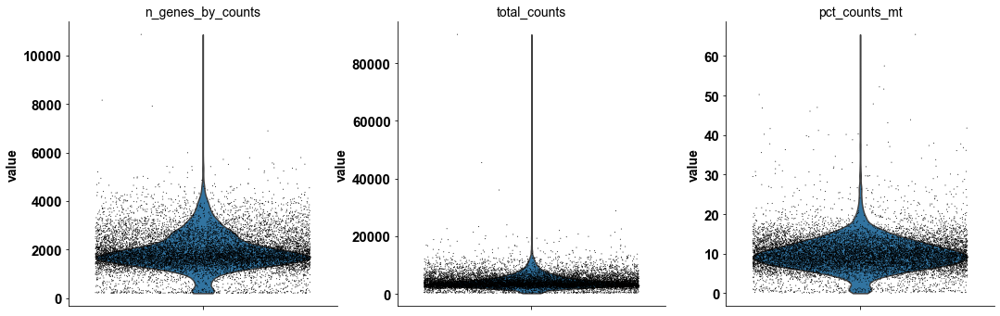

In [9]:
sc.pl.violin(rna_adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [99]:
# sc.pl.scatter(rna_adata, x='total_counts', y='pct_counts_mt')
# sc.pl.scatter(rna_adata, x='total_counts', y='n_genes_by_counts')

In [10]:
rna_adata = rna_adata[rna_adata.obs.n_genes_by_counts < 5000, :]
rna_adata = rna_adata[rna_adata.obs.pct_counts_mt < 20, :]

/fs/home/dongxin/Applications/miniconda3/envs/script/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


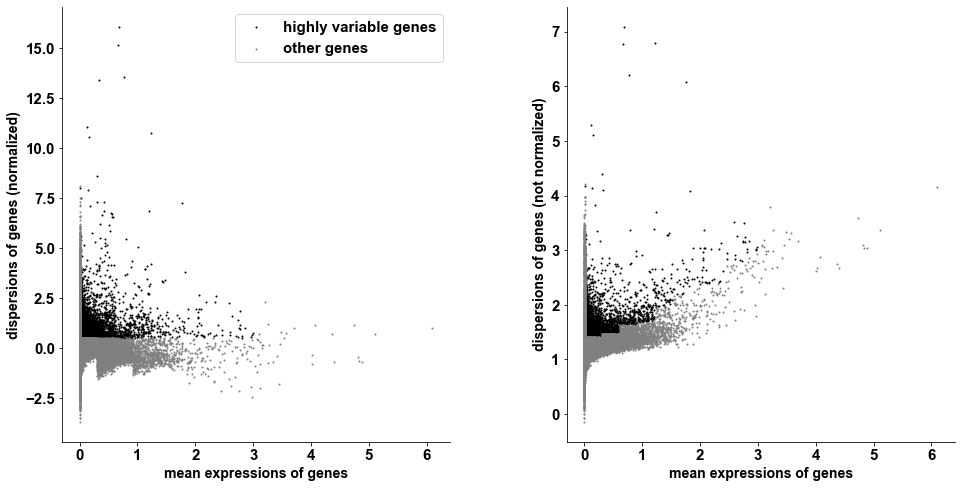

In [11]:
sc.pp.normalize_total(rna_adata, target_sum=1e4)
sc.pp.log1p(rna_adata)
sc.pp.highly_variable_genes(rna_adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(rna_adata)

In [12]:
sc.pp.regress_out(rna_adata, ['total_counts', 'pct_counts_mt'])

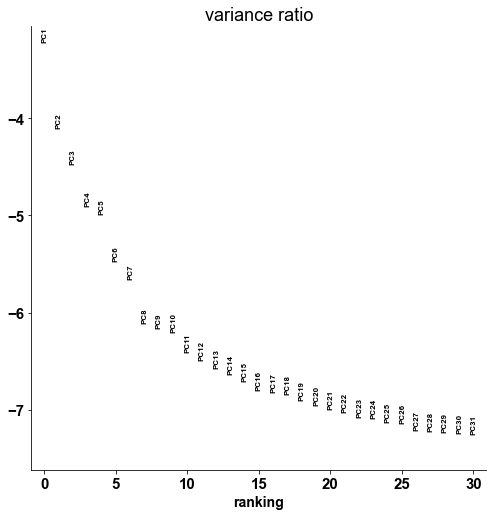

In [13]:
sc.pp.scale(rna_adata, max_value=10)
sc.tl.pca(rna_adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(rna_adata, log=True)
sc.pp.neighbors(rna_adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(rna_adata)

In [15]:
sc.tl.leiden(rna_adata)
sc.tl.louvain(rna_adata)

/fs/home/dongxin/Applications/miniconda3/envs/script/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


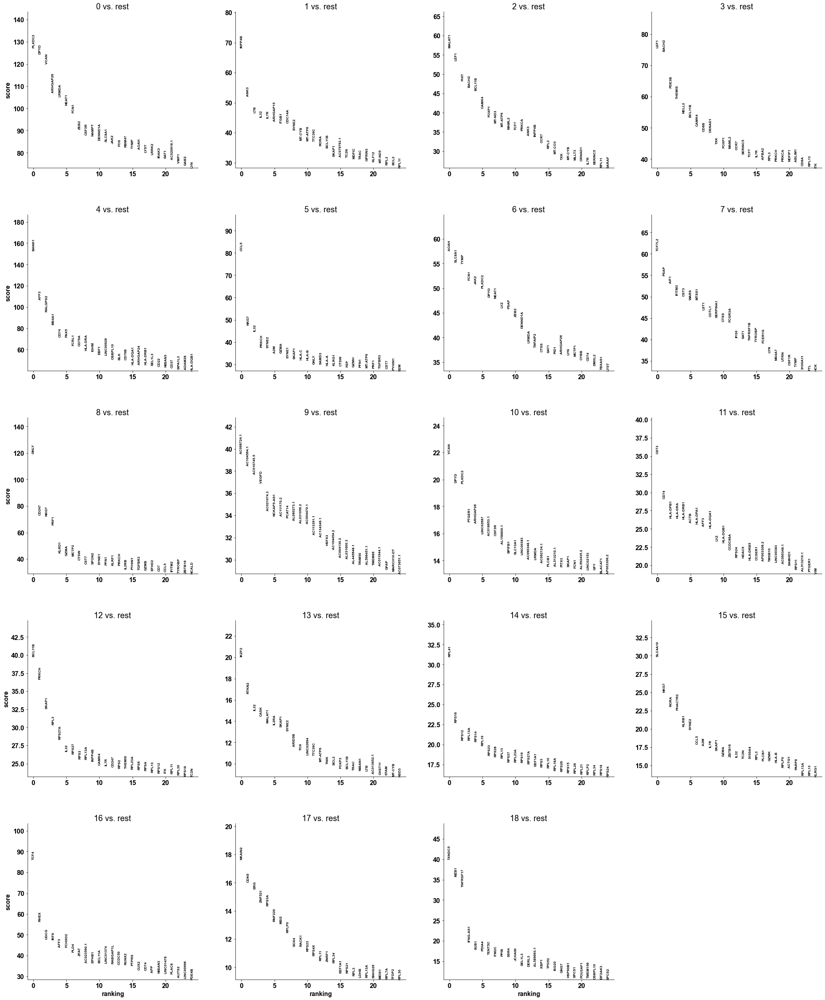

In [35]:
sc.tl.rank_genes_groups(rna_adata, 'louvain', method='t-test')
sc.pl.rank_genes_groups(rna_adata, n_genes=25, sharey=False)

In [ ]:
sc.tl.rank_genes_groups(rna_adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(rna_adata, n_genes=25, sharey=False)

### leiden annotation

categories: 0, 1, 2, etc.
var_group_labels: B, Plasma, T, etc.


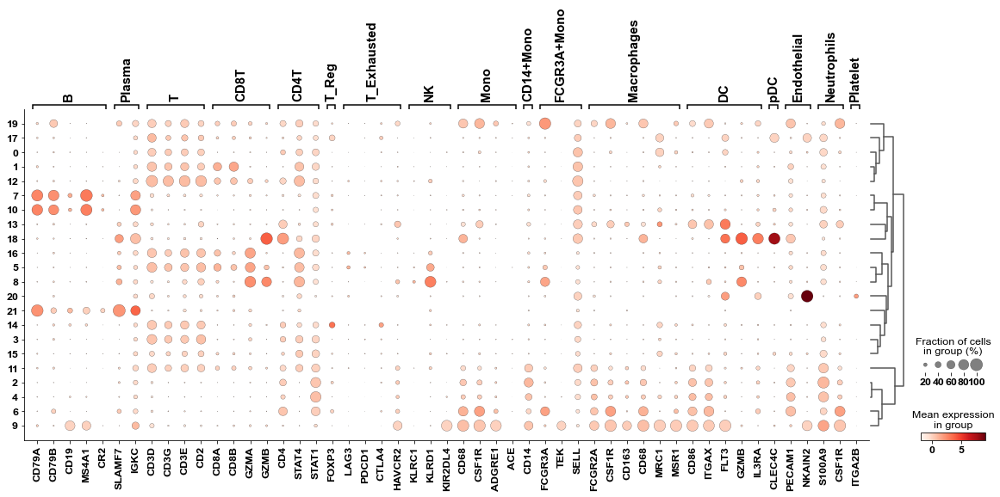

In [34]:
fig, ax = plt.subplots(1,1,figsize=(20,8))
sc.pl.dotplot(rna_adata,marker_dict, 'leiden', dendrogram=True, ax=ax)
fig.savefig(fname='Figures/PBMC_RNA_Marker_leiden.pdf', format='pdf')

In [36]:
rna_adata.obs['leiden_cell_type'] = rna_adata.obs['leiden'].astype("str")

rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['leiden'] == '1') | (rna_adata.obs['leiden'] == '12')].index,'leiden_cell_type'] = 'CD8T'
rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['leiden'] == '0') | (rna_adata.obs['leiden'] == '17')| (rna_adata.obs['leiden'] == '14') | (rna_adata.obs['leiden'] == '3') | (rna_adata.obs['leiden'] == '15')].index,'leiden_cell_type'] = 'CD4T'
rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['leiden'] == '5') | (rna_adata.obs['leiden'] == '8') | (rna_adata.obs['leiden'] == '16')].index,'leiden_cell_type'] = 'NK'

rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['leiden'] == '11')| (rna_adata.obs['leiden'] == '2') | (rna_adata.obs['leiden'] == '4') ].index,'leiden_cell_type'] = 'CD14+Mono'
rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['leiden'] == '6')| (rna_adata.obs['leiden'] == '19')].index,'leiden_cell_type'] = 'FCGR3A+Mono'

rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['leiden'] == '7') | (rna_adata.obs['leiden'] == '10')].index,'leiden_cell_type'] = 'B'
rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['leiden'] == '21') ].index,'leiden_cell_type'] = 'Plasma'

rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['leiden'] == '18')].index,'leiden_cell_type'] = 'pDC'
rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['leiden'] == '13')].index,'leiden_cell_type'] = 'DC'

rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['leiden'] == '20') ].index,'leiden_cell_type'] = 'Endothelial'

rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['leiden'] == '9') ].index,'leiden_cell_type'] = 'UNK'

rna_adata.obs['leiden_cell_type'] = rna_adata.obs['leiden_cell_type'].astype("category")

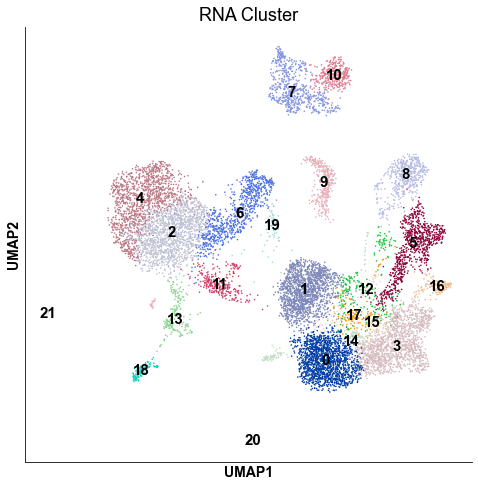

In [37]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
sc.pl.umap(rna_adata, color=['leiden'], title='RNA Cluster', legend_fontsize=15, ax=ax, legend_loc='on data')
fig.savefig(fname='Figures/PBMC_RNA_cluster_leiden.pdf', format='pdf')

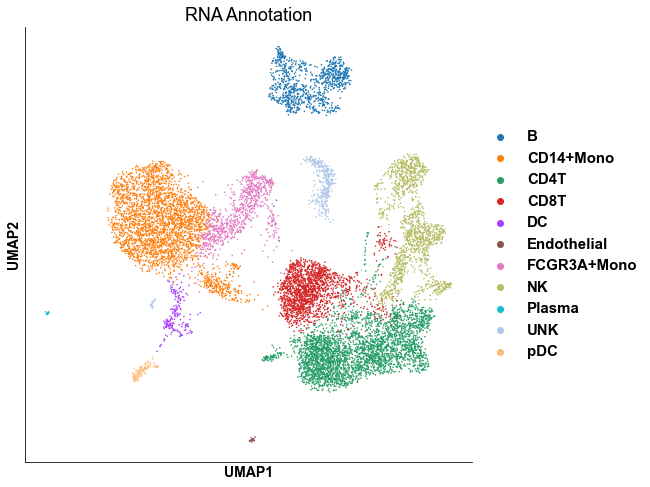

In [38]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
sc.pl.umap(rna_adata, color=['leiden_cell_type'], title='RNA Annotation', legend_fontsize=15,ax=ax)
fig.savefig(fname='Figures/PBMC_RNA_annotation_leiden.pdf', format='pdf')

### louvain annotation

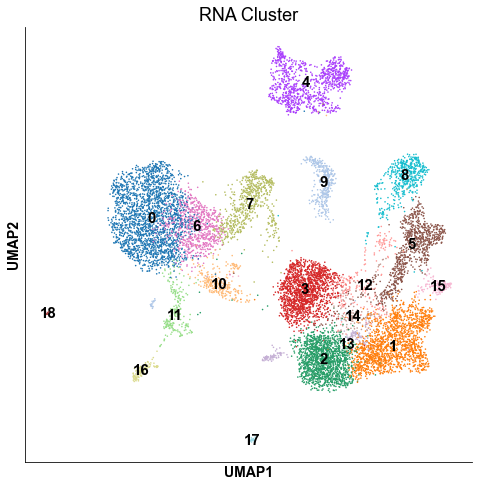

In [39]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
sc.pl.umap(rna_adata, color=['louvain'], legend_loc='on data', title='RNA Cluster', legend_fontsize=15, ax=ax)
fig.savefig(fname='Figures/PBMC_RNA_cluster_louvain.pdf', format='pdf')

categories: 0, 1, 2, etc.
var_group_labels: B, Plasma, T, etc.


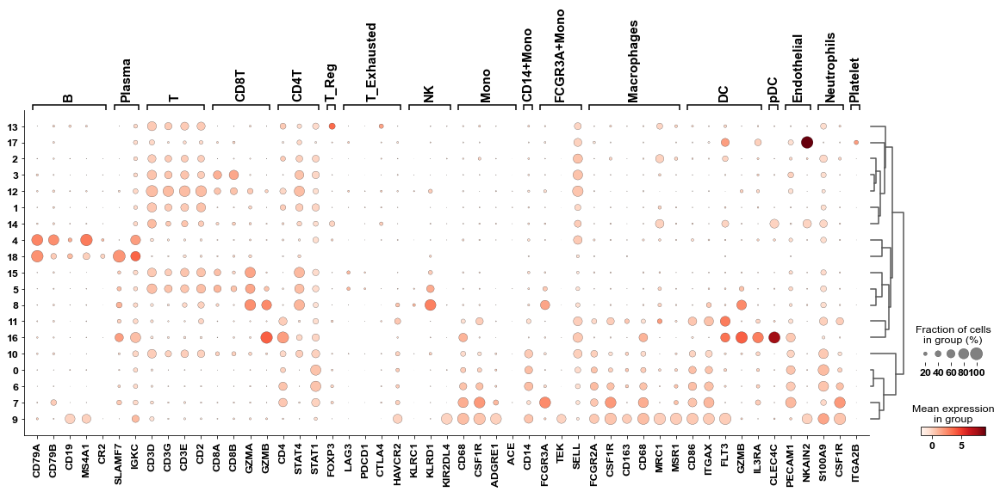

In [40]:
fig, ax = plt.subplots(1,1,figsize=(20,8))
sc.pl.dotplot(rna_adata,marker_dict, 'louvain', dendrogram=True, ax=ax)
fig.savefig(fname='Figures/PBMC_RNA_Marker_louvain.pdf', format='pdf')

In [41]:
rna_adata.obs['louvain_cell_type'] = rna_adata.obs['louvain'].astype("str")

rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['louvain'] == '3') | (rna_adata.obs['louvain'] == '12')].index,'louvain_cell_type'] = 'CD8T'
rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['louvain'] == '1') | (rna_adata.obs['louvain'] == '2')| (rna_adata.obs['louvain'] == '14') | (rna_adata.obs['louvain'] == '13')].index,'louvain_cell_type'] = 'CD4T'
rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['louvain'] == '5') | (rna_adata.obs['louvain'] == '8') | (rna_adata.obs['louvain'] == '15')].index,'louvain_cell_type'] = 'NK'

rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['louvain'] == '0')| (rna_adata.obs['louvain'] == '6') | (rna_adata.obs['louvain'] == '10')| (rna_adata.obs['louvain'] == '9')].index,'louvain_cell_type'] = 'CD14+Mono'
rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['louvain'] == '7')].index,'louvain_cell_type'] = 'FCGR3A+Mono'

rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['louvain'] == '4')].index,'louvain_cell_type'] = 'B'
rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['louvain'] == '18') ].index,'louvain_cell_type'] = 'Plasma'

rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['louvain'] == '16')].index,'louvain_cell_type'] = 'pDC'
rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['louvain'] == '11')].index,'louvain_cell_type'] = 'DC'

rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['louvain'] == '17') ].index,'louvain_cell_type'] = 'Endothelial'

rna_adata.obs.loc[rna_adata.obs[(rna_adata.obs['louvain'] == '9')].index,'louvain_cell_type'] = 'UNK'

rna_adata.obs['louvain_cell_type'] = rna_adata.obs['louvain_cell_type'].astype("category")

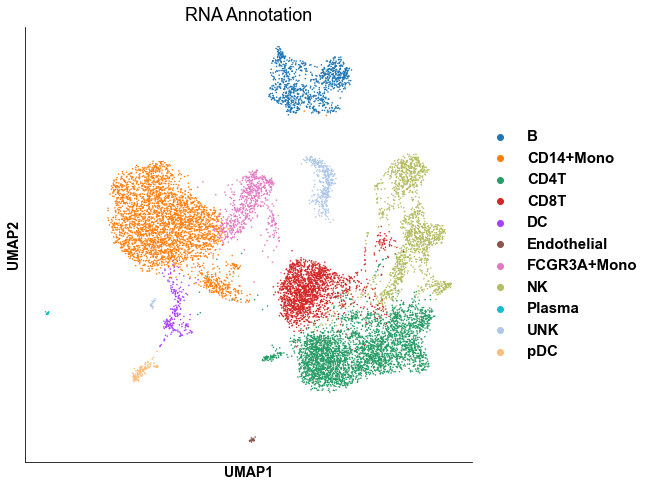

In [42]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
sc.pl.umap(rna_adata, color=['louvain_cell_type'], title='RNA Annotation', legend_fontsize=15,ax=ax)
fig.savefig(fname='Figures/PBMC_RNA_annotation_louvain.pdf', format='pdf')

In [44]:
rna_adata.obs.index = [i.split('-')[0] for i in rna_adata.obs.index]

In [ ]:
rna_adata.obs

In [46]:
rna_adata.write_h5ad('example/PBMC/data/PBMC_granulocyte_sorted_10k_scanpy_reannotate.h5ad')

In [79]:
rna_adata = ad.read_h5ad('example/PBMC/data/PBMC_granulocyte_sorted_10k_scanpy_reannotate.h5ad')

In [47]:
mean_expr_dict = {}
for i in rna_adata.obs['louvain_cell_type'].unique():
#     rna_adata[rna_adata.obs.index[rna_adata.obs['louvain_cell_type'] == i],:].to_df().mean()
    mean_expr_dict[i] = rna_adata[rna_adata.obs.index[rna_adata.obs['louvain_cell_type'] == i],:].to_df().mean()

In [48]:
pd.DataFrame(mean_expr_dict)

,CD8T,CD4T,FCGR3A+Mono,UNK,NK,CD14+Mono,DC,B,Plasma,pDC,Endothelial
AL627309.1,-0.057949,-0.048074,-0.067073,-0.021501,-0.050355,0.104124,-0.114125,-0.094658,-0.101158,0.100848,-0.111458
AL627309.5,-0.143024,-0.116387,0.005835,-0.018578,-0.150888,0.351278,-0.313130,-0.127978,-0.496683,-0.101742,-0.403687
AL627309.4,-0.054125,-0.038937,0.077320,-0.010451,-0.048972,0.033373,-0.114082,-0.060146,-0.156744,-0.076127,-0.126437
AL669831.2,-0.030043,-0.024505,-0.010708,-0.030299,-0.017017,-0.016459,-0.024818,-0.010063,-0.012724,-0.026592,-0.021525
LINC01409,-0.011655,0.009092,-0.067140,-0.146825,0.042564,-0.012605,0.082681,0.044620,-0.119110,0.070459,-0.215764
...,...,...,...,...,...,...,...,...,...,...,...
AL592183.1,0.117326,0.103251,-0.083052,-0.382714,-0.007184,-0.166209,0.057568,0.166602,-0.340540,-0.085721,0.197646
AC240274.1,0.074837,-0.031882,0.011027,-0.051546,-0.052899,0.004830,0.049778,0.057665,-0.171293,-0.103511,-0.078524
AC004556.3,-0.002976,0.045596,0.041195,0.077299,0.028251,-0.101524,0.128215,0.029322,0.199951,-0.040628,-0.145456
AC007325.1,-0.018987,-0.018284,-0.022653,-0.033126,-0.018678,-0.005493,-0.028334,-0.012541,-0.072496,-0.031185,-0.040141


In [49]:
pd.DataFrame(mean_expr_dict).to_csv('example/PBMC/cluster_expr.txt', sep='\t')

## ATAC_filter

In [50]:
atac_adata = sc.read_10x_h5('example/PBMC/data/PBMC_granulocyte_sorted_10k_peak_count.h5', gex_only=False)

In [51]:
keys.index = keys['RNA']

In [52]:
atac_index = list(set(atac_adata.obs.index).intersection(set(keys.loc[rna_adata.obs.index,'ATAC'])))

In [53]:
atac_adata = atac_adata[atac_index,:]

In [ ]:
atac_adata.var

In [55]:
destination = 'example/PBMC/data/ATAC/filtered_mtx'
pd.DataFrame(atac_adata.var.index).to_csv(os.path.join(destination, "features.tsv" ),   sep = "\t", index = False, header=False)
pd.DataFrame(atac_adata.obs.index).to_csv(os.path.join(destination, "barcodes.tsv"), sep = "\t", index = False, header=False)
io.mmwrite(os.path.join(destination, "matrix.mtx"), atac_adata.X.T)

In [60]:
atac_peakcount = sc.read_10x_h5('example/PBMC/data/ATAC/filtered_mtx/PBMC_granulocyte_sorted_10k_filtered_peak_count.h5', gex_only=False)

In [ ]:
# atac_peakcount = sc.read_10x_mtx('example/PBMC/data/ATAC/filtered_mtx/mtx', gex_only=False)

In [61]:
atac_peakcount

AnnData object with n_obs × n_vars = 11347 × 141535
    var: 'gene_ids', 'feature_types', 'genome'

## ATAC reannotate

In [70]:
atac_adata = read_SingleCellExperiment_rds('example/PBMC/pbmc_ATAC_singlecellexperiment.rds')

In [83]:
# atac_adata = sc.read_h5ad('example/PBMC/data/ATAC/PBMC_granulocyte_sorted_10k_scATAC_Object_filter_no_match_reannotate.h5ad')

In [91]:
# metadata = atac_adata.obs.copy()

In [71]:
atac_adata.obs['Celltype'] = atac_adata.obs['seurat_clusters'].astype('str')
keys.index = keys['ATAC']
for i in atac_adata.obs.index:
    rna_bc = keys.loc[i,'RNA']
    try:
        atac_adata.obs.loc[i, 'Celltype'] = str(rna_adata.obs.loc[rna_bc,'louvain_cell_type'])
    except:
        atac_adata.obs.loc[i, 'Celltype'] = 'N'
atac_adata.obs['Celltype'] = atac_adata.obs['Celltype'].astype("category")

In [72]:
atac_adata.obs

,orig.ident,nCount_ATAC,nFeature_ATAC,ATAC_snn_res.0.6,seurat_clusters,ident,Celltype
ATTGTCAGTCACTCAG,atac,5646.0,5646,2,2,2,CD4T
TATGTCAGTGCAAGTA,atac,3647.0,3647,2,2,2,CD4T
CGGGTCACAGCATTAG,atac,2790.0,2790,8,8,8,CD14+Mono
GGTAATGGTATAGCGA,atac,5843.0,5843,10,10,10,NK
TCACGCCCATAGTCAG,atac,6026.0,6026,3,3,3,CD8T
...,...,...,...,...,...,...,...
GTACTTAGTTGCGAGG,atac,6885.0,6885,2,2,2,CD4T
GGTTAAGGTTCCTCAC,atac,6435.0,6435,1,1,1,CD4T
TCCACAATCTATGCAT,atac,7428.0,7428,0,0,0,CD14+Mono
ATTGGCGAGTTGCAAA,atac,9552.0,9552,16,16,16,pDC


In [73]:
atac_adata.obs['seurat_clusters'] = atac_adata.obs['seurat_clusters'].astype('category')
atac_adata.obs['nFeature_ATAC'] = atac_adata.obs['nFeature_ATAC'].astype('category')

In [74]:
atac_adata.write_h5ad('example/PBMC/data/PBMC_granulocyte_sorted_10k_scATAC_Object_filter_no_match_reannotate.h5ad')

/fs/home/dongxin/Applications/miniconda3/envs/script/lib/python3.9/site-packages/anndata-0.7.6-py3.9.egg/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'nFeature_ATAC' as categorical
/fs/home/dongxin/Applications/miniconda3/envs/script/lib/python3.9/site-packages/anndata-0.7.6-py3.9.egg/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'seurat_clusters' as categorical


In [163]:
atac_adata = ad.read_h5ad('example/PBMC/data/PBMC_granulocyte_sorted_10k_scATAC_Object_filter_no_match_reannotate.h5ad')

In [76]:
metadata = atac_adata.obs.copy()

In [77]:
metadata

,orig.ident,nCount_ATAC,nFeature_ATAC,ATAC_snn_res.0.6,seurat_clusters,ident,Celltype
ATTGTCAGTCACTCAG,atac,5646.0,5646,2,2,2,CD4T
TATGTCAGTGCAAGTA,atac,3647.0,3647,2,2,2,CD4T
CGGGTCACAGCATTAG,atac,2790.0,2790,8,8,8,CD14+Mono
GGTAATGGTATAGCGA,atac,5843.0,5843,10,10,10,NK
TCACGCCCATAGTCAG,atac,6026.0,6026,3,3,3,CD8T
...,...,...,...,...,...,...,...
GTACTTAGTTGCGAGG,atac,6885.0,6885,2,2,2,CD4T
GGTTAAGGTTCCTCAC,atac,6435.0,6435,1,1,1,CD4T
TCCACAATCTATGCAT,atac,7428.0,7428,0,0,0,CD14+Mono
ATTGGCGAGTTGCAAA,atac,9552.0,9552,16,16,16,pDC


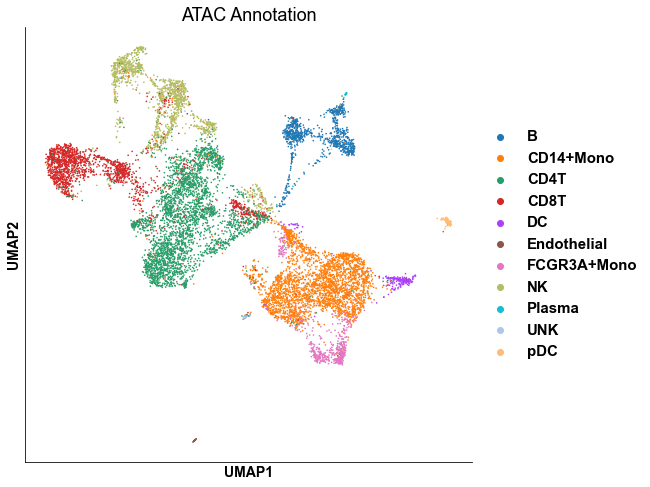

In [78]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
sc.pl.umap(atac_adata, color=['Celltype'], title='ATAC Annotation',ax=ax)
fig.savefig(fname='Figures/PBMC_ATAC_annotation.pdf', format='pdf')

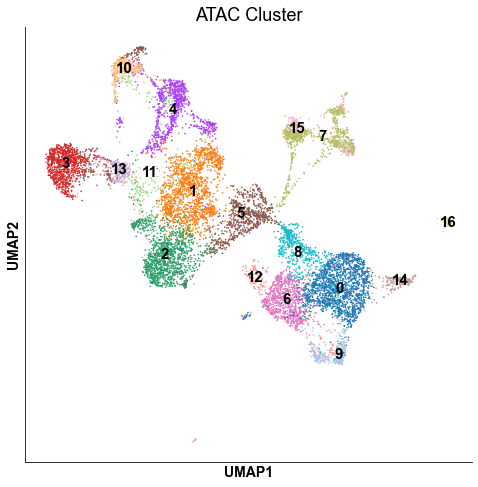

In [79]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
sc.pl.umap(atac_adata, color=['seurat_clusters'], legend_loc='on data', title='ATAC Cluster',ax=ax)
fig.savefig(fname='Figures/PBMC_ATAC_cluster.pdf', format='pdf')

In [56]:
rna_adata

AnnData object with n_obs × n_vars = 12108 × 26412
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_cell_type', 'louvain_cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'rank_genes_groups', 'leiden', 'louvain', 'dendrogram_leiden', 'leiden_cell_type_colors', 'louvain_colors', 'dendrogram_louvain', 'louvain_cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [80]:
# pbmc_expr = pd.DataFrame(rna_adata.X, columns=rna_adata.var.index, index=rna_adata.obs.index)

# with open('example/PBMC/rna_expression_normal.pk', 'wb+') as f:
#     pickle.dump(pbmc_expr, f)

In [ ]:
# pbmc_expr

In [66]:
# tmp = {}
# for i in rna_adata.obs['louvain_cell_type'].cat.categories:
#     locals()['%s_bc' % i] = rna_adata.obs['louvain_cell_type'][rna_adata.obs['louvain_cell_type'] == i].index.tolist()
#     locals()['%s_expr' % i] = pbmc_expr.loc[locals()['%s_bc' % i],:].mean()
#     tmp[i] = locals()['%s_expr' % i]

# celltype_expr = pd.DataFrame(tmp)

# celltype_expr.to_csv('example/PBMC/cluster_expr_normal.txt', sep='\t')

---------

In [23]:
script_table = pd.read_csv('example/PBMC/multiome_pbmc_SCRIPT_20210917/enrichment/SCRIPT_enrichment.txt', sep='\t', index_col=0)

In [52]:
source_table = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210917/enrichment/dataset_score_resource_df.pk')

In [125]:
source_table.loc['GATA1',:].unique()

array(['GATA1_46025', 'GATA1_33543'], dtype=object)

In [123]:
source_table

,TGGTCTATCATGGTTT,TATCCGGGTGGGTAAC,GAACTTAAGATTCGTT,AGTAACGGTATAGTGG,AGTAATCCAGCTACCC,GAGAGGAGTTTATTCC,GGGATAAAGTGAGGAA,TTTGCTGAGTATCGCC,CACTTCAAGATATTGG,GTATTGTTCCCGGAAA,...,AATGGCCCAGTAATCG,AAGAATCGTAAACCGA,GGCGCTTGTCATCACG,CGTAACCTCGTCCTTT,AAGAATCGTTAGCTCG,CCAACTGGTCCTTGAG,TCCGGTTAGCTTTAAC,GAAGTCAGTTACTCCC,ATTTCGCCACCACAAA,GATTACGCATGACAAT
Factor,,,,,,,,,,,,,,,,,,,,,
ADNP,ADNP_63581,ADNP_63582,ADNP_63581,ADNP_63581,ADNP_63582,ADNP_63581,ADNP_63581,ADNP_63582,ADNP_63581,ADNP_63582,...,ADNP_63582,ADNP_63581,ADNP_63581,ADNP_63581,ADNP_63581,ADNP_63581,ADNP_63581,ADNP_63581,ADNP_63581,ADNP_63581
AFF1,AFF1_72089,AFF1_72089,AFF1_72089,AFF1_72089,AFF1_73713,AFF1_72089,AFF1_73713,AFF1_73713,AFF1_72089,AFF1_73713,...,AFF1_73713,AFF1_73713,AFF1_72089,AFF1_72089,AFF1_72089,AFF1_72089,AFF1_72089,AFF1_72089,AFF1_72089,AFF1_73713
AFF4,AFF4_69872,AFF4_69872,AFF4_69872,AFF4_69872,AFF4_69872,AFF4_69872,AFF4_69872,AFF4_69872,AFF4_69872,AFF4_69872,...,AFF4_69872,AFF4_69872,AFF4_69872,AFF4_69872,AFF4_69872,AFF4_69872,AFF4_69872,AFF4_69872,AFF4_69872,AFF4_69872
AGO1,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,...,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026
AHR,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,...,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSCAN23,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64288,ZSCAN23_64289,ZSCAN23_64288,ZSCAN23_64289,ZSCAN23_64288,ZSCAN23_64289,...,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64288,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289
ZSCAN29,ZSCAN29_62919,ZSCAN29_62919,ZSCAN29_62919,ZSCAN29_62919,ZSCAN29_62919,ZSCAN29_62919,ZSCAN29_62919,ZSCAN29_62919,ZSCAN29_62919,ZSCAN29_62919,...,ZSCAN29_62919,ZSCAN29_62919,ZSCAN29_62919,ZSCAN29_62919,ZSCAN29_62919,ZSCAN29_62919,ZSCAN29_62919,ZSCAN29_62919,ZSCAN29_62919,ZSCAN29_62919
ZSCAN5A,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63377,ZSCAN5A_63377,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,...,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63377,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63377,ZSCAN5A_63377,ZSCAN5A_63377,ZSCAN5A_63377


In [25]:
pbmc_script_adata = atac_adata.copy()

In [35]:
pbmc_script_adata.var.index = ['RP_' + i for i in pbmc_script_adata.var.index]

In [26]:
pbmc_script_adata.obs = pd.concat([pbmc_script_adata.obs, script_table.reindex(pbmc_script_adata.obs.index)], axis=1)

In [36]:
pbmc_script_adata.obs

,orig.ident,nCount_ATAC,nFeature_ATAC,ATAC_snn_res.0.6,seurat_clusters,nCount_ACTIVITY,nFeature_ACTIVITY,assign.ident,assign.score,assign.celltype,...,ZNF83,ZSCAN16,ZSCAN2,ZSCAN20,ZSCAN22,ZSCAN23,ZSCAN29,ZSCAN5A,ZXDB,ZXDC
AAACAAGCAGGACCTG,example/PBMC/analysis,5762.0,5762,2,2,5013.126845,10550,NaiveCD4Tcells,0.456238,CD4T,...,0.043792,0.053657,0.223397,0.101921,0.037965,0.018673,-0.035105,0.038908,-0.015559,0.046451
AAACAAGCATTGACTC,example/PBMC/analysis,4603.0,4603,3,3,4241.395171,9022,Others,0.050106,NK,...,-0.020465,-0.022890,-0.075894,-0.007076,-0.018920,0.004195,0.156144,0.043523,-0.015070,0.025848
AAACCAGGTCCCAGAC,example/PBMC/analysis,4559.0,4559,3,3,4074.728270,9158,Others,0.050106,CD8T,...,0.001821,0.219814,0.193634,0.077188,-0.007031,0.193119,-0.037545,0.030251,0.009878,0.020010
AAACCAGGTCCTGCAA,example/PBMC/analysis,7915.0,7915,13,13,6866.769580,13020,CD8Tcells,1.292075,CD8T,...,-0.001310,0.073369,-0.105025,0.053781,-0.001351,0.003433,0.046647,0.047326,-0.001380,-0.001355
AAACCAGGTGAACCGG,example/PBMC/analysis,6205.0,6205,1,1,5532.169240,10988,RestMemCD4Tcells,0.404729,CD4T,...,-0.007346,-0.089702,0.171376,-0.006037,-0.008830,0.027801,0.081923,0.031244,0.011170,0.077723
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCGAGGTGGCTA,example/PBMC/analysis,8270.0,8270,0,0,6516.581875,13934,Monocytes,1.991831,CD14Mono,...,-0.011221,0.031713,0.275169,0.009584,0.002157,-0.166946,-0.081842,-0.054461,-0.018979,-0.103105
TTTGTGAGTACCTTGG,example/PBMC/analysis,7202.0,7202,6,6,6337.272428,11983,ActNK,1.092253,NK,...,-0.004539,-0.098657,0.165317,0.050943,-0.041390,-0.080778,0.015481,-0.005646,-0.016906,-0.035252
TTTGTGAGTCATGAAG,example/PBMC/analysis,7409.0,7409,1,1,6432.974213,12584,RestMemCD4Tcells,0.404729,CD4T,...,-0.008800,0.082017,0.080147,0.101529,0.008469,0.127262,0.052834,0.066012,-0.007340,-0.008803
TTTGTGAGTGCAATAG,example/PBMC/analysis,6197.0,6197,1,1,5674.243385,10956,RestMemCD4Tcells,0.404729,CD4T,...,0.017594,0.128130,-0.211197,-0.008979,-0.005768,-0.019598,-0.092784,0.073634,-0.011995,0.030065


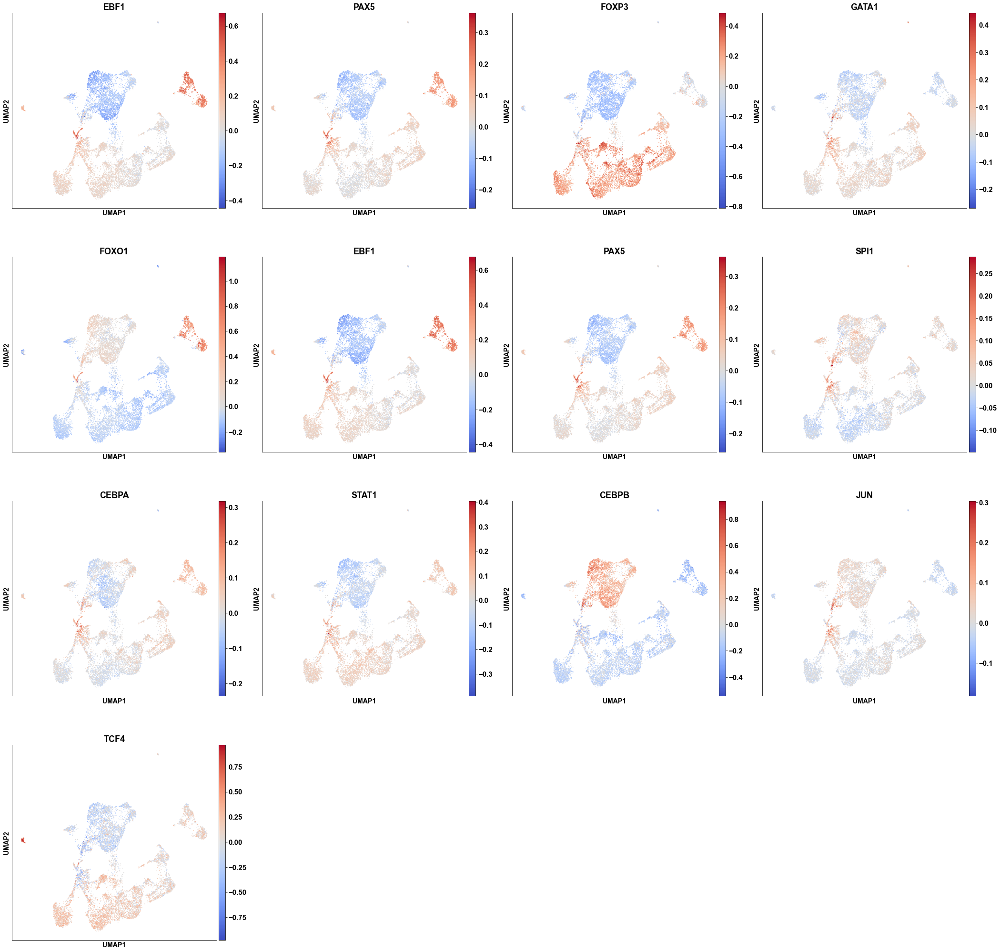

In [121]:
# sc.pl.umap(pbmc_script_adata,color = ['EBF1', 'PAX5'], color_map='coolwarm')
# sc.pl.umap(pbmc_script_adata,color = ['STAT1', 'EOMES'], color_map='coolwarm')
# sc.pl.umap(pbmc_script_adata,color = ['CEBPB', 'JUNB'], color_map='coolwarm')
sc.pl.umap(pbmc_script_adata,color = ['EBF1', 'PAX5', 'FOXP3', 'GATA1', 'FOXO1', 'EBF1', 'PAX5','SPI1', 'CEBPA', 'STAT1','CEBPB', 'JUN', 'TCF4'], color_map='coolwarm', vcenter=0)
# sc.pl.umap(pbmc_script_adata,color = ['EBF1', 'PAX5', 'FOXP3', 'GATA1', 'FOXO1', 'EBF1', 'PAX5','SPI1', 'CEBPA', 'STAT1','CEBPB', 'JUN'], color_map='coolwarm', vcenter=0)

In [ ]:
# sc.pl.umap(pbmc_script_adata, color=['I_STAT4','I_TBX21', 'I_GATA3', 'I_FOXP3', 'I_BCL11B'], wspace=0.3) # T
# sc.pl.umap(pbmc_script_adata, color=['I_FOXO1','I_EBF1', 'I_PAX5', 'I_SPI1', 'I_BCL11A'], wspace=0.3) # B
# sc.pl.umap(pbmc_script_adata, color=['I_CEBPA','I_CEBPB', 'I_STAT1'], wspace=0.3) # mono/macro
for tf in ['STAT4','TBX21', 'GATA1','GATA3', 'FOXP3', 'FOXO1','EBF1', 'PAX5', 'SPI1', 'CEBPA','CEBPB', 'STAT1','JUNB','JUN','BCL6','IRF4']:
# for tf in ['PBX1']:
    fig, ax = plt.subplots(1,1,figsize=(6,6))
    sc.pl.umap(pbmc_script_adata, color=[tf], title=tf, wspace=0.3, ax=ax) 
    fig.savefig(fname='Figures/PBMC_SCRIPT_%s_integrated.pdf' % tf, transparent=True, bbox_inches='tight', pad_inches=0.5)

In [ ]:
sc.pl.umap(pbmc_script_adata, color=['C_TEAD1'], wspace=0.3) # mono/macro

In [372]:
def standardScaler(t):
    scaler = preprocessing.StandardScaler().fit(t)
    rt = pd.DataFrame(scaler.transform(t), index = t.index, columns = t.columns)
    return rt

def minmaxScaler(t, frange=(0,1)):
    scaler = preprocessing.MinMaxScaler(feature_range=frange).fit(t)
    rt = pd.DataFrame(scaler.transform(t), index = t.index, columns = t.columns)
    return rt

def l2norm(t):
    rt = preprocessing.normalize(t, norm='l2')
    rt = pd.DataFrame(rt, index = t.index, columns=t.columns)
    return rt

def plot_tf_distribution(t, tf_list):
    fig, ax = plt.subplots(1,tf_list.__len__(), figsize=(20,6))
    for i in range(tf_list.__len__()):
        sns.histplot(t[tf_list[i]], ax=ax[i])
    fig.show()


# @excute_info('Summary result from dataset level to factor level.')
def map_factor_on_ChIP(table):
    ret_table = table.copy()
    # map factor by id "_"
    factor_index_list = []
    for i in ret_table.index:
        factor_name = i.split("_")
        factor_index_list.append(factor_name[0])
    ret_table.loc[:, "Factor"] = factor_index_list
    factor_table = ret_table.groupby("Factor").max()
    return factor_table

def score_normalization(data_cell_frame):
    tf_cell_table = map_factor_on_ChIP(data_cell_frame)
#     tf_cell_frame_score = (tf_cell_table.T - tf_cell_table.mean(1)).T
    tf_cell_frame_score = standardScaler(tf_cell_table)
    tf_cell_frame_score = (tf_cell_frame_score.T - tf_cell_frame_score.mean(1)).T
#     tf_cell_frame_zscore = tf_cell_table.apply(scipy.stats.zscore, axis=1)
#     tf_cell_frame_zscore = tf_cell_frame_score.apply(scipy.stats.zscore, axis=0)
    return tf_cell_table, tf_cell_frame_score

In [78]:
ChIP_table_mbm = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210824//enrichment/dataset_mbm_overlap_df.pk')
ChIP_table_hyper_bg = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210824/enrichment/dataset_bg_peak_norm_df.pk').reindex(columns = ChIP_table_mbm.columns)
ChIP_table_score = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210824/enrichment/dataset_raw_score_df.pk')
ChIP_table_res = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210824/enrichment/dataset_score_df.pk')

In [373]:
tmp1 ,tmp = score_normalization(ChIP_table_score)

In [369]:
ChIP_table_mbm

,TGGTCTATCATGGTTT,TATCCGGGTGGGTAAC,GAACTTAAGATTCGTT,AGTAACGGTATAGTGG,AGTAATCCAGCTACCC,GAGAGGAGTTTATTCC,GGGATAAAGTGAGGAA,TTTGCTGAGTATCGCC,CACTTCAAGATATTGG,GTATTGTTCCCGGAAA,...,AATGGCCCAGTAATCG,AAGAATCGTAAACCGA,GGCGCTTGTCATCACG,CGTAACCTCGTCCTTT,AAGAATCGTTAGCTCG,CCAACTGGTCCTTGAG,TCCGGTTAGCTTTAAC,GAAGTCAGTTACTCCC,ATTTCGCCACCACAAA,GATTACGCATGACAAT
ADNP_63581,239.036606,248.834274,180.091599,232.923416,120.886406,235.496811,49.075306,204.942001,214.447433,212.660904,...,88.136681,150.596222,157.899841,290.385101,242.537689,211.904816,167.209290,256.297394,270.285889,222.379608
ADNP_63582,239.211182,266.246246,186.640594,243.687408,132.139526,253.847000,51.999054,218.606415,223.156006,230.740509,...,94.860901,153.153595,169.920364,303.092560,253.122650,213.828629,174.515839,268.609406,291.025391,227.730682
AFF1_34966,127.125771,126.823845,95.219025,129.454605,54.428494,137.334152,26.506575,96.437584,116.110008,101.618050,...,53.746193,65.797882,81.416229,170.600128,132.274704,113.421265,87.647331,129.203567,140.468246,113.342735
AFF1_72089,453.838196,500.282837,381.091583,475.852905,230.052200,497.179138,97.041779,387.189117,446.019501,372.116333,...,189.660797,254.056747,312.123413,608.871094,531.420654,423.840424,324.016113,481.061310,496.206970,436.211273
AFF1_73709,136.007156,145.149719,119.254387,156.943893,64.731750,150.527023,24.170084,126.042076,137.261490,117.536758,...,62.180771,85.219620,97.102264,195.480286,162.149567,132.385620,98.265633,148.236099,157.216537,128.434631
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSCAN5A_63376,211.193512,241.964981,182.954208,213.484177,117.874893,221.588531,48.117558,183.544159,200.990097,187.715103,...,93.580650,124.508392,132.192871,277.475250,237.285599,199.133850,144.587738,220.588409,229.566757,202.546661
ZSCAN5A_63377,129.823090,143.761078,117.180405,134.869415,73.315575,130.421997,28.551949,112.474525,123.829247,114.177628,...,49.982655,77.094818,81.786026,175.376877,142.619019,109.632561,90.782806,137.635925,145.290924,127.921021
ZXDB_63902,1079.912964,1189.882324,906.369446,1127.451660,575.313660,1139.283081,234.302216,908.720032,1049.181396,957.262634,...,448.375427,633.347900,750.554688,1370.046631,1246.601929,974.316101,764.269287,1150.991821,1128.641357,1060.702637
ZXDB_63903,1005.727356,1115.475830,841.231323,1057.411133,529.699402,1059.122803,224.931732,853.842407,977.080444,888.605591,...,414.902985,594.659729,696.068481,1270.393677,1154.471436,929.754761,708.811157,1074.029663,1047.934937,979.030212


In [370]:
ChIP_table_hyper_bg

,TGGTCTATCATGGTTT,TATCCGGGTGGGTAAC,GAACTTAAGATTCGTT,AGTAACGGTATAGTGG,AGTAATCCAGCTACCC,GAGAGGAGTTTATTCC,GGGATAAAGTGAGGAA,TTTGCTGAGTATCGCC,CACTTCAAGATATTGG,GTATTGTTCCCGGAAA,...,AATGGCCCAGTAATCG,AAGAATCGTAAACCGA,GGCGCTTGTCATCACG,CGTAACCTCGTCCTTT,AAGAATCGTTAGCTCG,CCAACTGGTCCTTGAG,TCCGGTTAGCTTTAAC,GAAGTCAGTTACTCCC,ATTTCGCCACCACAAA,GATTACGCATGACAAT
0,,,,,,,,,,,,,,,,,,,,,
ADNP_63581,78.260573,81.857014,58.480150,78.995057,38.940334,80.236083,19.058602,88.796624,71.840167,89.341156,...,30.823015,71.979466,66.977374,110.856482,84.668316,71.396943,70.915730,80.071457,109.539475,72.840585
ADNP_63582,81.609927,85.360286,60.982952,82.375846,40.606881,83.669984,19.874262,92.596895,74.914744,93.164731,...,32.142162,75.060004,69.843836,115.600858,88.291905,74.452552,73.950743,83.498312,114.227487,75.957978
AFF1_34966,29.721763,31.087618,22.209563,30.000705,14.788741,30.472021,7.238067,33.723140,27.283424,33.929941,...,11.705950,27.336327,25.436635,42.101022,32.155293,27.115097,26.932342,30.409500,41.600850,27.663363
AFF1_72089,83.588079,87.429344,62.461125,84.372563,41.591156,85.698070,20.355997,94.841361,76.730611,95.422961,...,32.921260,76.879392,71.536788,118.402920,90.432022,76.257215,75.743243,85.522237,116.996260,77.799131
AFF1_73709,29.654188,31.016937,22.159068,29.932496,14.755118,30.402740,7.221611,33.646467,27.221393,33.852799,...,11.679336,27.274176,25.378803,42.005301,32.082185,27.053449,26.871109,30.340361,41.506267,27.600468
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSCAN5A_63376,45.119931,47.193403,33.715832,45.543386,22.450451,46.258880,10.987944,51.194329,41.418344,51.508270,...,17.770536,41.498655,38.614776,63.912601,48.814216,41.162811,40.885374,46.163968,63.153301,41.995120
ZSCAN5A_63377,27.746121,29.021186,20.733267,28.006522,13.805716,28.446509,6.756944,31.481522,25.469862,31.674577,...,10.927841,25.519248,23.745831,39.302516,30.017891,25.312724,25.142116,28.388143,38.835591,25.824545
ZXDB_63902,219.686028,229.781632,164.160207,221.747807,109.309796,225.231501,53.499591,249.261882,201.663243,250.790442,...,86.523591,202.054269,188.012849,311.186326,237.673266,200.419066,199.068246,224.769378,307.489344,204.471527


In [371]:
ChIP_table_score

,TGGTCTATCATGGTTT,TATCCGGGTGGGTAAC,GAACTTAAGATTCGTT,AGTAACGGTATAGTGG,AGTAATCCAGCTACCC,GAGAGGAGTTTATTCC,GGGATAAAGTGAGGAA,TTTGCTGAGTATCGCC,CACTTCAAGATATTGG,GTATTGTTCCCGGAAA,...,AATGGCCCAGTAATCG,AAGAATCGTAAACCGA,GGCGCTTGTCATCACG,CGTAACCTCGTCCTTT,AAGAATCGTTAGCTCG,CCAACTGGTCCTTGAG,TCCGGTTAGCTTTAAC,GAAGTCAGTTACTCCC,ATTTCGCCACCACAAA,GATTACGCATGACAAT
ADNP_63581,1.598579,1.592276,1.606239,1.548054,1.609619,1.541628,1.319878,1.197505,1.564530,1.241868,...,1.485949,1.054671,1.224991,1.381278,1.507311,1.556208,1.225878,1.666171,1.295252,1.597012
ADNP_63582,1.539916,1.629730,1.598029,1.553238,1.678045,1.589709,1.344241,1.230388,1.562051,1.299252,...,1.532275,1.019159,1.270610,1.382932,1.508924,1.509545,1.227587,1.673876,1.341609,1.571507
AFF1_34966,2.060228,1.994068,2.051603,2.073175,1.811732,2.136016,1.739399,1.488581,2.049836,1.554748,...,2.107254,1.237150,1.640390,1.993257,2.007092,2.024938,1.666141,2.051496,1.731524,1.996085
AFF1_72089,2.426827,2.503028,2.589973,2.481700,2.439593,2.522593,2.198755,2.018039,2.523783,1.952177,...,2.490747,1.711505,2.109947,2.352666,2.541795,2.459179,2.082400,2.478074,2.075105,2.472079
AFF1_73709,2.160095,2.190540,2.376440,2.352217,2.060770,2.270613,1.614217,1.874526,2.292538,1.765988,...,2.317006,1.608531,1.894907,2.191798,2.302069,2.249353,1.832524,2.251503,1.896153,2.178113
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSCAN5A_63376,2.201918,2.333841,2.405681,2.204223,2.341756,2.235722,2.034655,1.822001,2.251524,1.845593,...,2.333075,1.562295,1.749406,2.100979,2.258062,2.246922,1.797370,2.232125,1.845589,2.243115
ZSCAN5A_63377,2.186178,2.269621,2.443014,2.227772,2.327510,2.158038,1.929693,1.804677,2.237533,1.817620,...,2.095674,1.558187,1.742202,2.129720,2.211074,2.071944,1.811848,2.237995,1.876710,2.264862
ZXDB_63902,2.292183,2.367431,2.457824,2.340861,2.385293,2.333520,2.110198,1.861984,2.373482,1.928198,...,2.360177,1.643409,1.991394,2.134798,2.386049,2.275670,1.935475,2.351209,1.872572,2.369369
ZXDB_63903,2.286561,2.371327,2.447152,2.345376,2.362832,2.325326,2.147133,1.869229,2.367783,1.917954,...,2.344764,1.649538,1.979695,2.123020,2.372362,2.305112,1.923851,2.348420,1.862718,2.350809


In [368]:
tmp1.max().max()

3.3974443730057797

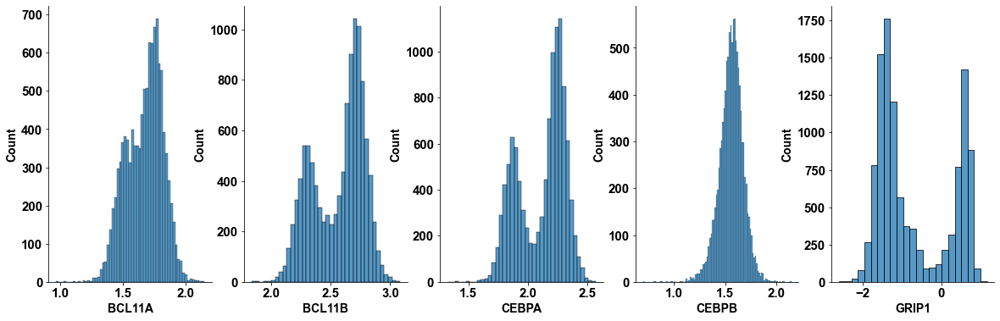

In [374]:
plot_tf_distribution(tmp1.T, ['BCL11A', 'BCL11B','CEBPA','CEBPB','GRIP1'])

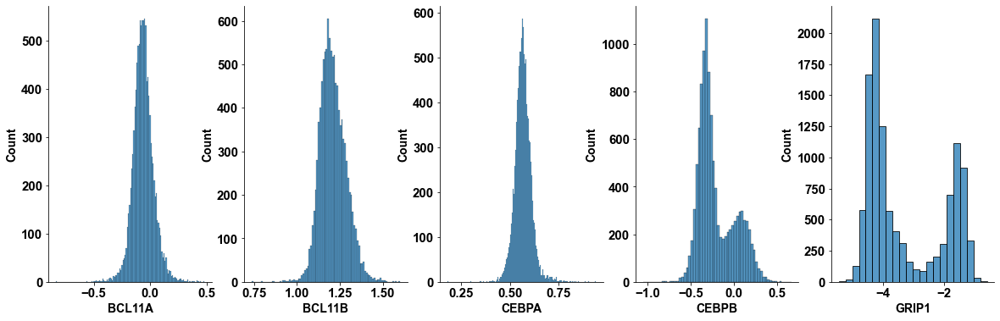

In [375]:
plot_tf_distribution(tmp.T, ['BCL11A', 'BCL11B','CEBPA','CEBPB','GRIP1'])

In [293]:
tmp.loc['CEBPB'].std()

0.2123601630512863

In [380]:
tmp.std(1).sort_values(ascending=False)[0:40]

Factor
GRIP1      1.233551
HES2       0.926570
NFE2L1     0.749648
PGR        0.719242
LMO1       0.667362
RXRG       0.534606
MAFG       0.523109
TLX1       0.521092
SMARCA2    0.486807
ARID1A     0.460273
SKI        0.453069
FOXO1      0.440275
PHOX2B     0.438369
BATF3      0.437179
CEBPG      0.435507
ZNF654     0.420760
HNF1B      0.418539
MAFF       0.388889
ZBTB2      0.384147
CTNNB1     0.381578
HOXA9      0.371800
NCOR1      0.370830
NFIL3      0.365235
SMC3       0.355165
HLF        0.352021
EBNA3C     0.343763
LYL1       0.341570
HAND2      0.341500
ESCO2      0.335669
POLR3D     0.332916
IRF9       0.327652
PTRF       0.318199
SOX10      0.316813
KDM6A      0.314624
DRAP1      0.311983
H2AFX      0.306811
PTTG1      0.300276
NR1H3      0.300157
FOSL1      0.297265
TOP1       0.296885
dtype: float64

In [376]:
overlap_cell = set(tmp.columns).intersection(metadata.index)

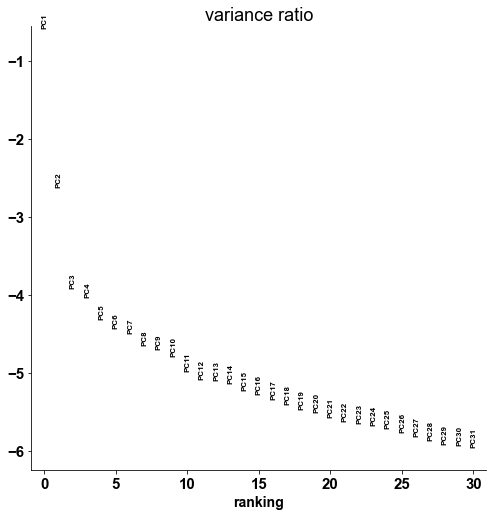

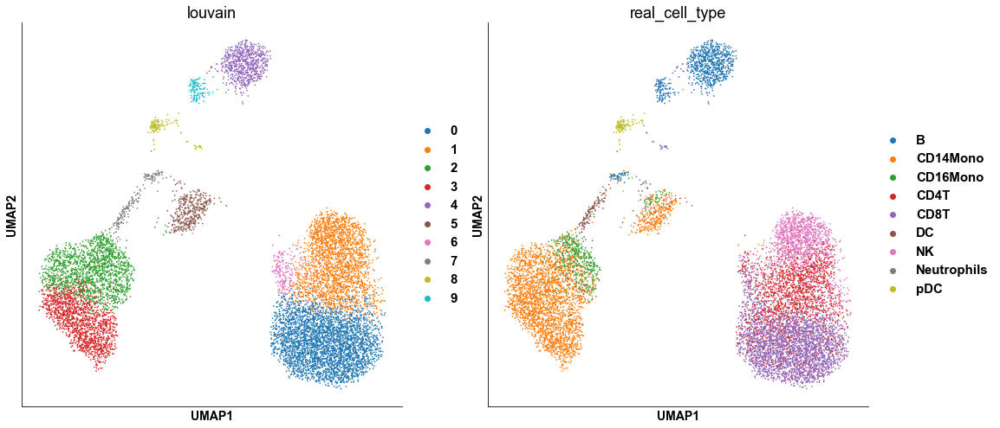

0.6455293327816201
0.6448483629973993


In [377]:
test_adata_script = umap_table(tmp.loc[:,overlap_cell].T, metadata)

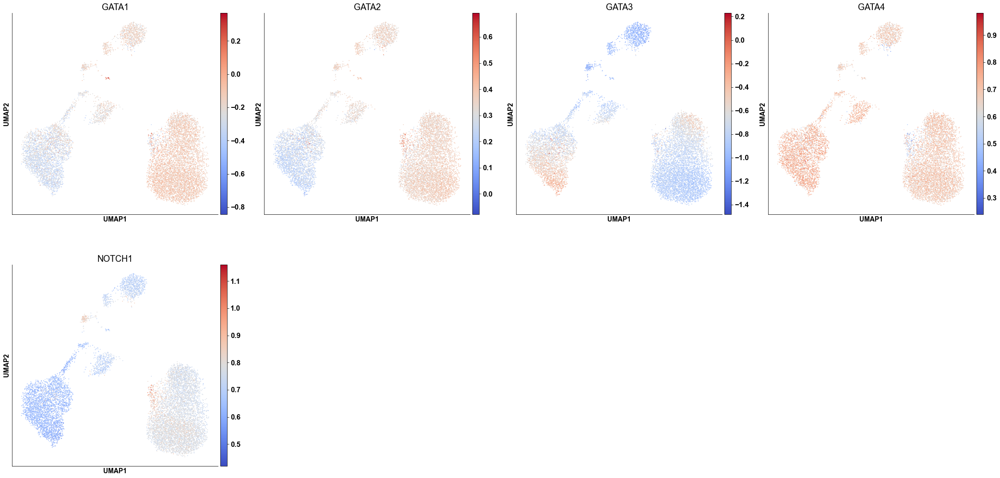

In [378]:
sc.pl.umap(test_adata_script, color=['GATA1','GATA2','GATA3','GATA4', 'NOTCH1'], color_map='coolwarm')

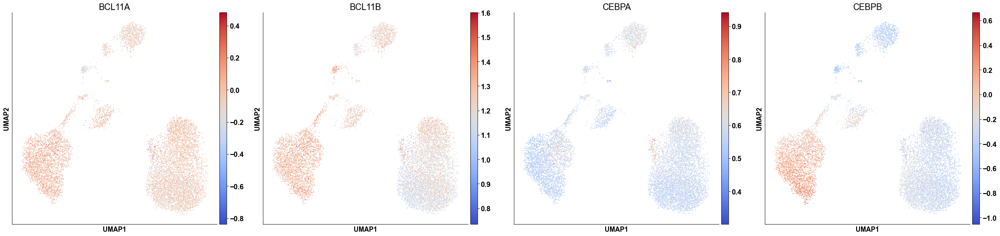

In [379]:
sc.pl.umap(test_adata_script, color=['BCL11A','BCL11B','CEBPA','CEBPB'], color_map='coolwarm')

In [351]:
res1

,TGGTCTATCATGGTTT,TATCCGGGTGGGTAAC,GAACTTAAGATTCGTT,AGTAACGGTATAGTGG,AGTAATCCAGCTACCC,GAGAGGAGTTTATTCC,GGGATAAAGTGAGGAA,TTTGCTGAGTATCGCC,CACTTCAAGATATTGG,GTATTGTTCCCGGAAA,...,AATGGCCCAGTAATCG,AAGAATCGTAAACCGA,GGCGCTTGTCATCACG,CGTAACCTCGTCCTTT,AAGAATCGTTAGCTCG,CCAACTGGTCCTTGAG,TCCGGTTAGCTTTAAC,GAAGTCAGTTACTCCC,ATTTCGCCACCACAAA,GATTACGCATGACAAT
1006_EOMES,-0.722248,-0.788026,-0.675352,-0.755052,-0.765535,-0.658366,-0.890554,-0.739288,-0.745909,-0.796967,...,-0.805590,-0.735146,-0.761755,-0.667403,-0.730838,-0.711888,-0.737434,-0.675780,-0.770662,-0.771664
1007_EP300,2.140823,2.589415,2.833653,2.331759,2.358511,2.543636,2.001231,1.566488,2.483736,1.460350,...,2.234931,1.087095,1.648798,1.934093,2.549374,2.267597,1.665763,2.531894,1.486793,2.556590
1010_FOXH1,-0.787740,-0.797490,-0.777580,-0.806038,-0.844362,-0.757755,-0.842652,-0.803422,-0.800686,-0.779879,...,-0.801427,-0.771490,-0.787911,-0.756002,-0.800142,-0.783118,-0.775598,-0.799787,-0.758860,-0.775949
1011_FOXH1,-0.077163,-0.049056,0.110824,-0.007408,-0.132378,0.043159,-0.232751,-0.289099,-0.087500,-0.186316,...,-0.119554,-0.400177,-0.295360,-0.144314,0.012080,-0.105135,-0.215707,-0.095769,-0.226004,-0.010959
1012_FOXP1,5.876440,6.083905,6.826311,6.536331,6.528417,6.365339,4.795143,4.329267,6.301462,4.206436,...,6.119356,3.290988,4.562236,5.204859,6.279581,6.133298,4.308183,6.579214,4.257702,6.436840
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
motif_ZSCAN31,-0.927850,-0.948607,-0.977480,-0.941880,-0.945342,-0.960275,-0.933306,-0.945046,-0.947721,-0.935635,...,-0.967086,-0.931124,-0.935961,-0.952873,-0.954880,-0.956676,-0.945291,-0.959543,-0.950891,-0.946012
motif_ZSCAN4,-0.931564,-0.898496,-0.907187,-0.880755,-0.876592,-0.877438,-0.869211,-0.857812,-0.887079,-0.897212,...,-0.873322,-0.862898,-0.881859,-0.859805,-0.915223,-0.913418,-0.871377,-0.892750,-0.884687,-0.908171
motif_ZSCAN5,-1.000000,-0.996977,-0.998384,-0.983140,-0.986648,-0.994486,-1.000000,-0.999301,-0.998450,-0.963938,...,-0.999367,-0.998821,-1.000000,-0.987876,-0.999491,-0.997881,-0.994724,-0.997187,-0.996168,-0.999513
motif_ZSCAN5C,-0.978456,-0.977555,-0.985878,-0.974377,-0.962254,-0.984366,-0.883767,-0.951719,-0.994484,-0.950831,...,-0.997287,-0.968452,-0.978243,-0.970143,-0.980600,-0.982842,-0.929783,-0.982941,-0.955033,-0.993533


In [352]:
tmp_res = res1.copy()
factor_index_list = []
for i in res1.index:
    factor_name = i.split("_")
    factor_index_list.append(factor_name[1])
tmp_res.loc[:,"Factor"] = factor_index_list

In [421]:
max_index = tmp_res.groupby('Factor').idxmax()

In [393]:
res2.loc['ASCL1',:].sort_values()

TTAAGCTTCCAATACT   -0.343561
AAGGAACCATTACGGA   -0.266189
ACCGGCTGTGTGCGAG   -0.259373
ACGGACCAGATTCAAG   -0.238190
GCAGCTAAGCAAATTG   -0.211958
                      ...   
GGATTGAGTAGGCGCA    1.361073
CCAGGCTGTCGATTAC    1.402465
TATATGCTCCATGACC    1.403734
CTTCACTTCATCACAT    1.404258
CAATAAGTCCGCCTAG    1.468549
Name: ASCL1, Length: 11347, dtype: float64

In [209]:
res2 = map_factor_on_ChIP(res1)

In [273]:
res2

,TGGTCTATCATGGTTT,TATCCGGGTGGGTAAC,GAACTTAAGATTCGTT,AGTAACGGTATAGTGG,AGTAATCCAGCTACCC,GAGAGGAGTTTATTCC,GGGATAAAGTGAGGAA,TTTGCTGAGTATCGCC,CACTTCAAGATATTGG,GTATTGTTCCCGGAAA,...,AATGGCCCAGTAATCG,AAGAATCGTAAACCGA,GGCGCTTGTCATCACG,CGTAACCTCGTCCTTT,AAGAATCGTTAGCTCG,CCAACTGGTCCTTGAG,TCCGGTTAGCTTTAAC,GAAGTCAGTTACTCCC,ATTTCGCCACCACAAA,GATTACGCATGACAAT
Factor,,,,,,,,,,,,,,,,,,,,,
AC023509.3,0.326315,0.263725,0.463459,0.529926,0.325595,0.251042,0.132100,-0.112189,0.118585,0.063283,...,0.403848,-0.220190,0.249315,0.067274,0.237229,0.220955,0.021294,0.146836,0.114839,0.269418
AC138696.1,-0.937815,-0.877088,-0.893647,-0.826829,-0.809863,-0.882406,-0.948328,-0.921348,-0.923352,-0.860339,...,-0.832628,-0.830317,-0.900353,-0.814100,-0.912308,-0.842372,-0.852100,-0.886175,-0.917015,-0.909478
ADNP,2.539970,2.791094,2.712517,2.571416,2.936717,2.688804,2.169667,1.848116,2.600868,1.987190,...,2.581579,1.362843,1.940003,2.146194,2.473445,2.488768,1.844708,2.900349,2.050691,2.636058
AEBP2,0.846753,1.101338,1.066763,1.452003,1.145274,0.972771,0.668056,0.622735,1.481941,0.744470,...,1.742608,0.573921,0.230841,1.070222,1.213456,0.907905,0.630455,0.811932,0.750550,1.050943
AFF1,22.742847,23.677774,25.945728,23.428041,24.249007,23.525672,19.990363,16.625878,23.890080,16.214424,...,24.732418,13.136827,17.733554,20.061927,23.889720,23.702445,17.537240,24.066981,16.438848,23.713609
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSCAN5C,-0.978456,-0.977555,-0.985878,-0.974377,-0.962254,-0.984366,-0.883767,-0.951719,-0.994484,-0.950831,...,-0.997287,-0.968452,-0.978243,-0.970143,-0.980600,-0.982842,-0.929783,-0.982941,-0.955033,-0.993533
ZTA,-0.701570,-0.688309,-0.656256,-0.631795,-0.693748,-0.679493,-0.349701,-0.465174,-0.579723,-0.576496,...,-0.673899,-0.519354,-0.554048,-0.564342,-0.709907,-0.564806,-0.715848,-0.677427,-0.617021,-0.691055
ZXDB,14.981108,15.942794,17.028832,15.533194,16.139815,15.555609,13.282184,10.813679,15.929698,11.333992,...,15.928913,8.673094,11.986278,13.223823,16.106344,14.806967,11.434104,15.715967,10.833589,15.935690


In [275]:
res3

,TGGTCTATCATGGTTT,TATCCGGGTGGGTAAC,GAACTTAAGATTCGTT,AGTAACGGTATAGTGG,AGTAATCCAGCTACCC,GAGAGGAGTTTATTCC,GGGATAAAGTGAGGAA,TTTGCTGAGTATCGCC,CACTTCAAGATATTGG,GTATTGTTCCCGGAAA,...,AATGGCCCAGTAATCG,AAGAATCGTAAACCGA,GGCGCTTGTCATCACG,CGTAACCTCGTCCTTT,AAGAATCGTTAGCTCG,CCAACTGGTCCTTGAG,TCCGGTTAGCTTTAAC,GAAGTCAGTTACTCCC,ATTTCGCCACCACAAA,GATTACGCATGACAAT
Factor,,,,,,,,,,,,,,,,,,,,,
AC023509.3,0.134584,0.071995,0.271729,0.338196,0.133865,0.059312,-0.059630,-0.303919,-0.073145,-0.128447,...,0.212118,-0.411920,0.057585,-0.124456,0.045499,0.029225,-0.170436,-0.044894,-0.076891,0.077688
AC138696.1,-0.058187,0.002540,-0.014019,0.052799,0.069765,-0.002778,-0.068700,-0.041720,-0.043724,0.019289,...,0.047000,0.049311,-0.020725,0.065528,-0.032680,0.037256,0.027528,-0.006547,-0.037387,-0.029850
ADNP,0.197362,0.448485,0.369908,0.228807,0.594108,0.346195,-0.172941,-0.494492,0.258260,-0.355419,...,0.238970,-0.979766,-0.402605,-0.196414,0.130836,0.146160,-0.497901,0.557740,-0.291917,0.293449
AEBP2,-0.028081,0.226504,0.191929,0.577169,0.270440,0.097937,-0.206778,-0.252099,0.607107,-0.130364,...,0.867774,-0.300913,-0.643993,0.195388,0.338622,0.033071,-0.244379,-0.062902,-0.124284,0.176109
AFF1,1.741788,2.676715,4.944669,2.426982,3.247948,2.524613,-1.010696,-4.375181,2.889021,-4.786635,...,3.731359,-7.864232,-3.267505,-0.939132,2.888661,2.701386,-3.463819,3.065922,-4.562211,2.712550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSCAN5C,-0.008022,-0.007121,-0.015444,-0.003942,0.008180,-0.013931,0.086667,0.018716,-0.024050,0.019604,...,-0.026853,0.001982,-0.007809,0.000292,-0.010166,-0.012408,0.040652,-0.012507,0.015401,-0.023099
ZTA,-0.061325,-0.048063,-0.016011,0.008451,-0.053503,-0.039248,0.290544,0.175071,0.060522,0.063750,...,-0.033654,0.120891,0.086198,0.075903,-0.069662,0.075440,-0.075603,-0.037182,0.023224,-0.050810
ZXDB,1.093661,2.055348,3.141386,1.645747,2.252368,1.668163,-0.605262,-3.073767,2.042252,-2.553455,...,2.041466,-5.214352,-1.901169,-0.663623,2.218897,0.919521,-2.453342,1.828520,-3.053858,2.048244


In [274]:
res3 = (res2.T-res2.mean(1)).T

In [276]:
res4 = l2norm(res3.T).T

In [281]:
res4.min().sort_values()

TACTGAGCAAGTCCTT   -0.271638
CCCGATTAGCTCCTAA   -0.269852
AGTAAGCTCGCTCAGT   -0.264878
GCATTGTGTTTACTGA   -0.263142
ATATTGCTCCACTATG   -0.261627
                      ...   
ATTAGTGAGGCACAAT   -0.007408
CCCGATTAGACTTAGA   -0.007036
TCTGGTCAGCATGTTT   -0.007023
CCTTAAAGTCTGTGCA   -0.006822
CCGTTCCTCATAACCT   -0.005102
Length: 11347, dtype: float64

In [286]:
res4

,TGGTCTATCATGGTTT,TATCCGGGTGGGTAAC,GAACTTAAGATTCGTT,AGTAACGGTATAGTGG,AGTAATCCAGCTACCC,GAGAGGAGTTTATTCC,GGGATAAAGTGAGGAA,TTTGCTGAGTATCGCC,CACTTCAAGATATTGG,GTATTGTTCCCGGAAA,...,AATGGCCCAGTAATCG,AAGAATCGTAAACCGA,GGCGCTTGTCATCACG,CGTAACCTCGTCCTTT,AAGAATCGTTAGCTCG,CCAACTGGTCCTTGAG,TCCGGTTAGCTTTAAC,GAAGTCAGTTACTCCC,ATTTCGCCACCACAAA,GATTACGCATGACAAT
Factor,,,,,,,,,,,,,,,,,,,,,
AC023509.3,0.006522,0.002075,0.004701,0.010731,0.003811,0.001761,-0.002200,-0.005518,-0.002024,-0.002361,...,0.005189,-0.004173,0.001309,-0.007601,0.001376,0.001147,-0.003575,-0.001223,-0.001409,0.002150
AC138696.1,-0.002820,0.000073,-0.000243,0.001675,0.001986,-0.000082,-0.002535,-0.000757,-0.001210,0.000355,...,0.001150,0.000500,-0.000471,0.004002,-0.000988,0.001462,0.000577,-0.000178,-0.000685,-0.000826
ADNP,0.009564,0.012929,0.006399,0.007260,0.016915,0.010279,-0.006381,-0.008978,0.007147,-0.006533,...,0.005846,-0.009927,-0.009153,-0.011996,0.003956,0.005734,-0.010445,0.015196,-0.005348,0.008121
AEBP2,-0.001361,0.006529,0.003320,0.018314,0.007700,0.002908,-0.007629,-0.004577,0.016800,-0.002396,...,0.021229,-0.003049,-0.014640,0.011934,0.010239,0.001297,-0.005127,-0.001714,-0.002277,0.004873
AFF1,0.084409,0.077162,0.085537,0.077009,0.092472,0.074960,-0.037289,-0.079432,0.079945,-0.087979,...,0.091283,-0.079678,-0.074282,-0.057360,0.087346,0.105984,-0.072664,0.083532,-0.083577,0.075064
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSCAN5C,-0.000389,-0.000205,-0.000267,-0.000125,0.000233,-0.000414,0.003198,0.000340,-0.000666,0.000360,...,-0.000657,0.000020,-0.000178,0.000018,-0.000307,-0.000487,0.000853,-0.000341,0.000282,-0.000639
ZTA,-0.002972,-0.001386,-0.000277,0.000268,-0.001523,-0.001165,0.010719,0.003178,0.001675,0.001172,...,-0.000823,0.001225,0.001960,0.004636,-0.002106,0.002960,-0.001586,-0.001013,0.000425,-0.001406
ZXDB,0.053000,0.059250,0.054342,0.052220,0.064127,0.049530,-0.022331,-0.055804,0.056513,-0.046933,...,0.049942,-0.052830,-0.043220,-0.040532,0.067094,0.036076,-0.051466,0.049819,-0.055945,0.056681


In [238]:
res1.columns

Index(['TGGTCTATCATGGTTT', 'TATCCGGGTGGGTAAC', 'GAACTTAAGATTCGTT',
       'AGTAACGGTATAGTGG', 'AGTAATCCAGCTACCC', 'GAGAGGAGTTTATTCC',
       'GGGATAAAGTGAGGAA', 'TTTGCTGAGTATCGCC', 'CACTTCAAGATATTGG',
       'GTATTGTTCCCGGAAA',
       ...
       'AATGGCCCAGTAATCG', 'AAGAATCGTAAACCGA', 'GGCGCTTGTCATCACG',
       'CGTAACCTCGTCCTTT', 'AAGAATCGTTAGCTCG', 'CCAACTGGTCCTTGAG',
       'TCCGGTTAGCTTTAAC', 'GAAGTCAGTTACTCCC', 'ATTTCGCCACCACAAA',
       'GATTACGCATGACAAT'],
      dtype='object', length=11347)

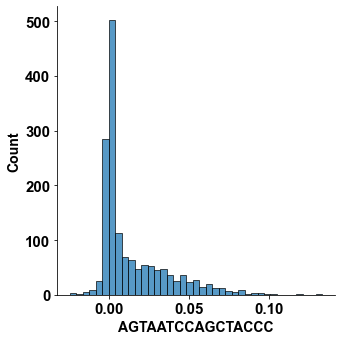

In [285]:
bc = 'AGTAATCCAGCTACCC'
# sns.displot(res3[bc])
sns.displot(res4[bc])

In [407]:
final = tmp.T - tmp.mean(1)

In [408]:
index_ovlp = set(metadata.index).intersection(final.index)

In [ ]:
test = umap_table(final.loc[index_ovlp,:], metadata.loc[index_ovlp,:])

In [ ]:
sc.pl.umap(test, color=['BCL11B','BCL11A','BATF3','NFE2L1','GRIP1','ARID1A'])

In [424]:
index_1 = test.obs[(test.obs['real_cell_type'] == 'NK') | (test.obs['real_cell_type'] == 'CD8T') | (test.obs['real_cell_type'] == 'CD4T') ].index

In [ ]:
final.loc[index_1, :].std().sort_values()

In [439]:

    return p_s/np.sum(p_s)

In [436]:
import matplotlib.patches as patches

In [ ]:
p_overlap(10,20,5,pool=60)

In [ ]:
factor_source_mem.loc['PBX1'][test.obs[test.obs['louvain'] == '5'].index].unique()

In [ ]:
factor_source_mem.loc['PBX1'][test.obs[test.obs['louvain'] == '7'].index].unique()

In [ ]:
np.corrcoef(test.obsm['X_pca'][:,0], test.X[:,4])[0,1]

In [496]:
cor_list = []
for i in range(test.X.shape[1]):
    cor = np.corrcoef(test.obsm['X_pca'][:,1], test.X[:,i])
    cor_list.append(cor[0,1])

In [ ]:
k=0
for i,j in enumerate(cor_list):
    if abs(j) > 0.5:
        k = k+1
        print(test.var.index[i], j)

In [ ]:
k

In [ ]:
ChIP_table_res.loc['ZNF705G',:].sort_values()

In [459]:
k

643

In [185]:
# motif_table_mbm = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210714_resizedmotif/enrichment/dataset_mbm_overlap_motif_df.pk')
# motif_table_hyper_bg = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210714_resizedmotif/enrichment/dataset_bg_peak_norm_motif_df.pk').reindex(columns = motif_table_mbm.columns)
# motif_table_score = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210714_resizedmotif/enrichment/dataset_raw_score_motif_df.pk')
# motif_table_res = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210714_resizedmotif/enrichment/dataset_score_motif_df.pk')

In [203]:
def zscore_normalization(data_cell_frame, by='cell'):
    if by=="cell":
        data_cell_frame_zscore = data_cell_frame.apply(scipy.stats.zscore, axis=0)
    elif by == "factor":
        data_cell_frame_zscore = data_cell_frame.apply(scipy.stats.zscore, axis=1)
    else:
        pass
    return data_cell_frame_zscore


def map_factor_on_ChIP(table):
    table_ret=table.copy()
    # map factor by id "_"
    factor_index_list = []
    for i in table.index:
        factor_name = i.split("_")
        factor_index_list.append(factor_name[1])
    table_ret.loc[:,"Factor"] = factor_index_list
    return table_ret.groupby("Factor").max()

def score_normalization(data_cell_frame, type='ChIP'):
    if type == 'ChIP':
        factor_cell_frame_raw_score = map_factor_on_ChIP(data_cell_frame)
    else:
        factor_cell_frame_raw_score = data_cell_frame
    factor_cell_frame_score = zscore_normalization(factor_cell_frame_raw_score, by='cell')
    factor_cell_frame_score = (factor_cell_frame_raw_score.T-factor_cell_frame_raw_score.mean(1)).T
    return factor_cell_frame_score*10


In [ ]:
score_normalization(ChIP_table_mbm/ChIP_table_hyper_bg)

In [276]:
# def l2_norm(X):
#     X_norm = preprocessing.normalize(X, norm='l2')
#     X_norm = pd.DataFrame(X_norm, index= X.index, columns=X.columns).copy()
#     return X_norm

In [ ]:
metadata

In [171]:
def umap_table(script_table_cell_tf, metadata):
    sudo_expression_SCRIPT = ad.AnnData(script_table_cell_tf)
#     sc.pp.highly_variable_genes(sudo_expression_SCRIPT)
#     sc.pp.highly_variable_genes(rna_adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
    sc.tl.pca(sudo_expression_SCRIPT, svd_solver='arpack', use_highly_variable=False)
    sc.pl.pca_variance_ratio(sudo_expression_SCRIPT, log=True)
    sc.pp.neighbors(sudo_expression_SCRIPT, n_neighbors=10, n_pcs=30)
    sc.tl.umap(sudo_expression_SCRIPT)
    sc.tl.louvain(sudo_expression_SCRIPT, resolution=0.8)
    sudo_expression_SCRIPT.obs['real_cell_type']=metadata['assign.celltype'][sudo_expression_SCRIPT.obs.index]
    sudo_expression_SCRIPT.obs['nFeature_ATAC']=metadata['nFeature_ATAC'][sudo_expression_SCRIPT.obs.index]
    sc.pl.umap(sudo_expression_SCRIPT, color=['louvain','real_cell_type'], color_map=regulation_cmp)
    print(sklearn.metrics.normalized_mutual_info_score(sudo_expression_SCRIPT.obs['louvain'], sudo_expression_SCRIPT.obs['real_cell_type']))
    print(sklearn.metrics.adjusted_mutual_info_score(sudo_expression_SCRIPT.obs['louvain'], sudo_expression_SCRIPT.obs['real_cell_type']))
    return sudo_expression_SCRIPT

In [ ]:
tmp_adata = umap_table(tmp.T, metadata)

In [ ]:
factor = 'BARX2'
# sns.displot(motif_table_res.T[factor].sort_values())
# sns.displot(final2.T[factor].sort_values())
sns.displot(script_res_table[factor].sort_values())

index = [i for i in ChIP_table_score.index if i.endswith('RXRG' )]

ChIP_table_score.max(1).sort_values()[index]

sns.displot(final['AGGCCATCAGCTAGCG'].sort_values())

script_res_table.max().sort_values()

script_table

/fs/home/dongxin/Applications/miniconda3/envs/script/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


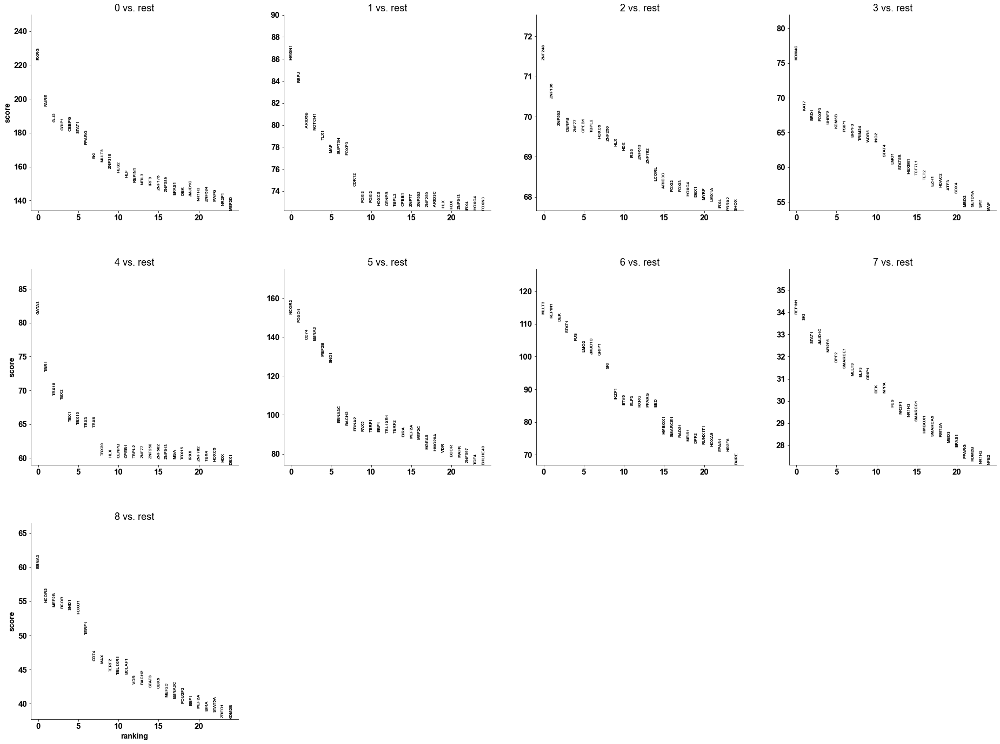

In [520]:
sc.tl.rank_genes_groups(test_adata_script, 'louvain', method='t-test')
sc.pl.rank_genes_groups(test_adata_script, n_genes=25, sharey=False)

In [507]:
problem_factor = ['MLLT3','REPIN1','DEK','FUS','STAT1','LMO2','GRIP1','SKI','IKZF1','ETV6','ETV3','RXRG','PPARG','EED','HMBOX1','SMARCE1','RAD21','MEIS1','DPF2','RUNX1T1','HOXA9','EPAS1','NR2F6','DPF2','NPPA','NR1H3','SMARCC1','SMARCA5','ELF3','MBD3','NFE2','KDM4C','KAT7','CENPB','CPEB1','HMGN1','RBPJ','FAIRE','GLI2','GRIP1','CEBPG','PPARG','TBR1','EBNA3','NCOR2','MEF2B','BCOR','SND1','TERF1','MAX','TBX18','TBX2','TBX20','BRD1','UHRF2','KDM6B','PSIP1','BRPF3']

In [504]:
file = pd.read_csv('/fs/home/dongxin/Projects/SCRIPT/indices/human/ChIP_motif_top10k_3k/peaks_number.txt', sep='\t', header = None)

In [508]:
id_list = []
for i in file[0]:
    if i.split('_')[1] in problem_factor:
        id_list.append(i)
            

In [ ]:
id_list

In [483]:
list(set(test_adata_script.var.index) - set(test_adata_chromvar.var.index))

['ZNF584',
 'SVIL',
 'MXD1',
 'WHSC1',
 'ZNF79',
 'ZKSCAN7',
 'TEAD1,',
 'SMN1',
 'WDHD1',
 'ZBTB17',
 'ZNF615',
 'MGEA5',
 'DEK',
 'EZH2',
 'PCGF2',
 'CHD8',
 'NCOR1',
 'ZBTB2',
 'GABP',
 'IKZF3',
 'NKX2-6',
 'ZNF329',
 'ZNF436',
 'ZSCAN29',
 'ZNF443',
 'MLLT1',
 'ZNF146',
 'ZNF501',
 'CBX8',
 'ZNF623',
 'KDM2A',
 'NOTCH1',
 'NELFE',
 'ZNF585A',
 'WRNIP1',
 'ZNF837',
 'PRPF4',
 'POLR2AphosphoS5',
 'PHIP',
 'PRMT1',
 'ZNF416',
 'KDM1A',
 'GATAD2B',
 'SSU72',
 'ZNF552',
 'CCNT2',
 'MAML3',
 'NKX1-2',
 'ZNF565',
 'ADNP',
 'ZNF211',
 'C11orf30',
 'HMGN1',
 'ZNF792',
 'ZNF92',
 'GLI4',
 'ZXDC',
 'CHD7',
 'ZNF704',
 'DRAP1',
 'ZNF16',
 'PRDM11',
 'AC138696.1',
 'NKX2-1',
 'ZNF292',
 'ZNF346',
 'ZNF124',
 'RHOXF2B',
 'YAP1',
 'ZNF600',
 'ZBTB10',
 'APOBEC3B',
 'INTS11',
 'SKI',
 'ZEB2',
 'SP140',
 'ZNF778',
 'ZNF671',
 'ZNF439',
 'CDCA2',
 'ZNF880',
 'LARP7',
 'DDX5',
 'JARID2',
 'ZNF3',
 'ORC2',
 'ZFP69B',
 'ZNF267',
 'ZNF83',
 'POGK',
 'CTNNB1',
 'ZNF574',
 'TCOF1',
 'RUNX1T1',
 'TAT',
 'C

In [ ]:
list(set(test_adata_script.var.index).intersection(set(test_adata_chromvar.var.index)))

In [477]:
list(set(test_adata_chromvar.var.index) - set(test_adata_script.var.index)).__len__()

135

In [492]:
max_index.loc['RXRG'].unique()

array(['85058_RXRG', '2814_RXRG'], dtype=object)

/fs/home/dongxin/Applications/miniconda3/envs/script/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


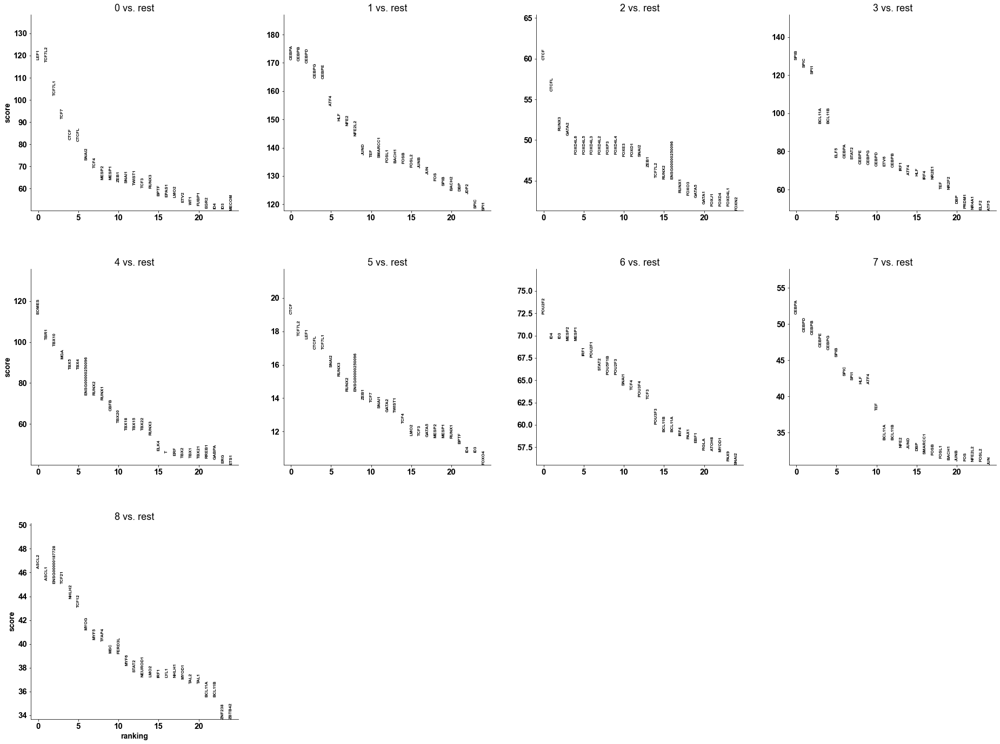

In [193]:
sc.tl.rank_genes_groups(test_adata_chromvar, 'louvain', method='t-test')
sc.pl.rank_genes_groups(test_adata_chromvar, n_genes=25, sharey=False)

In [350]:
chromVAR_z_table

,TFAP2B,TFAP2D,TFAP2C,TFAP2E,TFAP2A,ARID3A,ARID5B,ARID3B,ARID5A,ARID3C,...,PBX4,NKX62,HOXA4,CR8477943,RORB,SMAD5,SMAD9,SOX6,TBX18,TBX22
AAACAAGCACCACAAA,1.303155,-0.434590,-0.457119,0.965786,1.826718,0.222399,0.496754,-0.528345,-1.312826,-0.526592,...,0.842919,-0.305863,0.971412,0.427137,-1.044701,-0.917601,-0.342049,-0.336527,1.151196,1.151196
AAACAAGCAGCCAGTG,-0.976182,-1.168322,-0.749624,0.111072,-1.766978,1.799998,-0.155039,-0.134317,-0.192148,-1.253129,...,-0.720390,-0.669256,0.848806,1.072767,-1.286486,-0.828982,0.438613,-0.563324,-0.276718,-0.276718
AAACAAGCAGGACCTG,-0.306004,0.017620,-2.098204,-0.322960,0.011830,0.517261,1.146561,-0.352097,1.455611,1.236955,...,1.297821,0.715016,-0.548809,-1.734624,0.300097,0.831536,0.480913,0.069200,-0.268239,-0.268239
AAACAAGCATTGACTC,-1.007423,0.323479,-1.280677,-0.166447,0.446602,1.483417,-0.550072,1.051917,-0.922795,1.730456,...,0.060741,1.454022,1.212289,-1.754932,-0.939455,-0.047612,-0.010529,-0.102109,1.562885,1.562885
AAACAAGCATTGTTTG,-0.730665,-2.272845,-1.342869,0.210156,-0.269242,1.594789,2.052390,-0.832631,-0.345750,-0.674169,...,0.286168,-0.039768,-0.742604,1.295154,1.026998,-0.273359,-2.540347,-0.008690,0.580615,0.580615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCGAGGTGGCTA,-0.013423,-0.799812,0.496376,0.917468,0.017925,0.169166,-0.353570,0.610647,1.344225,-1.007314,...,0.536884,0.813049,1.305287,-0.697667,1.368993,-0.547129,-0.603766,0.577488,-1.279311,-1.279311
TTTGTGAGTACCTTGG,1.685638,0.145448,-0.257251,-0.655742,-0.480001,1.011504,2.912024,1.957431,1.021042,0.636026,...,1.403189,2.490445,1.535583,1.330865,2.118625,-0.473756,-0.481643,0.214739,2.689893,2.689893
TTTGTGAGTCATGAAG,0.623155,-0.161078,-0.115077,-1.991842,-2.108227,0.748301,-2.055235,2.969763,-0.743320,1.941854,...,-0.655526,0.041744,-0.956059,-0.746708,-0.027294,1.116511,-0.517152,1.549040,0.364667,0.364667
TTTGTGAGTGCAATAG,-1.938859,-0.064810,-1.381009,-1.163329,0.697171,1.176247,0.303462,-0.235745,0.805261,-1.139156,...,-0.156648,-0.144521,0.325093,0.590291,0.587448,1.176031,0.029297,0.091389,-1.017517,-1.017517


In [352]:
ovlp_index = set(metadata.index).intersection(chromVAR_z_table.index)

In [ ]:
test_adata_chromvar = umap_table(chromVAR_z_table.loc[ovlp_index,:].T, metadata)

In [223]:
index_q = test_adata.obs[(test_adata.obs['louvain'] == '6')].index

In [224]:
index_g = list(set(test_adata.obs.index) - set(index_q))

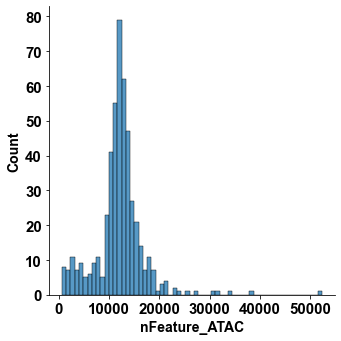

In [225]:
sns.displot(metadata.loc[index_q]['nFeature_ATAC'])

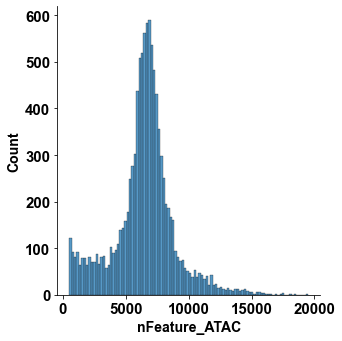

In [226]:
sns.displot(metadata.loc[index_g]['nFeature_ATAC'])

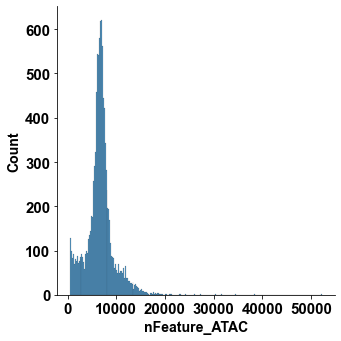

In [227]:
sns.displot(metadata['nFeature_ATAC'])

In [266]:
metadata['nFeature_ATAC'].std()

2843.023192852969

In [305]:
index_g = [i for i in pbmc_script_adata.uns['ChIP'].index if i not in index_q]

In [ ]:
metadata

In [289]:
pbmc_script_adata.obs.loc[index_q,:]['nFeature_ATAC'].min()

515

In [273]:
pbmc_script_adata.obs['nFeature_ATAC'].mean()

6694.9452316076295

In [ ]:
pbmc_script_adata.uns['ChIP'].loc[index_q,:].std().sort_values()[-30:]

In [ ]:
pbmc_script_adata.uns['ChIP'].std().sort_values()[-30:]

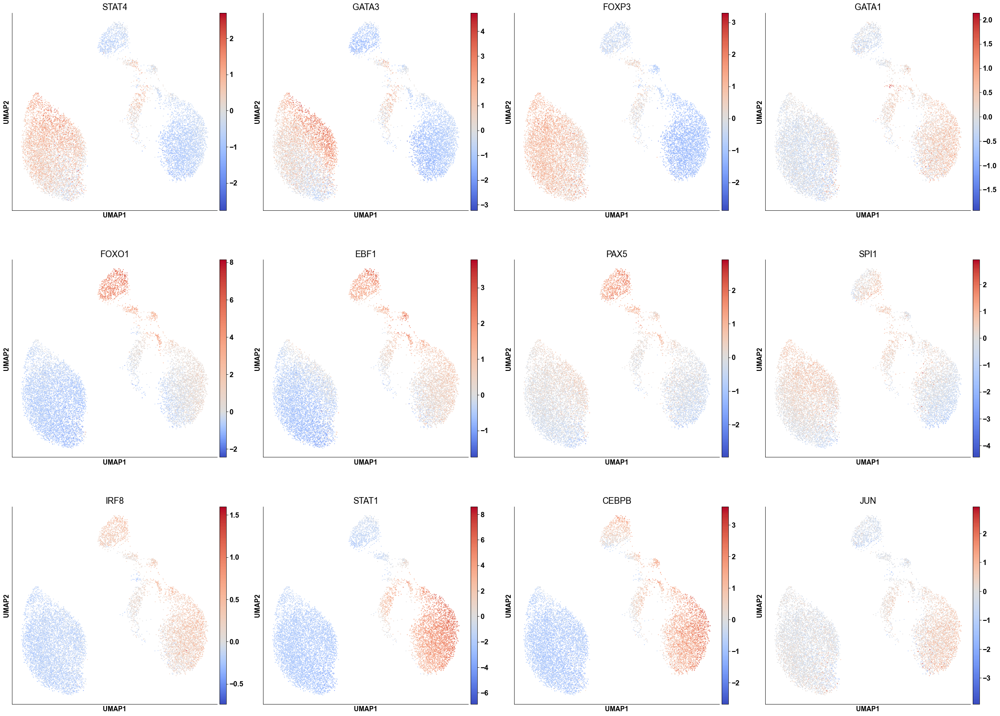

In [105]:
sc.pl.umap(test_adata,color = ['STAT4', 'GATA3', 'FOXP3', 'GATA1', 'FOXO1', 'EBF1', 'PAX5','SPI1', 'IRF8', 'STAT1','CEBPB', 'JUN'], color_map='coolwarm', vcenter=0)

In [130]:
script_adata = pbmc_adata.copy()
script_adata.var.index = ['RP_%s' % i for i in script_adata.var.index]
script_adata.obs = pd.concat([script_adata.obs, script_res_table.loc[script_adata.obs.index,:]],axis=1)

In [ ]:
script_adata.obs

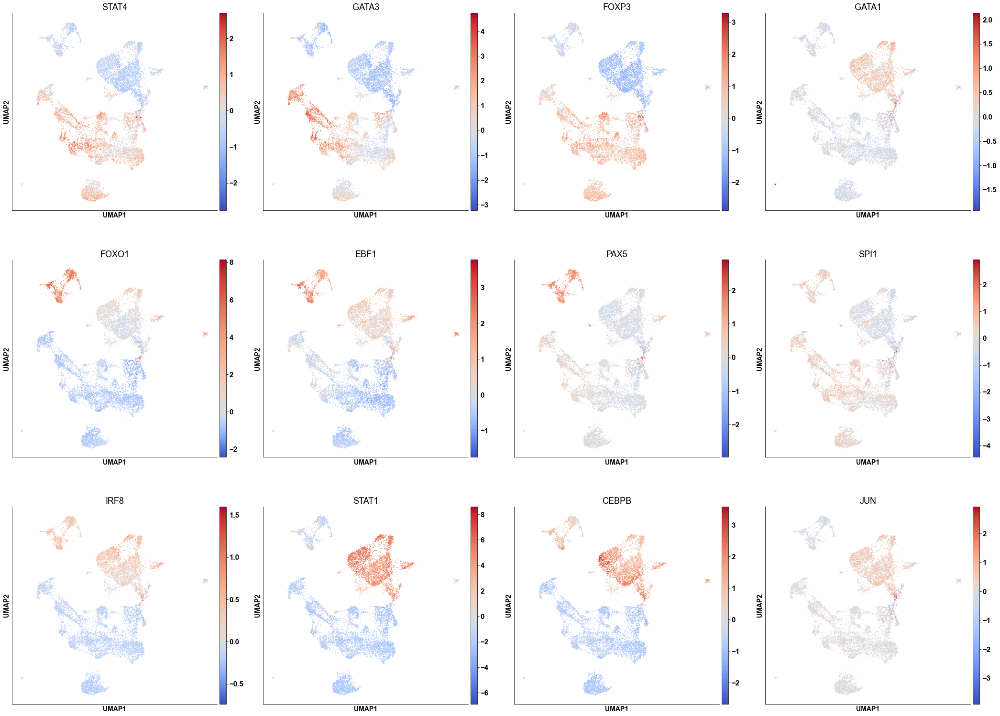

In [107]:
sc.pl.umap(pbmc_script_adata, color =['STAT4', 'GATA3', 'FOXP3', 'GATA1', 'FOXO1', 'EBF1', 'PAX5','SPI1', 'IRF8', 'STAT1','CEBPB', 'JUN'], color_map='coolwarm', vcenter=0)

In [131]:
chromVAR_adata = atac_adata.copy()
chromVAR_adata.var.index = ['RP_%s' % i for i in chromVAR_adata.var.index]
chromVAR_adata.obs = pd.concat([chromVAR_adata.obs, chromVAR_z_table.reindex(chromVAR_adata.obs.index.tolist())], axis=1)

In [ ]:
sc.pl.umap(pbmc_script_adata, color=['BCL11A','BCL11B'], wspace=0.3, color_map='coolwarm', vcenter=0)
sc.pl.umap(chromVAR_adata, color=['BCL11A','BCL11B'], wspace=0.3, color_map='coolwarm', vcenter=0)

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(8,12))
sc.pl.stacked_violin(rna_adata, ['GATA1','GATA4'], groupby='louvain_cell_type', swap_axes=False, dendrogram=False, figsize=(4,12), row_palette='#518FE0', title='Expression', show=False, ax=ax[0])
sc.pl.stacked_violin(test, ['GATA1','GATA4'], groupby='real_cell_type', swap_axes=False, dendrogram=False, figsize=(4,12), row_palette='#518FE0', title='SCRIPT Score', show=False, ax=ax[1])
fig.show()

In [357]:
sc.pl.stacked_violin(test_adata, ['BCL11A','BCL11B'], groupby='real_cell_type', swap_axes=False, dendrogram=False, figsize=(4,20), row_palette='#518FE0', title='Regulation Enrich Score', ax=ax[1])

In [304]:
rna_adata.layers['scaled'] = sc.pp.scale(rna_adata, copy=True).X

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


# Plot

In [129]:
# pbmc_adata = ad.read_h5ad('example/PBMC/data/PBMC_granulocyte_sorted_10k_scATAC_Object_filter_no_match_reannotate.h5ad')

In [28]:
expression = pd.read_csv('example/PBMC/cluster_expr.txt', sep='\t', index_col=0)
# expression = np.log(expression + 0.00001)
chromVAR_z_table = pd.read_csv('example/PBMC/chromVAR_ztable.txt', sep='\t').T
# pbmc_script_adata = ad.read_h5ad('example/PBMC/multiome_pbmc_SCRIPT/enrichment/SCRIPT_enrichment.h5ad')
script_res_table = pd.read_csv('example/PBMC/multiome_pbmc_SCRIPT_20210824/enrichment/SCRIPT_enrichment.txt', sep='\t', index_col=0)
metadata = atac_adata.obs.copy()

In [29]:
script_res_table

### SCRIPT chromVAR Expression

In [31]:
chromVAR_dict = {}
SCRIPT_dict = {}
for i in expression.columns:
    locals()[i+'_cells'] = set(metadata[(metadata['assign.celltype'] == i)].index).intersection(chromVAR_z_table.index).intersection(script_res_table.index)
    locals()[i] = chromVAR_z_table.loc[locals()[i+'_cells'],].mean()
    chromVAR_dict[i] = locals()[i]
    locals()[i] = script_res_table.loc[locals()[i+'_cells'],].mean()
    SCRIPT_dict[i] = locals()[i]

In [32]:
SCRIPT_table = pd.DataFrame(SCRIPT_dict)
chromVAR_table = pd.DataFrame(chromVAR_dict)

In [33]:
sc_ovlp_factor = list(set(SCRIPT_table.index.to_list())  & set(expression.index.to_list()))
ch_ovlp_factor = list(set(chromVAR_table.index.to_list())  & set(expression.index.to_list()))

In [34]:
ovlp_factor = list(set(SCRIPT_table.index.to_list()) & set(expression.index.to_list()) & set(chromVAR_table.index.to_list()))

In [35]:
expression.index

Index(['AL627309.1', 'AL627309.5', 'AL627309.4', 'AL669831.2', 'LINC01409',
       'FAM87B', 'LINC01128', 'LINC00115', 'FAM41C', 'AL645608.6',
       ...
       'BX004987.1', 'AC145212.1', 'MAFIP', 'AC011043.1', 'AL354822.1',
       'AL592183.1', 'AC240274.1', 'AC004556.3', 'AC007325.1', 'AC007325.4'],
      dtype='object', length=26412)

In [36]:
for i in expression.columns:
    expression_sub = expression.loc[ovlp_factor, i]
    chromVAR_sub = chromVAR_table.loc[ovlp_factor, i]
    SCRIPT_sub = SCRIPT_table.loc[ovlp_factor, i]
    locals()[i+'_table'] = pd.DataFrame({'expression':expression_sub, 'ChromVAR':chromVAR_sub, 'SCRIPT':SCRIPT_sub})

In [37]:
B_table['expression'].sort_values()

BCL11B   -0.690053
FOS      -0.672382
TCF7L2   -0.593852
KLF4     -0.556520
LEF1     -0.547390
            ...   
MEF2C     1.323429
SPIB      1.551013
BCL11A    1.723092
EBF1      2.839085
PAX5      2.987073
Name: expression, Length: 286, dtype: float64

In [ ]:
for cell in SCRIPT_table.columns:
    # cell = 'pDC'
    data = locals()[cell + "_table"]
    fig, ax = plt.subplots(1,1,figsize=(8,8))
    sns.scatterplot(data=data, y='ChromVAR', x='SCRIPT', hue='expression', palette='RdBu_r', ax=ax, legend=False)
    ax.set_title('%s Cell' % cell)
    texts = []
    for i in range(len(data.index)):
        if data.iloc[i,1] > np.quantile(data.iloc[:,1],0.95) or data.iloc[i,2] > np.quantile(data.iloc[:,2],0.95):
            texts.append(plt.text(data.iloc[i,2], data.iloc[i,1], data.index[i], size=10, 
                                  bbox={'facecolor': '#F2F2F2', 
                                        'edgecolor': '#F2F2F2',
                                        'alpha': 0.5,
                                        'pad': 0.1,
                                        'boxstyle':'round'
                                        }))
#     for i in data.index:
#         if i in ['BCL11A', 'BCL11B', 'CEBPA','CEBPB','EBF1','PAX5','GATA3','JUN', 'STAT1', 'TBX21', 'YY1', 'STAT6', 'FOXP3', 'RELA', 'JUNB', 'IRF4', 'FOXO1']:
#             texts.append(plt.text(data.loc[i,'SCRIPT'], data.loc[i,'ChromVAR'], i, size=10))
    adjust_text(texts, arrowprops=dict(arrowstyle='-', color='green'))
    fig.show()
    fig.savefig(fname='Figures/PBMC_%s_cell_TF_chromVAR_vs_SCRIPT.pdf' % cell, transparent=True, bbox_inches='tight', pad_inches=0.5)

### Recall ratio

In [39]:
with open('../TF_names_v_1.01.txt', 'r') as file_handle:    
    TF_list = [i.rstrip('\n') for i in file_handle.readlines()]

In [40]:
tf_ovlp_factor = list(set(TF_list) & set(expression.index))

In [87]:
# script_motif_table = pbmc_script_adata.uns['motif'].copy()
# script_ChIP_table = pbmc_script_adata.uns['ChIP'].copy()
# script_table = pbmc_script_adata.uns['integrated'].copy()
# script_table.columns=[i[2:] for i in script_table.columns]

In [41]:
ovlp_factor = set(expression.index) & set(script_res_table.columns) & set(chromVAR_table.columns)

In [42]:
ch_ovlp_factor = set(expression.index) & set(chromVAR_z_table.columns)
sc_ovlp_factor = set(expression.index) & set(script_res_table.columns)
# sc_chip_ovlp_factor = set(expression.index) & set(script_ChIP_table.columns)
# sc_motif_ovlp_factor = set(expression.index) & set(script_motif_table.columns)

In [43]:
ch_ovlp_factor.__len__()

568

In [44]:
sc_ovlp_factor.__len__()

648

In [54]:
result = {}
for cell in expression.columns:
#     expression100 = set(expression.loc[ovlp_factor,cell].sort_values(ascending=False)[0:1000].index)
    expression100 = set(expression[expression[cell]>np.median(expression[cell])].index)
    cell_bc = metadata[(metadata['assign.celltype'] == cell)].index.intersection(script_res_table.index)
    chromvar_cell_bc = set(cell_bc) & set(chromVAR_z_table.index)
    chromvar100 = set(chromVAR_z_table.loc[chromvar_cell_bc, ch_ovlp_factor].mean().sort_values(ascending=False)[0:100].index)
    script100 = set(script_res_table.loc[cell_bc, sc_ovlp_factor].mean().sort_values(ascending=False)[0:100].index)
#     script_motif_100 = set(script_motif_table.loc[cell_bc, sc_motif_ovlp_factor].mean().sort_values(ascending=False)[0:100].index)
#     script_chip_100 = set(script_ChIP_table.loc[cell_bc, sc_chip_ovlp_factor].mean().sort_values(ascending=False)[0:100].index)
    c_tp = expression100.intersection(chromvar100).__len__()
    c_fn = (expression100 - chromvar100).__len__()
#     c_pre = c_tp/(c_tp+)
    c_recall = c_tp/100
    
    result[cell] = {'ChromVAR':expression100.intersection(chromvar100).__len__(),
#                    'SCRIPT(motif)':expression100.intersection(script_motif_100).__len__(),
#                    'SCRIPT(ChIP)':expression100.intersection(script_chip_100).__len__(),
                   'SCRIPT':expression100.intersection(script100).__len__()}
#                     'consistant':chromvar100.intersection(script100).__len__()}
result = pd.DataFrame(result)

data = (result/100).T.melt()

data['type'] = list(result.columns)*2

In [55]:
data

,variable,value,type
0,ChromVAR,0.49,CD8T
1,ChromVAR,0.53,CD4T
2,ChromVAR,0.38,T_MKI67
3,ChromVAR,0.54,MonoNonClassical
4,ChromVAR,0.56,Neutrophils
5,ChromVAR,0.53,NK
6,ChromVAR,0.55,T_Reg
7,ChromVAR,0.75,MonoClassical
8,ChromVAR,0.57,MonoIntermediate
9,ChromVAR,0.52,B


In [117]:
result = {}
result['CD8T'] = {'ChromVAR':49, 'SCRIPT':62}
result['CD4T'] = {'ChromVAR':53, 'SCRIPT':64}
result['CD14Monocytes'] = {'ChromVAR':54, 'SCRIPT':55}
result['CD16Monocytes'] = {'ChromVAR':57, 'SCRIPT':55}
result['NK'] = {'ChromVAR':53, 'SCRIPT':60}
result['B'] = {'ChromVAR':52, 'SCRIPT':53}
result['DC'] = {'ChromVAR':51, 'SCRIPT':53}
result['pDC'] = {'ChromVAR':46, 'SCRIPT':56}
result = pd.DataFrame(result)

In [118]:
data = (result/100).T.melt()
data['type'] = list(result.columns)*2

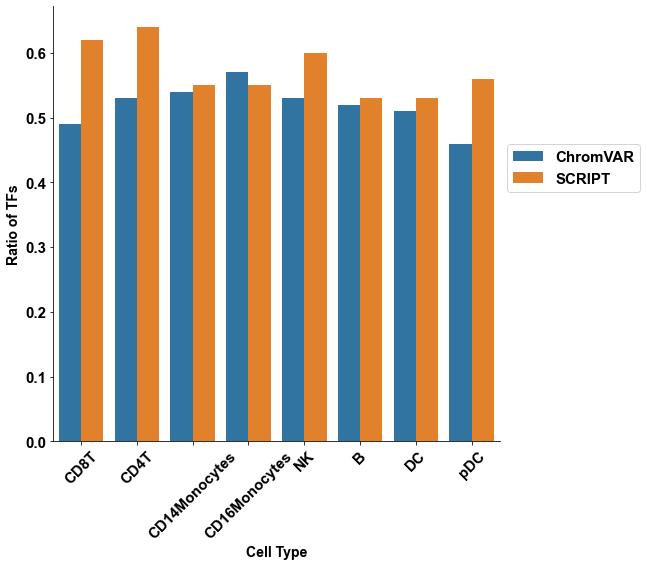

In [119]:
fig, ax = plt.subplots(figsize=(8,8))
sns.barplot(data=data, x="type", y="value", hue="variable")
plt.xticks(rotation=45)
ax.legend(bbox_to_anchor=(1.0, 0.7))
ax.set_xlabel('Cell Type')
ax.set_ylabel('Ratio of TFs')
# ax.set_title('High Regulatory Activity Transcription Factors in RNA High Expression')
fig.show()
fig.savefig(fname='Figures/PBMC_high_regulatory_TF_with_high_RNA.pdf', transparent=True, bbox_inches='tight', pad_inches=0.5)

### NMI

In [227]:
# # filter bad bed files
# bed_peak_number = pd.read_csv('/mnt/Storage/home/dongxin/Projects/scATAC/human/peak_number.txt', sep=' ', header = None)
# bad_factor = set([i.split('_')[1].split('.')[0] for i in bed_peak_number[bed_peak_number.iloc[:,1] < 2000][0]])
# good_factor = list(set(script_table.columns) - bad_factor)
# sns.displot(chromVAR_table['EOMES'])
# sns.displot(script_table['EOMES'])

In [ ]:
# [i for i in good_factor if i not in script_table.columns ]

In [226]:
# script_table = script_table.replace([np.inf, -np.inf], np.nan)
script_table = script_table.dropna(axis=1,how='any')

In [ ]:
script_table

In [223]:
script_table = pbmc_script_adata.uns['integrated'].copy()
script_table.columns=[i[2:] for i in script_table.columns]
sudo_expression_SCRIPT = ad.AnnData(script_table)

In [220]:
script_table.columns = [i[2:] for i in script_table.columns]

In [ ]:
for i in script_table.index:
    print(i + '\t' + str(np.std(script_table.loc[i,])))

In [231]:
sudo_expression_SCRIPT

AnnData object with n_obs × n_vars = 11010 × 1641

In [ ]:
factor_cell_table

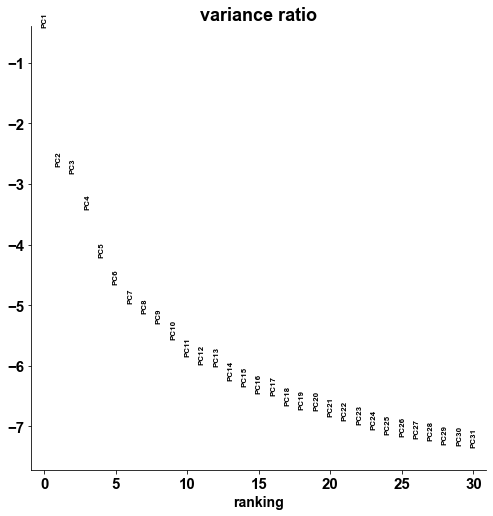

In [232]:
script_table = atac_adata.uns['integrated'].copy()
script_table.columns=[i[2:] for i in script_table.columns]
sudo_expression_SCRIPT = ad.AnnData(script_table)
sc.tl.pca(sudo_expression_SCRIPT, svd_solver='arpack')
# sc.pl.pca_variance_ratio(sudo_expression_SCRIPT, log=True)
sc.pp.neighbors(sudo_expression_SCRIPT, n_neighbors=10, n_pcs=20)
sc.tl.umap(sudo_expression_SCRIPT)
sc.tl.louvain(sudo_expression_SCRIPT)

sudo_expression_SCRIPT.obs['RNA_cluster']=pbmc_script_adata.obs['seurat_clusters'][sudo_expression_SCRIPT.obs.index]
sudo_expression_SCRIPT.obs['RNA_cell_type']=pbmc_script_adata.obs['assign.celltype'][sudo_expression_SCRIPT.obs.index]

In [ ]:
sc.pl.umap(sudo_expression_SCRIPT, color=['louvain', 'RNA_cluster','RNA_cell_type'])

In [117]:
chromVAR_z_table

,TFAP2B,TFAP2D,TFAP2C,TFAP2E,TFAP2A,ARID3A,ARID5B,ARID3B,ARID5A,ARID3C,...,PBX4,NKX62,HOXA4,CR8477943,RORB,SMAD5,SMAD9,SOX6,TBX18,TBX22
AAACAAGCACCACAAA,1.303155,-0.434590,-0.457119,0.965786,1.826718,0.222399,0.496754,-0.528345,-1.312826,-0.526592,...,0.842919,-0.305863,0.971412,0.427137,-1.044701,-0.917601,-0.342049,-0.336527,1.151196,1.151196
AAACAAGCAGCCAGTG,-0.976182,-1.168322,-0.749624,0.111072,-1.766978,1.799998,-0.155039,-0.134317,-0.192148,-1.253129,...,-0.720390,-0.669256,0.848806,1.072767,-1.286486,-0.828982,0.438613,-0.563324,-0.276718,-0.276718
AAACAAGCAGGACCTG,-0.306004,0.017620,-2.098204,-0.322960,0.011830,0.517261,1.146561,-0.352097,1.455611,1.236955,...,1.297821,0.715016,-0.548809,-1.734624,0.300097,0.831536,0.480913,0.069200,-0.268239,-0.268239
AAACAAGCATTGACTC,-1.007423,0.323479,-1.280677,-0.166447,0.446602,1.483417,-0.550072,1.051917,-0.922795,1.730456,...,0.060741,1.454022,1.212289,-1.754932,-0.939455,-0.047612,-0.010529,-0.102109,1.562885,1.562885
AAACAAGCATTGTTTG,-0.730665,-2.272845,-1.342869,0.210156,-0.269242,1.594789,2.052390,-0.832631,-0.345750,-0.674169,...,0.286168,-0.039768,-0.742604,1.295154,1.026998,-0.273359,-2.540347,-0.008690,0.580615,0.580615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCGAGGTGGCTA,-0.013423,-0.799812,0.496376,0.917468,0.017925,0.169166,-0.353570,0.610647,1.344225,-1.007314,...,0.536884,0.813049,1.305287,-0.697667,1.368993,-0.547129,-0.603766,0.577488,-1.279311,-1.279311
TTTGTGAGTACCTTGG,1.685638,0.145448,-0.257251,-0.655742,-0.480001,1.011504,2.912024,1.957431,1.021042,0.636026,...,1.403189,2.490445,1.535583,1.330865,2.118625,-0.473756,-0.481643,0.214739,2.689893,2.689893
TTTGTGAGTCATGAAG,0.623155,-0.161078,-0.115077,-1.991842,-2.108227,0.748301,-2.055235,2.969763,-0.743320,1.941854,...,-0.655526,0.041744,-0.956059,-0.746708,-0.027294,1.116511,-0.517152,1.549040,0.364667,0.364667
TTTGTGAGTGCAATAG,-1.938859,-0.064810,-1.381009,-1.163329,0.697171,1.176247,0.303462,-0.235745,0.805261,-1.139156,...,-0.156648,-0.144521,0.325093,0.590291,0.587448,1.176031,0.029297,0.091389,-1.017517,-1.017517


In [118]:
chromVAR_table = chromVAR_z_table.replace([np.inf, -np.inf], np.nan)
chromVAR_table = chromVAR_table.dropna(axis=1,how='any')

In [120]:
chromVAR_table

,TFAP2B,TFAP2D,TFAP2C,TFAP2E,TFAP2A,ARID3A,ARID5B,ARID3B,ARID5A,ARID3C,...,PBX4,NKX62,HOXA4,CR8477943,RORB,SMAD5,SMAD9,SOX6,TBX18,TBX22
AAACAAGCACCACAAA,1.303155,-0.434590,-0.457119,0.965786,1.826718,0.222399,0.496754,-0.528345,-1.312826,-0.526592,...,0.842919,-0.305863,0.971412,0.427137,-1.044701,-0.917601,-0.342049,-0.336527,1.151196,1.151196
AAACAAGCAGCCAGTG,-0.976182,-1.168322,-0.749624,0.111072,-1.766978,1.799998,-0.155039,-0.134317,-0.192148,-1.253129,...,-0.720390,-0.669256,0.848806,1.072767,-1.286486,-0.828982,0.438613,-0.563324,-0.276718,-0.276718
AAACAAGCAGGACCTG,-0.306004,0.017620,-2.098204,-0.322960,0.011830,0.517261,1.146561,-0.352097,1.455611,1.236955,...,1.297821,0.715016,-0.548809,-1.734624,0.300097,0.831536,0.480913,0.069200,-0.268239,-0.268239
AAACAAGCATTGACTC,-1.007423,0.323479,-1.280677,-0.166447,0.446602,1.483417,-0.550072,1.051917,-0.922795,1.730456,...,0.060741,1.454022,1.212289,-1.754932,-0.939455,-0.047612,-0.010529,-0.102109,1.562885,1.562885
AAACAAGCATTGTTTG,-0.730665,-2.272845,-1.342869,0.210156,-0.269242,1.594789,2.052390,-0.832631,-0.345750,-0.674169,...,0.286168,-0.039768,-0.742604,1.295154,1.026998,-0.273359,-2.540347,-0.008690,0.580615,0.580615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCGAGGTGGCTA,-0.013423,-0.799812,0.496376,0.917468,0.017925,0.169166,-0.353570,0.610647,1.344225,-1.007314,...,0.536884,0.813049,1.305287,-0.697667,1.368993,-0.547129,-0.603766,0.577488,-1.279311,-1.279311
TTTGTGAGTACCTTGG,1.685638,0.145448,-0.257251,-0.655742,-0.480001,1.011504,2.912024,1.957431,1.021042,0.636026,...,1.403189,2.490445,1.535583,1.330865,2.118625,-0.473756,-0.481643,0.214739,2.689893,2.689893
TTTGTGAGTCATGAAG,0.623155,-0.161078,-0.115077,-1.991842,-2.108227,0.748301,-2.055235,2.969763,-0.743320,1.941854,...,-0.655526,0.041744,-0.956059,-0.746708,-0.027294,1.116511,-0.517152,1.549040,0.364667,0.364667
TTTGTGAGTGCAATAG,-1.938859,-0.064810,-1.381009,-1.163329,0.697171,1.176247,0.303462,-0.235745,0.805261,-1.139156,...,-0.156648,-0.144521,0.325093,0.590291,0.587448,1.176031,0.029297,0.091389,-1.017517,-1.017517


In [94]:
sudo_expression_chromVAR = ad.AnnData(chromVAR_table)

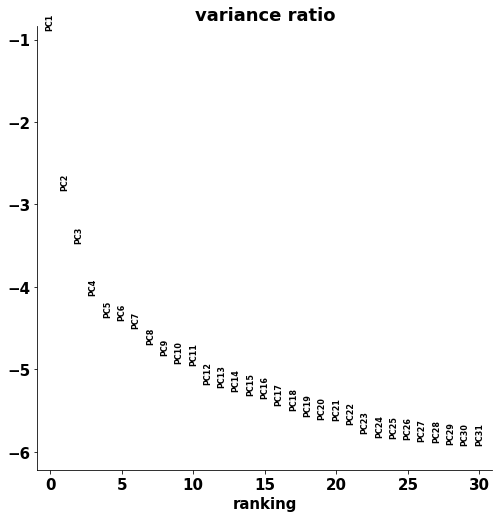

In [95]:
sc.tl.pca(sudo_expression_chromVAR, svd_solver='arpack')
sc.pl.pca_variance_ratio(sudo_expression_chromVAR, log=True)
sc.pp.neighbors(sudo_expression_chromVAR, n_neighbors=10, n_pcs=40)
sc.tl.umap(sudo_expression_chromVAR)
sc.tl.louvain(sudo_expression_chromVAR, resolution=0.6)

sudo_expression_chromVAR.obs['RNA_cluster']=pbmc_script_adata.obs['seurat_clusters'][sudo_expression_chromVAR.obs.index]
sudo_expression_chromVAR.obs['RNA_cell_type']=pbmc_script_adata.obs['assign.celltype'][sudo_expression_chromVAR.obs.index]

In [230]:
chromVAR_z_table.loc[metadata.index,:]

,TFAP2B,TFAP2D,TFAP2C,TFAP2E,TFAP2A,ARID3A,ARID5B,ARID3B,ARID5A,ARID3C,...,PBX4,NKX62,HOXA4,CR8477943,RORB,SMAD5,SMAD9,SOX6,TBX18,TBX22
AAACAAGCAGGACCTG,-0.306004,0.017620,-2.098204,-0.322960,0.011830,0.517261,1.146561,-0.352097,1.455611,1.236955,...,1.297821,0.715016,-0.548809,-1.734624,0.300097,0.831536,0.480913,0.069200,-0.268239,-0.268239
AAACAAGCATTGACTC,-1.007423,0.323479,-1.280677,-0.166447,0.446602,1.483417,-0.550072,1.051917,-0.922795,1.730456,...,0.060741,1.454022,1.212289,-1.754932,-0.939455,-0.047612,-0.010529,-0.102109,1.562885,1.562885
AAACCAGGTCCCAGAC,1.438078,0.076806,-1.271822,0.365837,0.142978,-0.332639,-0.374384,-0.413510,-2.521096,1.771814,...,0.223509,0.014789,0.468172,0.400978,-0.701573,1.770371,-0.475300,0.671114,0.152177,0.152177
AAACCAGGTCCTGCAA,-0.170950,-0.658464,-0.403671,0.179061,1.049270,1.669537,0.109668,-0.555977,-1.308907,0.864474,...,2.082029,-0.984921,-1.482455,-1.455789,-0.540424,0.688144,0.210028,0.072905,0.964961,0.964961
AAACCAGGTGAACCGG,-0.460834,-0.886342,-0.766338,-0.465211,-0.431128,0.885332,-0.276004,-2.540625,-0.738993,-0.113624,...,-1.519906,0.031961,0.690277,-0.213741,0.478403,0.533173,-2.103154,1.523761,0.776260,0.776260
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCGAGGTGGCTA,-0.013423,-0.799812,0.496376,0.917468,0.017925,0.169166,-0.353570,0.610647,1.344225,-1.007314,...,0.536884,0.813049,1.305287,-0.697667,1.368993,-0.547129,-0.603766,0.577488,-1.279311,-1.279311
TTTGTGAGTACCTTGG,1.685638,0.145448,-0.257251,-0.655742,-0.480001,1.011504,2.912024,1.957431,1.021042,0.636026,...,1.403189,2.490445,1.535583,1.330865,2.118625,-0.473756,-0.481643,0.214739,2.689893,2.689893
TTTGTGAGTCATGAAG,0.623155,-0.161078,-0.115077,-1.991842,-2.108227,0.748301,-2.055235,2.969763,-0.743320,1.941854,...,-0.655526,0.041744,-0.956059,-0.746708,-0.027294,1.116511,-0.517152,1.549040,0.364667,0.364667
TTTGTGAGTGCAATAG,-1.938859,-0.064810,-1.381009,-1.163329,0.697171,1.176247,0.303462,-0.235745,0.805261,-1.139156,...,-0.156648,-0.144521,0.325093,0.590291,0.587448,1.176031,0.029297,0.091389,-1.017517,-1.017517


In [234]:
chromVAR_tmp_table

,AAACAAGCACCACAAA,AAACAAGCAGCCAGTG,AAACAAGCAGGACCTG,AAACAAGCATTGACTC,AAACAAGCATTGTTTG,AAACCAGGTAAGGCCG,AAACCAGGTCCCAGAC,AAACCAGGTCCTGCAA,AAACCAGGTGAACCGG,AAACCAGGTGCTTTAA,...,TTTGGCCAGCGCAACA,TTTGGTTAGCTAACTT,TTTGGTTAGCTCCCTC,TTTGGTTAGGGTGGGA,TTTGGTTAGTGATTCT,TTTGTCGAGGTGGCTA,TTTGTGAGTACCTTGG,TTTGTGAGTCATGAAG,TTTGTGAGTGCAATAG,TTTGTGAGTGGCTTCA
TFAP2B,1.303155,-0.976182,-0.306004,-1.007423,-0.730665,1.217332,1.438078,-0.170950,-0.460834,0.353134,...,-0.322684,-1.223074,-1.619690,-0.632673,1.281908,-0.013423,1.685638,0.623155,-1.938859,-0.695988
TFAP2D,-0.434590,-1.168322,0.017620,0.323479,-2.272845,0.656976,0.076806,-0.658464,-0.886342,-0.702597,...,0.663341,-0.420950,-0.905760,-1.379683,0.196336,-0.799812,0.145448,-0.161078,-0.064810,-0.867768
TFAP2C,-0.457119,-0.749624,-2.098204,-1.280677,-1.342869,0.469212,-1.271822,-0.403671,-0.766338,-1.068650,...,0.111242,1.647079,-0.038931,0.608575,1.239084,0.496376,-0.257251,-0.115077,-1.381009,-0.743536
TFAP2E,0.965786,0.111072,-0.322960,-0.166447,0.210156,0.660467,0.365837,0.179061,-0.465211,0.300986,...,-1.163177,1.388965,1.876663,0.245649,0.371922,0.917468,-0.655742,-1.991842,-1.163329,-1.202155
TFAP2A,1.826718,-1.766978,0.011830,0.446602,-0.269242,1.390636,0.142978,1.049270,-0.431128,-0.786954,...,0.490961,-0.358665,1.821837,0.961340,-0.431193,0.017925,-0.480001,-2.108227,0.697171,1.046070
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SMAD5,-0.917601,-0.828982,0.831536,-0.047612,-0.273359,0.719507,1.770371,0.688144,0.533173,-0.958904,...,-0.958815,-1.143353,1.749163,-2.986052,0.556156,-0.547129,-0.473756,1.116511,1.176031,-0.161927
SMAD9,-0.342049,0.438613,0.480913,-0.010529,-2.540347,1.005228,-0.475300,0.210028,-2.103154,-0.228441,...,1.485162,-1.251759,0.448598,0.664227,1.479201,-0.603766,-0.481643,-0.517152,0.029297,-0.823841
SOX6,-0.336527,-0.563324,0.069200,-0.102109,-0.008690,1.148129,0.671114,0.072905,1.523761,-0.655649,...,-0.710599,0.088408,1.196813,-1.062061,1.360858,0.577488,0.214739,1.549040,0.091389,-1.268003
TBX18,1.151196,-0.276718,-0.268239,1.562885,0.580615,-1.087785,0.152177,0.964961,0.776260,2.635924,...,-0.050035,0.748789,-0.508629,-1.342183,0.887180,-1.279311,2.689893,0.364667,-1.017517,-0.203896


In [354]:
chromVAR_tmp_table = chromVAR_z_table.replace([np.inf, -np.inf], np.nan)
chromVAR_tmp_table = chromVAR_tmp_table.dropna(axis=1,how='any')

index = chromVAR_tmp_table.index.intersection(metadata.index)

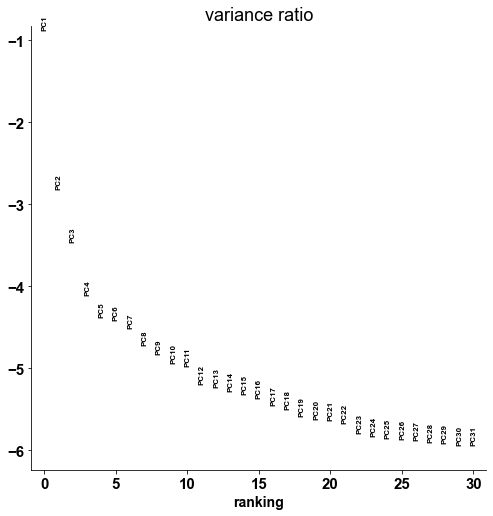

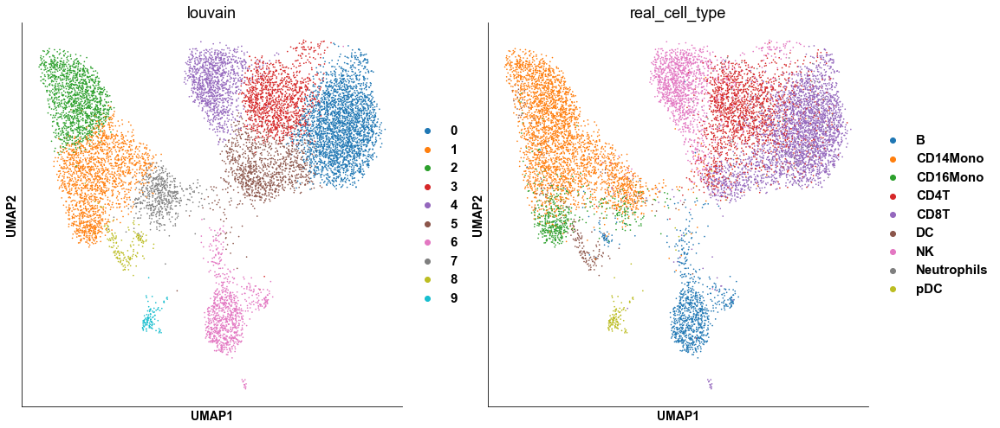

0.6358758872599667
0.6352422842587637


In [355]:
sudo_expression_chromVAR = umap_table(chromVAR_tmp_table.loc[index,:], metadata.loc[index,:])

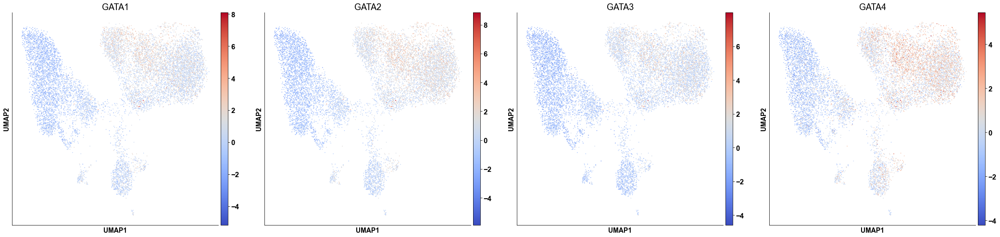

In [358]:
sc.pl.umap(sudo_expression_chromVAR, color=['GATA1', 'GATA2','GATA3','GATA4'], color_map='coolwarm')

In [ ]:
sc.pl.umap(sudo_expression_SCRIPT, color='louvain')

In [ ]:
sc.pl.umap(sudo_expression_SCRIPT, color='TBX21')

In [147]:
chromVAR_table_file = pd.read_csv('example/PBMC/chromVAR_ztable.txt', sep='\t')

In [161]:
chromVAR_z_table.loc[index,:]

,TFAP2B,TFAP2D,TFAP2C,TFAP2E,TFAP2A,ARID3A,ARID5B,ARID3B,ARID5A,ARID3C,...,PBX4,NKX62,HOXA4,CR8477943,RORB,SMAD5,SMAD9,SOX6,TBX18,TBX22
AAACAAGCAGGACCTG,-0.306004,0.017620,-2.098204,-0.322960,0.011830,0.517261,1.146561,-0.352097,1.455611,1.236955,...,1.297821,0.715016,-0.548809,-1.734624,0.300097,0.831536,0.480913,0.069200,-0.268239,-0.268239
AAACAAGCATTGACTC,-1.007423,0.323479,-1.280677,-0.166447,0.446602,1.483417,-0.550072,1.051917,-0.922795,1.730456,...,0.060741,1.454022,1.212289,-1.754932,-0.939455,-0.047612,-0.010529,-0.102109,1.562885,1.562885
AAACCAGGTCCCAGAC,1.438078,0.076806,-1.271822,0.365837,0.142978,-0.332639,-0.374384,-0.413510,-2.521096,1.771814,...,0.223509,0.014789,0.468172,0.400978,-0.701573,1.770371,-0.475300,0.671114,0.152177,0.152177
AAACCAGGTCCTGCAA,-0.170950,-0.658464,-0.403671,0.179061,1.049270,1.669537,0.109668,-0.555977,-1.308907,0.864474,...,2.082029,-0.984921,-1.482455,-1.455789,-0.540424,0.688144,0.210028,0.072905,0.964961,0.964961
AAACCAGGTGAACCGG,-0.460834,-0.886342,-0.766338,-0.465211,-0.431128,0.885332,-0.276004,-2.540625,-0.738993,-0.113624,...,-1.519906,0.031961,0.690277,-0.213741,0.478403,0.533173,-2.103154,1.523761,0.776260,0.776260
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCGAGGTGGCTA,-0.013423,-0.799812,0.496376,0.917468,0.017925,0.169166,-0.353570,0.610647,1.344225,-1.007314,...,0.536884,0.813049,1.305287,-0.697667,1.368993,-0.547129,-0.603766,0.577488,-1.279311,-1.279311
TTTGTGAGTACCTTGG,1.685638,0.145448,-0.257251,-0.655742,-0.480001,1.011504,2.912024,1.957431,1.021042,0.636026,...,1.403189,2.490445,1.535583,1.330865,2.118625,-0.473756,-0.481643,0.214739,2.689893,2.689893
TTTGTGAGTCATGAAG,0.623155,-0.161078,-0.115077,-1.991842,-2.108227,0.748301,-2.055235,2.969763,-0.743320,1.941854,...,-0.655526,0.041744,-0.956059,-0.746708,-0.027294,1.116511,-0.517152,1.549040,0.364667,0.364667
TTTGTGAGTGCAATAG,-1.938859,-0.064810,-1.381009,-1.163329,0.697171,1.176247,0.303462,-0.235745,0.805261,-1.139156,...,-0.156648,-0.144521,0.325093,0.590291,0.587448,1.176031,0.029297,0.091389,-1.017517,-1.017517


In [12]:
sudo_expression_chromVAR = ad.AnnData(chromVAR_table)

In [445]:
sudo_expression_chromVAR

AnnData object with n_obs × n_vars = 37818 × 869

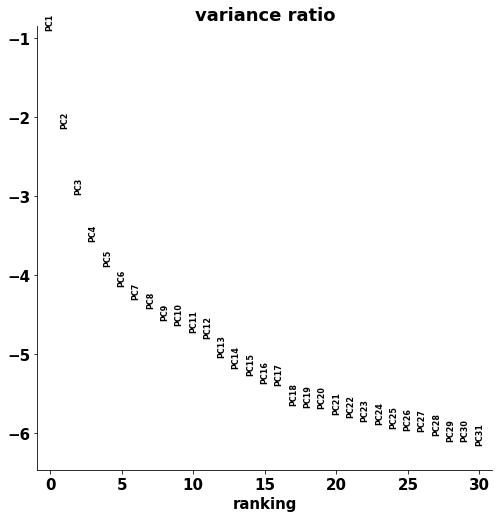

In [13]:
sc.tl.pca(sudo_expression_chromVAR, svd_solver='arpack')
sc.pl.pca_variance_ratio(sudo_expression_chromVAR, log=True)
sc.pp.neighbors(sudo_expression_chromVAR, n_neighbors=10, n_pcs=40)
sc.tl.umap(sudo_expression_chromVAR)

In [14]:
sc.tl.louvain(sudo_expression_chromVAR, resolution=0.8)

In [20]:
sudo_expression_chromVAR.obs['cell_type']=gold_cluster[sudo_expression_chromVAR.obs.index]

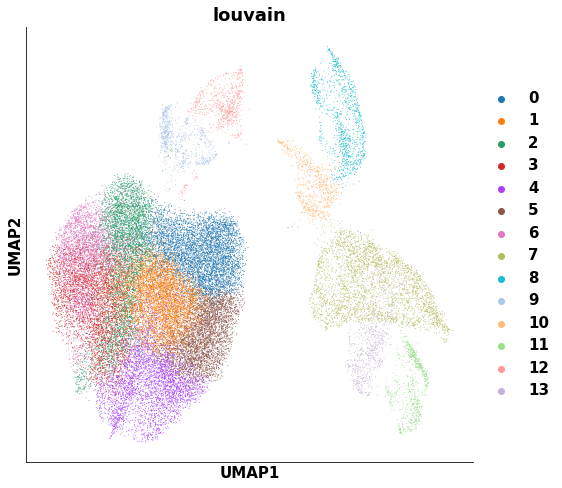

In [15]:
sc.pl.umap(sudo_expression_chromVAR, color='louvain')

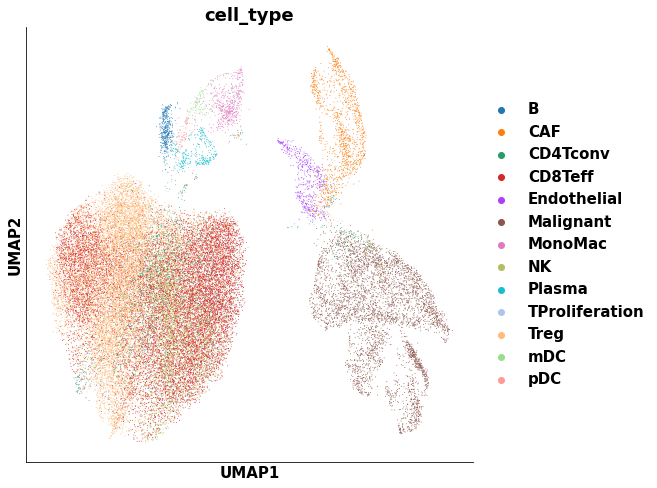

In [456]:
sc.pl.umap(sudo_expression_chromVAR, color='cell_type')

In [146]:
gold_cluster = metadata[metadata['tech']=='ATAC']['assign.ident']

In [23]:
real = gold_cluster[sudo_expression_chromVAR.obs.index]

In [45]:
script_nmi = sudo_expression_SCRIPT.obs['louvain'][sudo_expression_chromVAR.obs.index]
# chromvar_nmi = sudo_expression_chromVAR.obs['louvain'][sudo_expression_chromVAR.obs.index]

In [46]:
sklearn.metrics.normalized_mutual_info_score(real, script_nmi)

0.43982752132746

In [24]:
sklearn.metrics.normalized_mutual_info_score(real, chromvar_nmi)

0.4307002815428866

In [81]:
seurat_adata.obs['assign.celltype']=="B"

AAACGAAAGACACGGT    False
AAACGAAAGAGGTGGG    False
AAACGAAAGCACGTAG    False
AAACGAAAGCGCCTAC    False
AAACGAAAGCTTTCCC    False
                    ...  
TTTGTGTGTCCTATTT    False
TTTGTGTGTGCGTTTA    False
TTTGTGTGTGGCGCTT    False
TTTGTGTTCCGTTTCG    False
TTTGTGTTCGCGCTGA    False
Name: assign.celltype, Length: 7573, dtype: bool

In [86]:
inputmat

,chr10_100009409_100010370,chr10_100020344_100020844,chr10_100045992_100046450,chr10_10004_10426,chr10_100148689_100148853,chr10_100167512_100167918,chr10_100183568_100183733,chr10_100185426_100186618,chr10_100192474_100192634,chr10_100228843_100229860,...,chrY_7658983_7659334,chrY_7667828_7668166,chrY_7714481_7714782,chrY_7722639_7722800,chrY_7724052_7724763,chrY_7730142_7730519,chrY_7810584_7810819,chrY_7814235_7814827,chrY_8535794_8536106,chrY_9516722_9516902
AAACGAAAGACACGGT,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACGAAAGAGGTGGG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACGAAAGCACGTAG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACGAAAGCGCCTAC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACGAAAGCTTTCCC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTGTGTCCTATTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTGTGTGCGTTTA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTGTGTGGCGCTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTGTTCCGTTTCG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [180]:
inputmat = pbmc_10X_inputMat.to_df()

In [89]:
B_cluster = inputmat.loc[seurat_adata.obs[seurat_adata.obs['assign.celltype']=="B"].index,:]

In [95]:
B_cluster

,chr10_100009409_100010370,chr10_100020344_100020844,chr10_100045992_100046450,chr10_10004_10426,chr10_100148689_100148853,chr10_100167512_100167918,chr10_100183568_100183733,chr10_100185426_100186618,chr10_100192474_100192634,chr10_100228843_100229860,...,chrY_7658983_7659334,chrY_7667828_7668166,chrY_7714481_7714782,chrY_7722639_7722800,chrY_7724052_7724763,chrY_7730142_7730519,chrY_7810584_7810819,chrY_7814235_7814827,chrY_8535794_8536106,chrY_9516722_9516902
AAACTCGAGCGAATAT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
AAACTCGAGTCTTAGC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAAGGGCTCCATGTTT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAAGGGCTCTTGCGCT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAATGCCAGCGTTGCC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTACGTTCCAGCACG,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGAGGAGAGCTACG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGAGGGTCATAAGA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGGCCCATTATGGC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [109]:
peak = B_cluster.columns[B_cluster.sum(0)>10]

In [110]:
B_peak = [i.split('_') for i in peak]

In [111]:
B_peak.__len__()

32534

In [10]:
ref_gene = pd.read_csv('/mnt/Storage2/home/dongxin/Files/ref_files/hg38/hg38_refGene.bed', sep='\t')

In [33]:
ref_gene.drop_duplicates(['symbol'], 'first', True)

In [115]:
ref_gene['B_count']=count

In [116]:
ref_gene['B_count'].value_counts()

0    12580
1    12025
2      386
3        6
Name: B_count, dtype: int64

In [35]:
peak = [i.split('_') for i in pbmc_10X_inputMat.var['gene_ids']]

In [113]:
peak_dict = {}
for i in B_peak:
    center = int((int(i[1]) + int(i[2]))/2)
    if i[0] not in peak_dict.keys():
        peak_dict[i[0]] = [center]
    else:
        peak_dict[i[0]].append(center)

In [102]:
B_peak

[['chr10', '100009409', '100010370'],
 ['chr10', '100020344', '100020844'],
 ['chr10', '100045992', '100046450'],
 ['chr10', '100148689', '100148853'],
 ['chr10', '100167512', '100167918'],
 ['chr10', '100185426', '100186618'],
 ['chr10', '100228843', '100229860'],
 ['chr10', '100256880', '100257468'],
 ['chr10', '100266976', '100268067'],
 ['chr10', '100286009', '100287020'],
 ['chr10', '100297938', '100298245'],
 ['chr10', '100303820', '100303976'],
 ['chr10', '100326811', '100327446'],
 ['chr10', '100338413', '100338900'],
 ['chr10', '100339296', '100339659'],
 ['chr10', '100346458', '100347612'],
 ['chr10', '100370700', '100371560'],
 ['chr10', '100373123', '100374149'],
 ['chr10', '100420044', '100420310'],
 ['chr10', '100433674', '100434215'],
 ['chr10', '100481431', '100482900'],
 ['chr10', '100508664', '100509436'],
 ['chr10', '100510796', '100511418'],
 ['chr10', '100518716', '100519399'],
 ['chr10', '100529108', '100530205'],
 ['chr10', '100535541', '100536241'],
 ['chr10', '

In [46]:
ref_gene.index.__len__()

24997

In [114]:
count = [0] * ref_gene.index.__len__()
for i in ref_gene.index:
    print(i,end='\r')
    chro = ref_gene.loc[i,'chromosome']
    for pc in peak_dict[chro]:
        if ref_gene.loc[i,'TSS'] - 1000 < pc < ref_gene.loc[i,'TSS'] + 1000:
            count[i] += 1
        else:
            continue

<AxesSubplot:>

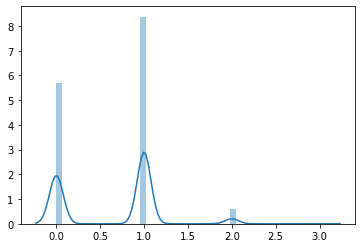

In [71]:
sns.distplot(count,norm_hist=False)

In [16]:
bg_table = read_giggle_result_batch('example/10X_ATAC/SCRIPT_result_20210111/bg_chip_result/')

INFO 2021-01-13 18:39:02 Reading searching results, using 8 cores...


In [23]:
print_full(bg_table.apply(np.std, axis=1))

id
1006_EOMES                              5.96
1007_EP300                             13.37
1010_FOXH1                              7.29
1011_FOXH1                             10.25
1012_FOXP1                             16.93
1013_FOXP1                             16.37
1080_SMAD2or3                           7.52
1082_SMAD2or3                          15.34
1084_SMAD3                              5.58
1085_SMAD3                             16.51
1086_SMAD4                             25.53
1087_SMAD4                             16.31
1168_POLR3G                           105.10
1173_ELK4                              40.62
1175_TRIM28                            11.21
1194_TRIM28                            13.20
1197_BRF1                             120.07
11_TCF4                                12.55
1208_DDX5                              19.22
1212_E2F1                              23.25
1213_ELK1                              20.15
1214_ELK4                              18.21
1218_GA

In [25]:
print_full(bg_table.apply(np.std, axis=1) * bg_table.apply(np.mean, axis=1))

id
1006_EOMES                            118.49
1007_EP300                         12,432.53
1010_FOXH1                            248.25
1011_FOXH1                          7,526.77
1012_FOXP1                         24,262.19
1013_FOXP1                         22,768.36
1080_SMAD2or3                         283.36
1082_SMAD2or3                      18,807.34
1084_SMAD3                            116.48
1085_SMAD3                         21,085.64
1086_SMAD4                          6,014.36
1087_SMAD4                         21,592.70
1168_POLR3G                        89,514.82
1173_ELK4                          73,405.66
1175_TRIM28                        10,825.73
1194_TRIM28                        12,163.78
1197_BRF1                         111,019.07
11_TCF4                             9,743.06
1208_DDX5                          29,789.04
1212_E2F1                          39,022.60
1213_ELK1                          32,355.39
1214_ELK4                          28,615.67
1218_GA

In [24]:
print_full(bg_table.apply(np.mean, axis=1))

id
1006_EOMES                             19.87
1007_EP300                            929.87
1010_FOXH1                             34.07
1011_FOXH1                            734.44
1012_FOXP1                          1,433.21
1013_FOXP1                          1,390.83
1080_SMAD2or3                          37.68
1082_SMAD2or3                       1,225.94
1084_SMAD3                             20.88
1085_SMAD3                          1,277.41
1086_SMAD4                            235.61
1087_SMAD4                          1,323.52
1168_POLR3G                           851.72
1173_ELK4                           1,807.01
1175_TRIM28                           965.34
1194_TRIM28                           921.23
1197_BRF1                             924.60
11_TCF4                               776.46
1208_DDX5                           1,549.87
1212_E2F1                           1,678.46
1213_ELK1                           1,605.68
1214_ELK4                           1,571.20
1218_GA

## chip impute

In [15]:
def get_motif_pattern_from_minimal(motif_file):
    with open(motif_file,'r') as handle:
        motif_record = motifs.parse(handle,'minimal')
    IUPAC_dict = {'R':'[AG]', 'Y':'[CT]', 'W':'[AT]', 'S':'[CG]', 'M':'[AC]', 'K':'[GT]', 'H':'[ACT]', 'B':'[CGT]', 'V':'[ACG]', 'D':'[AGT]', 'N':'[ACGT]'}
    motif_pattern = []
    for motif in motif_record:
        motif_seq = str(motif.degenerate_consensus)
        for k in IUPAC_dict.keys():
            motif_seq = motif_seq.replace(k, IUPAC_dict[k])
        motif_pattern.append(re.compile(motif_seq))
    return motif_pattern        

In [159]:
ref_fa = pysam.FastaFile("/mnt/Storage/home/dongxin/Files/FASTA_REFERENCE/hg38.fa")

In [16]:
def filter_motif_peaks(peak, motif_pattern):
    motif_peak_dict = {}
    cnt = 0
    for interval in peak.df.T.to_dict().values():
        interval_seq = str(ref_fa.fetch(reference=interval['Chromosome'],
                                        start=interval['Start'], end=interval['End']).upper())
        interval_seq = interval_seq[int(interval_seq.__len__()/2)-250 : int(interval_seq.__len__()/2+250)]
        for p in motif_pattern:
            if p.findall(interval_seq) != []:
    #             print(p.findall(interval_seq))
                motif_peak_dict[cnt] = interval
                break
        cnt += 1
    motif_peak = pd.DataFrame(motif_peak_dict).T
    return motif_peak


In [ ]:
def RP_AddExonRemovePromoter(peaks_info, genes_info_full, genes_info_tss, decay):
    """Multiple processing function to calculate regulation potential."""

    Sg = lambda x: 2**(-x)
    checkInclude = lambda x, y: all([x>=y[0], x<=y[1]])
    gene_distance = 15 * decay
    genes_peaks_score_array = sp_sparse.dok_matrix((len(genes_info_full), len(peaks_info)), dtype=np.float64)
    peaks_info_inbody = []
    peaks_info_outbody = []
    
    w = genes_info_full + peaks_info
    A = {}

    w.sort()
#     print(w[:100])
    for elem in w:
        if elem[-3] == 1:
            A[elem[-1]] = elem
        else:
            dlist = []
            for gene_name in list(A.keys()):
                g = A[gene_name]
                ### NOTE: main change here
                ### if peak center in the gene area
                if all([g[0]==elem[0], elem[1]>=g[1], elem[1]<=g[2]]):
                    ### if peak center in the exons
                    if any(list(map(checkInclude, [elem[1]]*len(g[5]), list(g[5])))):
                        genes_peaks_score_array[gene_name, elem[-1]] = 1.0 / g[-4]
                        peaks_info_inbody.append(elem)
                    ### if peak cencer in the promoter
                    elif checkInclude(elem[1], g[4]):
                        tmp_distance = abs(elem[1]-g[3])
                        genes_peaks_score_array[gene_name, elem[-1]] = Sg(tmp_distance / decay)
                        peaks_info_inbody.append(elem)
                    ### intron regions
                    else:
                        continue
                else:
                    dlist.append(gene_name)
            for gene_name in dlist:
                del A[gene_name]
    
    ### remove genes in promoters and exons
    peaks_info_set = [tuple(i) for i in peaks_info]
    peaks_info_inbody_set = [tuple(i) for i in peaks_info_inbody]
    peaks_info_outbody_set = list(set(peaks_info_set)-set(peaks_info_inbody_set))
    peaks_info_outbody = [list(i) for i in peaks_info_outbody_set]
    
    print("peaks number: ", len(peaks_info_set))
    print("peaks number in gene promoters and exons: ", len(set(peaks_info_inbody_set)))
    print("peaks number out gene promoters and exons:", len(peaks_info_outbody_set))
    
    w = genes_info_tss + peaks_info_outbody
    A = {}
    
    w.sort()
    for elem in w:
        if elem[-3] == 1:
            A[elem[-1]] = elem
        else:
            dlist = []
            for gene_name in list(A.keys()):
                g = A[gene_name]
                tmp_distance = elem[1] - g[1]
                if all([g[0]==elem[0], tmp_distance <= gene_distance]):
                    genes_peaks_score_array[gene_name, elem[-1]] = Sg(tmp_distance / decay)
                else:
                    dlist.append(gene_name)
            for gene_name in dlist:
                del A[gene_name]

    w.reverse()
    for elem in w:
        if elem[-3] == 1:
            A[elem[-1]] = elem
        else:
            dlist = []
            for gene_name in list(A.keys()):
                g = A[gene_name]
                tmp_distance = g[1] - elem[1]
                if all([g[0]==elem[0], tmp_distance <= gene_distance]):
                    genes_peaks_score_array[gene_name, elem[-1]] = Sg(tmp_distance / decay)
                else:
                    dlist.append(gene_name)
            for gene_name in dlist:
                del A[gene_name]
    
    return(genes_peaks_score_array)

In [49]:
peaks_list

[b'chr10_100009409_100010370',
 b'chr10_100020344_100020844',
 b'chr10_100045992_100046450',
 b'chr10_10004_10426',
 b'chr10_100148689_100148853',
 b'chr10_100167512_100167918',
 b'chr10_100183568_100183733',
 b'chr10_100185426_100186618',
 b'chr10_100192474_100192634',
 b'chr10_100228843_100229860',
 b'chr10_100240861_100241083',
 b'chr10_100254185_100254476',
 b'chr10_100256880_100257468',
 b'chr10_100266976_100268067',
 b'chr10_100277711_100278027',
 b'chr10_100286009_100287020',
 b'chr10_100291405_100291878',
 b'chr10_100292352_100292544',
 b'chr10_100297938_100298245',
 b'chr10_100303820_100303976',
 b'chr10_100326811_100327446',
 b'chr10_100338413_100338900',
 b'chr10_100339296_100339659',
 b'chr10_100346458_100347612',
 b'chr10_100364781_100365131',
 b'chr10_100370700_100371560',
 b'chr10_100373123_100374149',
 b'chr10_100420044_100420310',
 b'chr10_100433674_100434215',
 b'chr10_100481431_100482900',
 b'chr10_100508664_100509436',
 b'chr10_100510796_100511418',
 b'chr10_1005187

In [28]:
gene_bed = '/mnt/Storage2/home/dongxin/Projects/scATAC/MAESTRO/MAESTRO/annotations/GRCh38_refgenes.txt'
genes_info, genes_list = geneInfoSimple(gene_bed)

In [29]:
peaks_list = input_mat.columns
peaks_list = [p.encode() for p in peaks_list]
peaks_info= []
for ipeak, peak in enumerate(peaks_list):
    peaks_tmp = peak.decode().rsplit("_",maxsplit=2)
    peaks_info.append([peaks_tmp[0][3:], (int(peaks_tmp[1]) + int(peaks_tmp[2])) / 2.0, 0, ipeak])

In [50]:
genes_peaks_score_dok = RP_Simple(peaks_info, genes_info, 10000)

In [14]:
with open('example/10X_ATAC/RP_impute/peak_RP.pk', 'wb+') as f:
    pickle.dump(genes_peaks_score_dok, f)

In [ ]:
input_mat

In [117]:
# cluster rp
cell_type = set(seurat_adata.obs['assign.celltype'])
celltype_peak_mat = pd.DataFrame(np.zeros([cell_type.__len__(), input_mat.columns.__len__()]), index=cell_type, columns = input_mat.columns)
for ct in cell_type:
    ct_bc = seurat_adata.obs.index[seurat_adata.obs['assign.celltype'] == ct].to_list()
    celltype_peak_mat.loc[ct,:] = [1 if i else 0 for i in input_mat.loc[ct_bc,:].sum() >= 1]

In [133]:
with open('example/10X_ATAC/RP_impute/impute_cell_peak_mat/ret_ct_peak.pk' , 'wb+') as f:
    pickle.dump(scipy.sparse.csr_matrix(celltype_peak_mat), f)

In [ ]:
# chip_cell_peak = pd.DataFrame(np.zeros(ret_cell_peak_10_dense.shape), index = ret_cell_peak_10_dense.index, columns = ret_cell_peak_10_dense.columns)
# chip_bed = pybedtools.BedTool('/mnt/Storage/home/dongxin/Projects/scATAC/human/top10k/82369_BCL11A.bed.gz')
# for cell_bc in ret_cell_peak_10_dense.index:
#     print(1)
#     pl = ret_cell_peak_10_dense.columns[ret_cell_peak_10_dense.loc[cell_bc,:] == 1]
#     tmp_bed = pybedtools.BedTool('\n'.join([p[::-1].replace('_','\t',2)[::-1] for p in pl]), from_string=True)
#     print(2)
#     chip_peak = str(tmp_bed.intersect(chip_bed, u=True)).replace('\t','_').split('\n')
#     print(3)
#     print(chip_peak.__len__())
#     for c in chip_peak:
#         chip_cell_peak.at[cell_bc,c] = 1

## dict of RNA ATAC

In [18]:
coor_table = pd.DataFrame(seurat_adata.obsm['X_umap'], index = seurat_adata.obs.index, columns=["X","Y"])

In [21]:
i = 50

ret_cell_peak = cal_neighbor_cell_peak_mat_batch(input_mat, coor_table, i, 8)

with open('example/PBMC/neighbor_impute/ret_cell_peak_signal_%s.pk' % str(i),'wb+') as f:
    pickle.dump(ret_cell_peak, f)

INFO 2021-03-25 19:20:49 Calculating enrichment, divide into 8 chunks...
0
1
2
3
4
5
6
7
INFO 2021-03-25 21:25:46 finished!


In [ ]:
i = 50
with open('example/PBMC/neighbor_impute/ret_cell_peak_signal_%s.pk' % str(i),'rb+') as f:
    ret_cell_peak = pickle.load(f)

In [23]:
np.sqrt(ret_cell_peak)

,chr10_100009284_100010367,chr10_100020473_100021014,chr10_100045988_100046455,chr10_10004_10427,chr10_100167498_100168427,chr10_100168868_100169192,chr10_100183499_100183734,chr10_100185396_100186614,chr10_100192314_100192840,chr10_100228797_100230018,...,chrY_56836532_56836952,chrY_56838854_56839093,chrY_56839328_56839739,chrY_56842236_56842543,chrY_56843024_56843878,chrY_56845075_56845389,chrY_56846947_56847228,chrY_56847794_56848071,chrY_56848693_56849075,chrY_56850217_56851134
AAACAAGCACCACAAA,2.828427,0.0,0.0,0.0,0.000000,0.0,0.000000,3.000000,0.00000,2.236068,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACAAGCAGCCAGTG,1.000000,0.0,0.0,0.0,0.000000,0.0,1.000000,1.000000,0.00000,1.414214,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACAAGCAGGACCTG,2.449490,0.0,1.0,0.0,0.000000,0.0,0.000000,4.123106,0.00000,3.741657,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACAAGCATTGACTC,4.472136,0.0,1.0,0.0,1.000000,0.0,1.000000,3.605551,0.00000,4.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACAAGCATTGTTTG,3.162278,0.0,0.0,0.0,1.414214,0.0,0.000000,4.795832,0.00000,3.605551,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCGAGGTGGCTA,3.000000,0.0,1.0,0.0,0.000000,0.0,2.645751,3.000000,2.44949,4.123106,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTGAGTACCTTGG,4.358899,0.0,0.0,0.0,0.000000,0.0,1.414214,4.358899,0.00000,4.472136,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTGAGTCATGAAG,2.645751,1.0,1.0,0.0,1.000000,0.0,1.000000,4.690416,0.00000,3.872983,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTGAGTGCAATAG,2.828427,0.0,0.0,0.0,1.414214,1.0,0.000000,4.123106,0.00000,4.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
find_nearest_cells('AAACGAAAGACACGGT', coor_table, n_neighbor=50, step=None)

## here

In [122]:
input_mat = pbmc_10X_inputMat.to_df()
input_mat = input_mat.loc[atac_adata.obs.index,:].copy()

In [123]:
gene_bed = '/mnt/Storage2/home/dongxin/Projects/scATAC/MAESTRO/MAESTRO/annotations/GRCh38_refgenes.txt'
genes_info, genes_list = geneInfoSimple(gene_bed)

In [124]:
with open('example/PBMC/neighbor_impute/ret_cell_peak_signal_50.pk' , 'rb+') as f:
    ret_cell_peak = pickle.load(f)

In [ ]:
ret_cell_peak

In [ ]:
# ret_cell_peak = pd.DataFrame(ret_cell_peak.todense(), index=input_mat.index, columns=input_mat.columns)

### config rp TF

In [863]:
factor='BCL11A'
cells_intrest=['B', 'Mono_Macro']
chip_bed = pybedtools.BedTool('/mnt/Storage/home/dongxin/Projects/scATAC/human/top10k/82369_BCL11A.bed.gz')

In [880]:
factor='BCL11B'
cells_intrest=['NK', 'T']
chip_bed = pybedtools.BedTool('/mnt/Storage/home/dongxin/Projects/scATAC/human/top10k/73986_BCL11B.bed.gz')

In [895]:
factor='EBF1'
cells_intrest=['B', 'Mono_Macro', 'T']
chip_bed = pybedtools.BedTool('/mnt/Storage/home/dongxin/Projects/scATAC/human/top10k/46129_EBF1.bed.gz')

In [903]:
factor='CEBPA'
cells_intrest=['B', 'T', 'Mono_Macro']
chip_bed = pybedtools.BedTool('/mnt/Storage/home/dongxin/Projects/scATAC/human/top10k/48277_CEBPA.bed.gz')

In [910]:
factor='TBX21'
cells_intrest=['B', 'NK', 'T']
chip_bed = pybedtools.BedTool('/mnt/Storage/home/dongxin/Projects/scATAC/human/top10k/33678_TBX21.bed.gz')

In [919]:
factor='FOXO1'
cells_intrest=['B', 'NK', 'T', 'Mono_Macro']
chip_bed = pybedtools.BedTool('/mnt/Storage/home/dongxin/Projects/scATAC/human/top10k/58300_FOXO1.bed.gz')


In [920]:
# chip_bed = pybedtools.BedTool('/mnt/Storage/home/dongxin/Files/cistrome/human/human_factor/46129_sort_peaks.narrowPeak.bed')
tmp_bed = pybedtools.BedTool('\n'.join(['\t'.join(p.rsplit('_', maxsplit=2)) for p in ret_cell_peak.columns]), from_string=True) # p[::-1].replace('_','\t',2)[::-1]
chip_peak = str(tmp_bed.intersect(chip_bed, u=True)).replace('\t','_').split('\n')[0:-1]

chip_peak.__len__()

# chip_cell_peak = np.sqrt(chip_cell_peak)

chip_cell_peak = ret_cell_peak[chip_peak].copy()

cells_list = chip_cell_peak.index

peaks_list = chip_cell_peak.columns.tolist()
# peaks_list = [p.encode() for p in peaks_list]
peaks_info= []
for ipeak, peak in enumerate(peaks_list):
    peaks_tmp = peak.rsplit("_", maxsplit=2)
    peaks_info.append([peaks_tmp[0][3:], (int(peaks_tmp[1]) + int(peaks_tmp[2])) / 2.0, 0, ipeak])

genes_peaks_score_dok = RP_Simple(peaks_info, genes_info, 10000)

genes_peaks_score_csr = genes_peaks_score_dok.tocsr()
genes_cells_score_csr = genes_peaks_score_csr.dot(scipy.sparse.csr_matrix(chip_cell_peak).T)

score_cells_dict = {}
score_cells_sum_dict = {}

for igene, gene in enumerate(genes_list):
    score_cells_dict[gene] = igene
    score_cells_sum_dict[gene] = genes_cells_score_csr[igene, :].sum()

score_cells_dict_dedup = {}
score_cells_dict_max = {}
genes = list(set([i.split("@")[0] for i in genes_list]))
for gene in genes:
    score_cells_dict_max[gene] = float("-inf")

for gene in genes_list:
    symbol = gene.split("@")[0]
    if score_cells_sum_dict[gene] > score_cells_dict_max[symbol]:
        score_cells_dict_dedup[symbol] = score_cells_dict[gene]
        score_cells_dict_max[symbol] = score_cells_sum_dict[gene]
gene_symbol = sorted(score_cells_dict_dedup.keys())
matrix_row = []
for gene in gene_symbol:
    matrix_row.append(score_cells_dict_dedup[gene])

score_cells_matrix = genes_cells_score_csr[matrix_row, :]

RP_table = pd.DataFrame(score_cells_matrix.todense(), index=gene_symbol, columns=cells_list)


/mnt/Storage/home/dongxin/Applications/miniconda3/envs/test/lib/python3.8/subprocess.py:853: RuntimeWarning: line buffering (buffering=1) isn't supported in binary mode, the default buffer size will be used
  self.stderr = io.open(errread, 'rb', bufsize)


In [921]:
sub_RP_table = RP_table[RP_table.sum(axis=1) != 0]# .loc[:,cell_type_bc]

In [922]:
with open('example/PBMC/RP_result/50_fraction_%s_RP_table.pk' % factor,'wb+') as file:
    pickle.dump(sub_RP_table, file)


In [911]:
with open('example/PBMC/RP_result/50_fraction_%s_RP_table.pk' % factor,'rb') as file:
    sub_RP_table = pickle.load(file)

In [923]:
sub_RP_table_z = sub_RP_table.apply(scipy.stats.zscore, axis='index')

In [ ]:
# genes_peaks_dense = pd.DataFrame(genes_peaks_score_dok.todense(),index = genes_list, columns = peaks_list)
# genes_peaks_dense[[i.startswith('SPRY3') for i in genes_peaks_dense.index]].max().sort_values()
# cell_type_bc = atac_seurat_adata.obs[seurat_adata.obs['assign.ident'] == 'B'].index.tolist()

In [849]:
plot_adata = atac_adata.copy()
plot_adata.obs = pd.concat([atac_adata.obs, sub_RP_table_z.T.reindex(index=atac_adata.obs.index)], axis=1)
plot_adata.var.index = ['R_' + i for i in plot_adata.var.index]

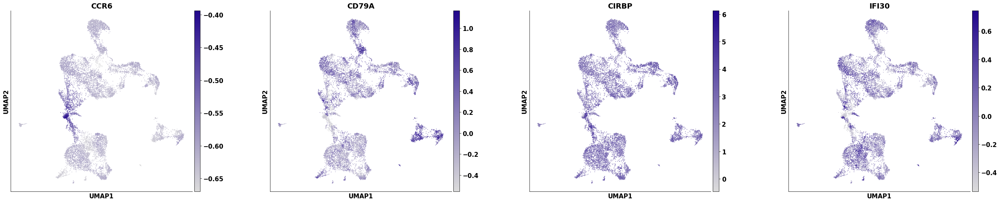

In [707]:
# for i in ['STAT1','CD86','IRF5','NOTCH1','CCDC107','IRF9']:
# for i in ['IRF9']:
# sc.pl.umap(plot_adata, color= ['SLAMF7','CD86','IRF5','NOTCH1','MS4A1','CD19','CD79A', 'IGKC'], wspace=0.3, color_map=regulation_cmp)
sc.pl.umap(plot_adata, color= ['CCR6','CD79A','CIRBP','IFI30'], wspace=0.3, color_map=regulation_cmp)

In [924]:
target_gene_list = []
target_gene_list += sub_RP_table_z.max(1).sort_values(ascending=False)[0:300].index.tolist()
target_gene_list += sub_RP_table_z.std(1).sort_values(ascending=False)[0:300].index.tolist()
target_gene_list = set(target_gene_list)
tg_list = [g for g in target_gene_list if g in rna_expr.columns] 

In [925]:
cell_barcode_rna = []
for cell in cells_intrest:
    cell_barcode_rna += rna_adata.obs[(rna_adata.obs['assign.ident']==cell)].index.tolist()


keys.index = keys['RNA']
cell_barcode_atac = keys.loc[cell_barcode_rna]['ATAC'].values

cell_barcode_atac = [i for i in cell_barcode_atac if i in pbmc_script_adata.obs.index]

keys.index = keys['ATAC']
cell_barcode_rna = keys.loc[cell_barcode_atac]['RNA'].values

In [926]:
tar_expr = rna_expr.loc[cell_barcode_rna,tg_list + [factor]].copy()

tf_RP = sub_RP_table_z.loc[tg_list,cell_barcode_atac].T

coor = []
pvalue = []
# rp_corr = []
for i in tf_RP.columns:
    tmp = scipy.stats.spearmanr(tar_expr[factor], tar_expr[i])
    if not np.isnan(tmp.correlation):
        coor.append(tmp.correlation)
        pvalue.append(tmp.pvalue)
    else:
        coor.append(0)
        pvalue.append(1)
#     tmp1 = scipy.stats.spearmanr(tf_RP[i], tar_expr[i])
#     rp_corr.append(tmp1.correlation)

tf_RP = sub_RP_table_z.loc[tg_list,cell_barcode_atac].T.median()

data = pd.DataFrame(np.array([coor,tf_RP, -np.log(pvalue)]).T, columns = ['corr', 'RP', '-log.p'], index = tg_list)

In [916]:
# tf_regu = pbmc_script_adata.obs['I_'+factor].loc[cell_barcode_atac,]

55


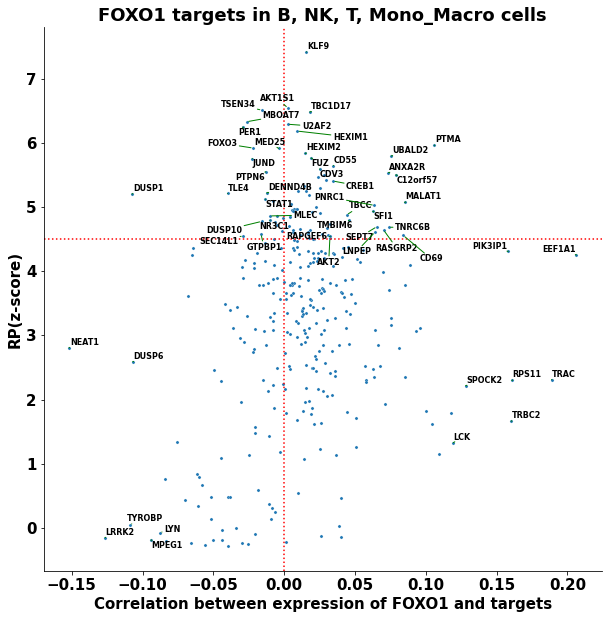

In [927]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
sns.scatterplot(data=data, x = 'corr', y = 'RP', s=10)

x_q02 = data.iloc[:,0].quantile(0.98)
x_q25 = data.iloc[:,0].quantile(0.75)
x_q75 = data.iloc[:,0].quantile(0.25)
x_q98 = data.iloc[:,0].quantile(0.02)
y_q25 = data.iloc[:,1].quantile(0.75)
y_q05 = data.iloc[:,1].quantile(0.95)

texts = []
for i in range(len(data.index)):
    if data.iloc[i,0] > x_q02:
        texts.append(plt.text(data.iloc[i,0], data.iloc[i,1],  data.index[i], size=8))
    elif data.iloc[i,0] < x_q98:
        texts.append(plt.text(data.iloc[i,0], data.iloc[i,1],  data.index[i], size=8))
    elif data.iloc[i,1] > y_q05:
        texts.append(plt.text(data.iloc[i,0], data.iloc[i,1],  data.index[i], size=8))
    elif data.iloc[i,1] > y_q25 and data.iloc[i,0] > x_q25:
        texts.append(plt.text(data.iloc[i,0], data.iloc[i,1],  data.index[i], size=8))
    elif data.iloc[i,1] > y_q25 and data.iloc[i,0] < x_q75:
        texts.append(plt.text(data.iloc[i,0], data.iloc[i,1],  data.index[i], size=8))
print(texts.__len__())
adjust_text(texts, arrowprops=dict(arrowstyle='-', color='green'))

for hl in [y_q25]:
    ax.axhline(hl, linestyle=':', color='red')
for vl in [0]:
    ax.axvline(vl, linestyle=':', color='red')
    
ax.set_xlabel('Correlation between expression of %s and targets' % factor)
ax.set_ylabel('RP(z-score)')
ax.set_title('%s targets in %s cells' % (factor, ', '.join(cells_intrest)))
fig.show()

In [426]:
kmeans = KMeans(n_clusters=7, random_state=0).fit(sub_RP_table)

In [ ]:
# sns.heatmap(sub_RP_table.iloc[0:100,:], xticklabels=False, yticklabels=False, cmap='RdBu_r')

RP11-134P9.3     42.470775
PSME2            41.784596
RNF31            41.532952
RP11-398A8.3     41.301670
GNAI2            39.421524
                   ...    
PRRT2            31.717071
RP11-440L14.1    31.664623
AC009133.23      31.606836
EIF4ENIF1        31.601642
RHOG             31.593741
Length: 100, dtype: float64

In [131]:
a = sub_RP_table.sum(axis=1).sort_values(ascending=False)

In [129]:
sub_RP_table

,AAACTCGAGCGAATAT,AAACTCGAGTCTTAGC,AAAGGGCTCCATGTTT,AAAGGGCTCTTGCGCT,AAATGCCAGCGTTGCC,AACAAAGGTAATGCAA,AACAGTCCAGGCTACC,AACAGTCTCTCTTAAC,AACCAACTCTGACTTT,AACCGATGTACGGATG,...,TTGCTTATCTTCTTCC,TTGGTCCTCGAGGTAG,TTGTTCAAGGCCAGTA,TTGTTGTCATCGACGC,TTGTTGTCATTGAACC,TTTACGTTCCAGCACG,TTTGAGGAGAGCTACG,TTTGAGGGTCATAAGA,TTTGGCCCATTATGGC,TTTGGTTCACAAGGGT
A1BG,0.281810,0.242142,0.369600,0.177019,0.280370,0.203914,0.215248,0.220914,0.143738,0.143738,...,0.094176,0.061615,0.225861,0.276143,0.177739,0.310144,0.099843,0.164966,0.099843,0.253476
A1BG-AS1,0.266700,0.222594,0.345656,0.168841,0.255772,0.189417,0.202018,0.208319,0.136500,0.136500,...,0.090721,0.063845,0.209156,0.260399,0.174305,0.298204,0.097022,0.150775,0.097022,0.235196
A2ML1,0.007843,0.004991,0.009269,0.003565,0.004991,0.004278,0.000713,0.003565,0.004278,0.004278,...,0.007130,0.003565,0.006417,0.004991,0.002852,0.013547,0.004278,0.003565,0.005704,0.006417
A3GALT2,0.000840,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000840,0.000000,0.000000,0.000840,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
A4GALT,1.401102,0.972065,0.751330,1.483036,1.192243,1.038830,0.833014,1.490917,1.684511,1.684511,...,2.489696,1.577759,0.481178,1.484263,0.754147,1.747224,2.458621,1.314864,1.744892,0.481869
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSWIM4,0.565665,0.213596,0.702233,0.520143,0.120645,0.148340,0.324375,0.575532,0.148340,0.148340,...,0.296680,0.176035,0.176035,0.462848,0.213596,0.549743,0.176035,0.306547,0.168074,0.203729
ZSWIM8,0.048418,0.048418,0.110660,0.036314,0.060523,0.060523,0.048802,0.060523,0.036314,0.036314,...,0.096837,0.036314,0.012105,0.085495,0.084732,0.158123,0.048418,0.012868,0.121238,0.024209
ZSWIM8-AS1,0.144136,0.144136,0.329420,0.108102,0.180170,0.180170,0.145279,0.180170,0.108102,0.108102,...,0.288271,0.108102,0.036034,0.254509,0.252238,0.470713,0.144136,0.038305,0.360911,0.072068
ZYG11B,0.020776,0.012466,0.029087,0.027009,0.014543,0.012466,0.016621,0.027009,0.010388,0.010388,...,0.008310,0.010388,0.016621,0.029087,0.018699,0.033242,0.010388,0.012466,0.010388,0.016621


In [ ]:
a[0:50]

In [ ]:
for i in [5, 10, 20, 50, 75, 100]:
    print(i)
    locals()['ret_cell_peak_%s' % str(i)] = cal_neighbor_cell_peak_mat_batch(input_mat, coor_table, i, 8)
    with open('example/10X_ATAC/RP_impute/impute_cell_peak_mat/ret_cell_peak_%s.pk' % str(i),'wb+') as f:
        pickle.dump(locals()['ret_cell_peak_%s' % str(i)], f)
    print_log('Finish saving.')

In [15]:
cells_list = input_mat.index.to_list()

# for i in [50, 75, 100]:
#     print(i)
#     with open('example/10X_ATAC/RP_impute/impute_cell_peak_mat/ret_cell_peak_%i.pk' % i,'rb+') as f:
#         ret_cell_peak = pickle.load(f)

#     cell_peaks_csr = scipy.sparse.csr_matrix(ret_cell_peak)

    genes_peaks_score_csr = genes_peaks_score_dok.tocsr()
    genes_cells_score_csr = genes_peaks_score_csr.dot(ret_cell_peak.T)

    score_cells_dict = {}
    score_cells_sum_dict = {}

    for igene, gene in enumerate(genes_list):
        score_cells_dict[gene] = igene
        score_cells_sum_dict[gene] = genes_cells_score_csr[igene, :].sum()

    score_cells_dict_dedup = {}
    score_cells_dict_max = {}
    genes = list(set([i.split("@")[0] for i in genes_list]))
    for gene in genes:
        score_cells_dict_max[gene] = float("-inf")

    for gene in genes_list:
        symbol = gene.split("@")[0]
        if score_cells_sum_dict[gene] > score_cells_dict_max[symbol]:
            score_cells_dict_dedup[symbol] = score_cells_dict[gene]
            score_cells_dict_max[symbol] = score_cells_sum_dict[gene]
    gene_symbol = sorted(score_cells_dict_dedup.keys())
    matrix_row = []
    for gene in gene_symbol:
        matrix_row.append(score_cells_dict_dedup[gene])

    score_cells_matrix = genes_cells_score_csr[matrix_row, :]

    RP_table = pd.DataFrame(score_cells_matrix.todense(), index=gene_symbol, columns=cells_list)

    with open('example/10X_ATAC/RP_impute/RP_%s_cell.pk' %i, 'wb+') as f:
        pickle.dump(RP_table, f)

50
75
100


In [94]:
# write_10X_h5('example/10X_ATAC/RP_impute/RP_5_cell.h5', score_cells_matrix, gene_symbol, cells_list, genome=gene_bed.split("/")[-1].split("_")[0], datatype="Gene")

In [137]:
cell_peaks_csr = scipy.sparse.csr_matrix(celltype_peak_mat)

genes_peaks_score_csr = genes_peaks_score_dok.tocsr()
genes_cells_score_csr = genes_peaks_score_csr.dot(cell_peaks_csr.T)

score_cells_dict = {}
score_cells_sum_dict = {}

for igene, gene in enumerate(genes_list):
    score_cells_dict[gene] = igene
    score_cells_sum_dict[gene] = genes_cells_score_csr[igene, :].sum()

score_cells_dict_dedup = {}
score_cells_dict_max = {}
genes = list(set([i.split("@")[0] for i in genes_list]))
for gene in genes:
    score_cells_dict_max[gene] = float("-inf")

for gene in genes_list:
    symbol = gene.split("@")[0]
    if score_cells_sum_dict[gene] > score_cells_dict_max[symbol]:
        score_cells_dict_dedup[symbol] = score_cells_dict[gene]
        score_cells_dict_max[symbol] = score_cells_sum_dict[gene]
gene_symbol = sorted(score_cells_dict_dedup.keys())
matrix_row = []
for gene in gene_symbol:
    matrix_row.append(score_cells_dict_dedup[gene])

score_cells_matrix = genes_cells_score_csr[matrix_row, :]

RP_table = pd.DataFrame(score_cells_matrix.todense(), index=gene_symbol, columns=cell_type)

with open('example/10X_ATAC/RP_impute/cluster_rp.pk' , 'wb+') as f:
    pickle.dump(RP_table, f)

In [ ]:
RP_table

In [24]:
# plot
# load dataset
with open('example/10X_ATAC/RP_impute/cluster_rp.pk' , 'rb+') as f:
    cluster_rp = pickle.load(f)
for i in [5,10,20,50,75,100]:
    with open('example/10X_ATAC/RP_impute/RP_%s_cell.pk' %i, 'rb+') as f:
        locals()['RP_%s_cell' %i] = pickle.load(f)

In [45]:
result_dict = {}
result_dict['cell_type']=[]
result_dict['impute_number']=[]
result_dict['difference_sum']=[]
result_dict['std.']=[]
for ct in cluster_rp.columns:
    ct_bc = seurat_adata.obs.index[seurat_adata.obs['assign.celltype'] == ct].to_list()
    tmp_cluster_mat = pd.DataFrame(np.zeros([cluster_rp.index.__len__(), ct_bc.__len__()]), index=cluster_rp.index, columns = ct_bc)
    for i in tmp_cluster_mat.columns:
        tmp_cluster_mat[i] = cluster_rp[ct]
    for impu in [5,10,20,50,75,100]:
        diff = abs(locals()['RP_%s_cell' % impu].loc[:,ct_bc] - tmp_cluster_mat).sum().mean()
        std = locals()['RP_%s_cell' % impu].loc[:,ct_bc].std(1)
        std = std[std!=0].mean()
        result_dict['cell_type'].append(ct)
        result_dict['impute_number'].append(impu)
        result_dict['difference_sum'].append(diff)
        result_dict['std.'].append(std)

In [51]:
result_frame = pd.DataFrame.from_dict(result_dict)
with open('example/10X_ATAC/RP_impute/result.pk', 'wb+') as f:
    pickle.dump(result_frame, f)

In [59]:
result_frame[result_frame['cell_type']=='Mono/Macro']

,cell_type,impute_number,difference_sum,std.
0,Mono/Macro,5,75143.564980,0.351939
1,Mono/Macro,10,65312.304338,0.367111
2,Mono/Macro,20,54337.776462,0.362915
3,Mono/Macro,50,39596.649533,0.346345
4,Mono/Macro,75,33217.711931,0.332186
5,Mono/Macro,100,28861.766474,0.318797


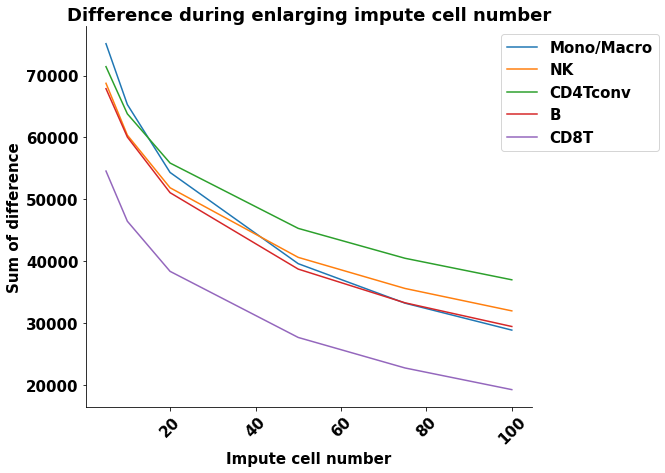

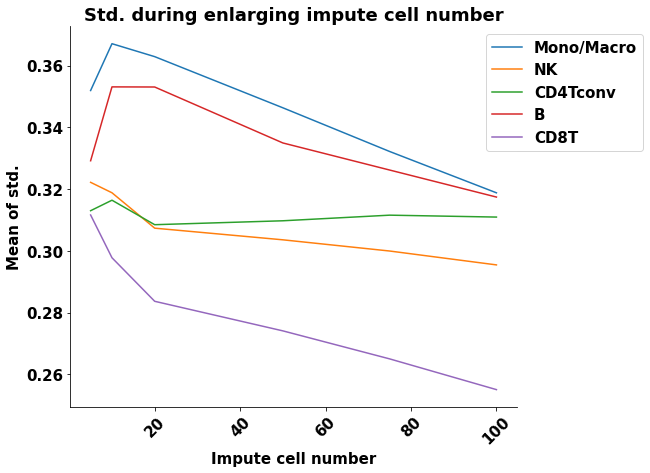

In [90]:
fig, ax = plt.subplots(figsize=(8,7))
sns.lineplot(data=result_frame, x="impute_number", y="difference_sum", hue='cell_type')
plt.xticks(rotation=45)
ax.legend(bbox_to_anchor=(1.3, 1.0))
ax.set_xlabel('Impute cell number')
ax.set_ylabel('Sum of difference')
ax.set_title('Difference during enlarging impute cell number')
fig.show()
fig, ax = plt.subplots(figsize=(8,7))
sns.lineplot(data=result_frame, x="impute_number", y="std.", hue='cell_type')
plt.xticks(rotation=45)
ax.legend(bbox_to_anchor=(1.3, 1.0))
ax.set_xlabel('Impute cell number')
ax.set_ylabel('Mean of std.')
ax.set_title('Std. during enlarging impute cell number')
fig.show()

In [73]:
for i in [5,10,20,50,75,100]:
    with open('example/10X_ATAC/RP_impute/impute_cell_peak_mat/ret_cell_peak_%s.pk' % str(i),'rb+') as f:
        locals()['ret_cell_peak_%s' % str(i)] = pickle.load(f)

In [86]:
peak_number = []
for i in [5,10,20,50,75,100]:
    peak_number.append(locals()['ret_cell_peak_%s' % str(i)].sum(1).mean())


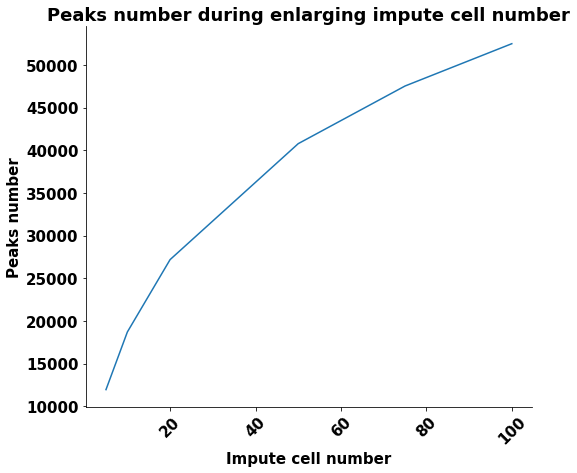

In [89]:
fig, ax = plt.subplots(figsize=(8,7))
sns.lineplot(x=[5,10,20,50,75,100], y=peak_number)
plt.xticks(rotation=45)
ax.set_xlabel('Impute cell number')
ax.set_ylabel('Peaks number')
ax.set_title('Peaks number during enlarging impute cell number')
fig.show()

In [ ]:
# plot peak

In [12]:
item = {}
for i in seurat_adata.obs['assign.ident'].unique():
    item[i]=(seurat_adata.obs[seurat_adata.obs['assign.ident'] == i].__len__())

In [41]:
seurat_adata.obs[seurat_adata.obs['assign.ident'] == i].index

427

In [40]:
item

{'CD4Tconv': 2201, 'Mono/Macro': 2920, 'NK': 1240, 'B': 785, 'CD8T': 427}

In [42]:
for k in item.keys():
    generate_beds('example/10X_ATAC/activate_impute/result/foreground/'+k.replace('/','_')+'.bed', seurat_adata.obs[seurat_adata.obs['assign.ident'] == k].index.tolist(), pbmc_10X_inputMat, 5)

In [44]:
for k in item.keys():
    search_giggle('example/10X_ATAC/activate_impute/result/foreground/'+k.replace('/','_')+'.bed.gz', 'example/10X_ATAC/activate_impute/result/foreground/txt/chip/'+k.replace('/','_')+'.txt', human_chip_index)
    search_giggle('example/10X_ATAC/activate_impute/result/foreground/'+k.replace('/','_')+'.bed.gz', 'example/10X_ATAC/activate_impute/result/foreground/txt/motif/'+k.replace('/','_')+'.txt', human_motif_index)

In [16]:
for k in item.keys():
    generate_background_bed(pbmc_10X_inputMat, 'example/10X_ATAC/activate_impute/'+k.replace('/','_'), 'example/10X_ATAC/activate_impute/'+k.replace('/','_')+'.pk', step=item[k], iteration=1000, peak_confidence=5, n_cores=8)

INFO 2021-02-27 20:13:59 Start generating background beds ...
INFO 2021-02-27 20:46:27 Finished generating background beds!
INFO 2021-02-27 20:46:27 Start generating background beds ...
INFO 2021-02-27 21:23:20 Finished generating background beds!
INFO 2021-02-27 21:23:20 Start generating background beds ...
INFO 2021-02-27 21:45:27 Finished generating background beds!
INFO 2021-02-27 21:45:27 Start generating background beds ...
INFO 2021-02-27 22:02:05 Finished generating background beds!
INFO 2021-02-27 22:02:05 Start generating background beds ...
INFO 2021-02-27 22:15:03 Finished generating background beds!


In [17]:
for k in item.keys():
    search_giggle_batch('example/10X_ATAC/activate_impute/'+k.replace('/','_'), 'example/10X_ATAC/activate_impute/result/'+k.replace('/','_')+'_chip', human_chip_index, n_cores=8)
    search_giggle_batch('example/10X_ATAC/activate_impute/'+k.replace('/','_'), 'example/10X_ATAC/activate_impute/result/'+k.replace('/','_')+'_motif', human_motif_index, n_cores=8) 

In [21]:
for k in item.keys():
    result_chip = read_giggle_result_batch('example/10X_ATAC/activate_impute/result/'+k.replace('/','_')+'_chip', n_cores=8)
    with open('example/10X_ATAC/activate_impute/result/'+k.replace('/','_')+'_chip.pk','wb') as result_file:
        pickle.dump(result_chip, result_file)
    result_motif = read_giggle_result_batch('example/10X_ATAC/activate_impute/result/'+k.replace('/','_')+'_motif', n_cores=8)
    with open('example/10X_ATAC/activate_impute/result/'+k.replace('/','_')+'_motif.pk','wb') as result_file:
        pickle.dump(result_motif, result_file)

INFO 2021-03-01 09:52:39 Reading searching results, using 8 cores...
INFO 2021-03-01 09:52:48 Reading searching results, using 8 cores...
INFO 2021-03-01 09:52:52 Reading searching results, using 8 cores...
INFO 2021-03-01 09:53:04 Reading searching results, using 8 cores...
INFO 2021-03-01 09:53:09 Reading searching results, using 8 cores...
INFO 2021-03-01 09:53:14 Reading searching results, using 8 cores...
INFO 2021-03-01 09:53:20 Reading searching results, using 8 cores...
INFO 2021-03-01 09:53:28 Reading searching results, using 8 cores...
INFO 2021-03-01 09:53:31 Reading searching results, using 8 cores...
INFO 2021-03-01 09:53:41 Reading searching results, using 8 cores...


In [25]:
for k in item.keys():
    with open('example/10X_ATAC/activate_impute/result/'+k.replace('/','_')+'_chip.pk','rb') as result_file:
        result_chip = pickle.load(result_file)
    factor_result_chip = map_factor_on_ChIP(result_chip)
    with open('example/10X_ATAC/activate_impute/result/'+k.replace('/','_')+'_chip_factor.pk','wb') as result_file:
        pickle.dump(factor_result_chip, result_file)        

INFO 2021-03-01 11:20:25 Summary result from dataset level to factor level.
INFO 2021-03-01 11:20:26 Summary result from dataset level to factor level.
INFO 2021-03-01 11:20:28 Summary result from dataset level to factor level.
INFO 2021-03-01 11:20:30 Summary result from dataset level to factor level.
INFO 2021-03-01 11:20:34 Summary result from dataset level to factor level.


In [45]:
cell_type_table = read_giggle_result_batch('example/10X_ATAC/activate_impute/result/foreground/txt/chip', n_cores=1)

INFO 2021-03-01 14:01:45 Reading searching results, using 1 cores...


In [48]:
with open('example/10X_ATAC/activate_impute/result/CD4Tconv_chip.pk','rb') as result_file:
    bg_table = pickle.load(result_file)
cal_rank(cell_type_table['CD4Tconv'][0], bg_table.loc[0,:])

INFO 2021-03-01 14:25:28 chunk 1 calculating ...


IndexingError: Too many indexers

In [61]:
mat = []
for i,k in enumerate(item.keys()):
    n = k.replace('/','_')

    l = []
    with open('example/10X_ATAC/activate_impute/result/%s_chip.pk' % n,'rb') as result_file:
        bg_table = pickle.load(result_file)
    for i in range(cell_type_table[n].__len__()):
        l.append(cal_rank(cell_type_table[n][i], bg_table.iloc[i,:]))
    mat.append(l)

In [ ]:
cell_type_table

In [78]:
with open('example/10X_ATAC/activate_impute/result/chip_dataset_celltype_table.pk','wb') as file:
    pickle.dump(cell_type_table, file)

In [73]:
df = pd.DataFrame(mat).T

In [79]:
with open('example/10X_ATAC/activate_impute/result/chip_dataset_celltype_rank_table.pk','wb') as file:
    pickle.dump(df, file)

In [88]:
for i in [5,10,20,50,75,100]:
    tmp = sc.read_h5ad('example/10X_ATAC/SCRIPT_result_20210125_%s/10X_ATAC_script_computed_20210111.h5ad' %i)
    locals()['enrich_%s_table' %i ] = tmp.uns['ChIP_p'].T

In [89]:
enrich_5_table

,AACCTTTCATGGTTTG,AAACTGCGTTTGGATC,AACAGTCAGGTTAACA,AATACGCCAAGTGGCA,AAACTGCAGTTATGAG,AGCCGCAGTTGGGAAC,ATAGTCGTCAGGTCTA,AGTGCGCTCCGGGCAT,AGCGTATCATCCCAAA,ACAAACCCATCAGAAA,...,TTGGTCCTCGACTCGG,TTTACGTTCGTAGCGC,TTACTTGTCCTGTAGA,TTATGTCTCGTTGTAG,TTCGGTCGTTGGGAAC,TTGCGAAAGTCAGGAC,TTGGTCCTCCGAGAGA,TTTGAGGCAGCCACGT,TTAGCGAAGTCACACT,TTCGGTCGTTATGCAC
AATF,0.972,0.063,0.501,0.934,0.268,0.948,0.917,0.650,0.954,0.022,...,0.466,0.168,0.289,0.294,0.363,0.368,0.384,0.791,0.591,0.745
ADNP,0.468,0.087,0.580,0.194,0.001,0.598,0.900,0.506,0.734,0.023,...,0.542,0.005,0.548,0.216,0.022,0.231,0.177,0.593,0.001,0.906
AEBP2,0.862,0.673,0.437,0.786,0.002,0.942,0.898,0.588,0.707,0.022,...,0.152,0.003,0.945,0.870,0.037,0.827,0.027,0.979,0.004,0.743
AFF1,0.889,0.289,0.281,0.322,0.001,0.987,0.760,0.481,0.128,0.017,...,0.027,0.001,0.053,0.405,0.065,0.748,0.041,0.529,0.009,0.641
AFF4,0.955,0.480,0.557,0.965,0.001,0.931,0.851,0.544,0.874,0.028,...,0.231,0.001,0.973,0.275,0.061,0.809,0.066,0.969,0.005,0.724
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSCAN5B,0.857,0.698,0.559,0.717,0.206,0.965,0.862,0.738,0.960,0.001,...,0.638,0.022,0.741,0.435,0.123,0.790,0.091,0.956,0.839,0.668
ZTA,0.657,0.362,0.496,0.045,0.778,0.420,0.635,0.318,0.936,0.140,...,0.560,0.537,0.066,0.229,0.930,0.577,0.081,0.406,0.866,0.565
ZXDB,0.993,0.723,0.529,0.990,0.001,0.990,0.945,0.785,0.709,0.094,...,0.243,0.004,0.998,0.868,0.096,0.973,0.085,0.999,0.002,0.911
ZXDC,0.530,0.575,0.484,0.956,0.001,0.888,0.940,0.461,0.647,0.190,...,0.061,0.002,0.976,0.913,0.094,0.996,0.313,0.992,0.010,0.940


In [90]:
cluster_enrich = map_factor_on_ChIP(df)

INFO 2021-03-01 16:45:24 Summary result from dataset level to factor level.


In [95]:
cluster_enrich.columns = ['CD4Tconv','Mono/Macro','NK','B','CD8T']

In [96]:
result_dict = {}
result_dict['cell_type']=[]
result_dict['impute_number']=[]
result_dict['difference_sum']=[]
result_dict['std.']=[]
for ct in cluster_enrich.columns:
#     ct = ct.replace('_','/')
    ct_bc = seurat_adata.obs.index[seurat_adata.obs['assign.celltype'] == ct].to_list()
    tmp_cluster_mat = pd.DataFrame(np.zeros([cluster_enrich.index.__len__(), ct_bc.__len__()]), index=cluster_enrich.index, columns = ct_bc)
    for i in tmp_cluster_mat.columns:
        tmp_cluster_mat[i] = cluster_enrich[ct]
    for impu in [5,10,20,50,75,100]:
        diff = abs(locals()['enrich_%s_table' % impu].loc[:,ct_bc] - tmp_cluster_mat).sum().mean()
        std = locals()['enrich_%s_table' % impu].loc[:,ct_bc].std(1)
        std = std[std!=0].mean()
        result_dict['cell_type'].append(ct)
        result_dict['impute_number'].append(impu)
        result_dict['difference_sum'].append(diff)
        result_dict['std.'].append(std)

In [99]:
result_frame = pd.DataFrame.from_dict(result_dict)
with open('example/10X_ATAC/activate_impute/chip_final_result.pk', 'wb+') as f:
    pickle.dump(result_frame, f)

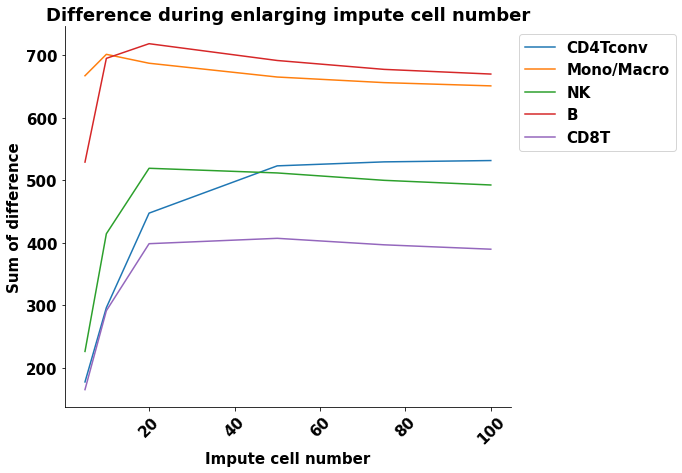

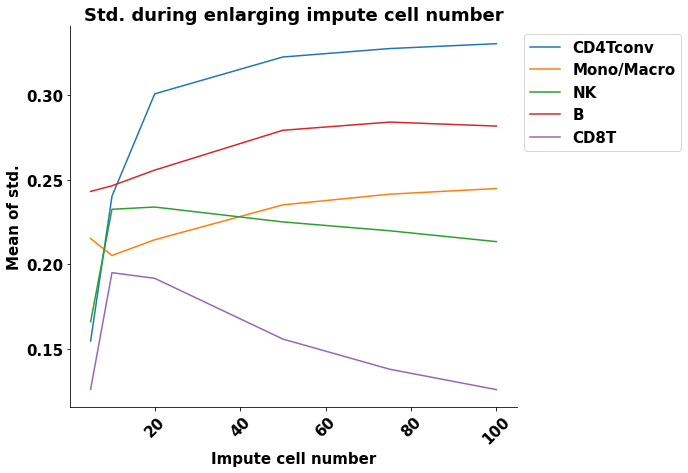

In [103]:
fig, ax = plt.subplots(figsize=(8,7))
sns.lineplot(data=result_frame, x="impute_number", y="difference_sum", hue='cell_type')
plt.xticks(rotation=45)
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.set_xlabel('Impute cell number')
ax.set_ylabel('Sum of difference')
ax.set_title('Difference during enlarging impute cell number')
fig.show()
fig, ax = plt.subplots(figsize=(8,7))
sns.lineplot(data=result_frame, x="impute_number", y="std.", hue='cell_type')
plt.xticks(rotation=45)
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.set_xlabel('Impute cell number')
ax.set_ylabel('Mean of std.')
ax.set_title('Std. during enlarging impute cell number')
fig.show()

----------
previous code

In [ ]:
CD4T_cluster = input_mat.loc[seurat_adata.obs[seurat_adata.obs['assign.celltype']=="CD4Tconv"].index,:]

In [194]:
CD4T_cluster.index

Index(['AAACGAAAGACACGGT', 'AAACGAAAGCTTTCCC', 'AAACGAAAGGCGTCCT',
       'AAACGAAAGTTTGGAA', 'AAACGAACAAACGACG', 'AAACGAATCCAACGCG',
       'AAACGAATCCATCTAT', 'AAACGAATCGGGACAA', 'AAACGAATCTGAACGT',
       'AAACTCGAGAAAGCAG',
       ...
       'TTTGGCCGTGACCAGA', 'TTTGGCCTCGCTCTAC', 'TTTGGTTAGTAATCAG',
       'TTTGGTTGTCAACAGG', 'TTTGGTTGTCGAGGAT', 'TTTGGTTGTCTGCGCA',
       'TTTGGTTGTTCTGAAC', 'TTTGGTTTCAGGCGCT', 'TTTGTGTGTGGCGCTT',
       'TTTGTGTTCGCGCTGA'],
      dtype='object', length=2201)

In [185]:
factor = 'STAT4'

In [195]:
cell_ch = pbmc_script_adata.uns['integrated_z'].loc[CD4T_cluster.index,:].sort_values(by='I_' + factor, ascending=False)['I_' + factor].index.to_list()[0]

In [196]:
cell_ch

'CCTGGGACAACCTCCT'

In [206]:
motif_pattern = get_motif_pattern_from_minimal('/mnt/Storage2/home/dongxin/Projects/motif/human_cisBP/meme/%s.meme' % factor)
result = pd.read_csv('example/10X_ATAC/temp/test/fg_chip_result/%s.txt' % cell_ch, sep='\t', index_col = False).sort_values('combo_score', ascending=False)
bulk_bed = result[[factor in i for i in result['#file']]]['#file'].to_list()[0]
# CGGACCATCCACACCT = pyranges.read_bed('10X_ATAC/temp/test/fg_bed/CGGACCATCCACACCT.bed.gz')
bulk_peak = pyranges.read_bed('/mnt/Storage/home/dongxin/Projects/scATAC/human/top10k/' + bulk_bed)
cell_peak = pyranges.from_dict(pd.DataFrame([i.split('_') for i in input_mat.index[input_mat.loc[:,cell_ch] >= 1]]).rename(columns={0:'Chromosome', 1:'Start', 2:'End'}))
cell_peak_ovlp_with_bluk = cell_peak.overlap(bulk_peak)

cell_peak_unique = cell_peak.overlap(bulk_peak, invert=True)
cell_peak_unique_motif = filter_motif_peaks(cell_peak_unique,motif_pattern)
tmp = pyranges.from_dict(pd.concat([cell_peak_unique_motif, cell_peak_ovlp_with_bluk.df]))

In [208]:
tmp.to_bed('example/10X_ATAC/temp/%s_%s.bed' % (factor, cell_ch))

In [210]:
os.system('python ~/Projects/cidc_chips/modules/scripts/targets_RegPotential_Version2.py -p example/10X_ATAC/temp/%s_%s.bed -a /mnt/Storage/home/dongxin/Storage2/Files/ref_files/hg38/hg38_refGene.bed -n example/10X_ATAC/temp/%s_%s_gene_score.txt' % (factor, cell_ch,factor, cell_ch))

0

In [153]:
peak = pd.concat([cell_peak_unique_motif, cell_peak_ovlp_with_bluk.df])

,Chromosome,Start,End
1,chr1,103525148,103526464
2,chr1,107940936,107941713
3,chr1,108041499,108042115
5,chr1,108561836,108562005
7,chr1,109041377,109042498
...,...,...,...
1003,chrX,47144364,47145706
1004,chrX,49155865,49156655
1005,chrX,54639307,54640093
1006,chrX,72572385,72573360


In [445]:
# result = read_SingleCellExperiment_rds('example/small_HSC/HSC_single_cell_experiment.rds')
result.write_h5ad('example/small_HSC/HSC_single_cell_experiment.h5ad')

In [451]:
result.obs

,orig.ident,nCount_ATAC,nFeature_ATAC,ATAC_snn_res.0.6,seurat_clusters,ident
singles-BM0828-CMP-frozen-1511,example/small_HSC/ATAC,1805.0,1805,0,0,0
BM1077-CMP-Frozen-160106-3,example/small_HSC/ATAC,3671.0,3671,0,0,0
singles-20160617-scATAC-BM1077,example/small_HSC/ATAC,8163.0,8163,1,1,1
singles-160818-BM1137-pDC-LS-7,example/small_HSC/ATAC,14085.0,14085,6,6,6
singles-20160617-scATAC-BM1077.1,example/small_HSC/ATAC,5320.0,5320,1,1,1
...,...,...,...,...,...,...
singles-BM1214-MCP-frozen-1601.95,example/small_HSC/ATAC,2393.0,2393,6,6,6
singles-20160726-scATAC-BM1214.89,example/small_HSC/ATAC,3425.0,3425,0,0,0
singles-20160726-scATAC-BM1214.90,example/small_HSC/ATAC,3184.0,3184,7,7,7
BM1077-GMP-Frozen-160107-61,example/small_HSC/ATAC,3402.0,3402,5,5,5


In [477]:
data = sc.read_10x_h5('example/small_HSC/GSE96772_HSC_merged_count.h5', gex_only=False )
data.obs_names_make_unique(join='.')

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [478]:
data.write_h5ad('example/small_HSC/GSE96772_HSC_merged_count.h5')

""
singles-BM0828-CMP-frozen-1511
BM1077-CMP-Frozen-160106-3
singles-20160617-scATAC-BM1077
singles-160818-BM1137-pDC-LS-7
singles-20160617-scATAC-BM1077.1
...
singles-BM1214-MCP-frozen-1601.95
singles-20160726-scATAC-BM1214.89
singles-20160726-scATAC-BM1214.90
BM1077-GMP-Frozen-160107-61


----
# test code

# Score normalization

In [128]:
def standardScaler(t):
    scaler = preprocessing.StandardScaler().fit(t)
    rt = pd.DataFrame(scaler.transform(t), index = t.index, columns = t.columns)
    return rt

def minmaxScaler(t, frange=(0,1)):
    scaler = preprocessing.MinMaxScaler(feature_range=frange).fit(t)
    rt = pd.DataFrame(scaler.transform(t), index = t.index, columns = t.columns)
    return rt

def l2norm(t):
    rt = preprocessing.normalize(t, norm='l2')
    rt = pd.DataFrame(rt, index = t.index, columns=t.columns)
    return rt

def plot_tf_distribution(t, tf_list):
    fig, ax = plt.subplots(1,tf_list.__len__(), figsize=(20,6))
    for i in range(tf_list.__len__()):
        sns.histplot(t[tf_list[i]], ax=ax[i])
    fig.show()

In [129]:
def generate_cluster_background_bed(adata, input_mat, bg_bed_path, map_dict_store_path, step=50, iteration=1000, peak_confidence=5, n_cores=8):
    for cluster in adata.obs['seurat_clusters'].cat.categories:
        bc = adata.obs[adata.obs['seurat_clusters'] == cluster].index
        cnt = int(np.round((bc.__len__()/adata.obs.shape[0])*iteration))
        input_mat_sub = input_mat[bc,:]

        map_dict = {}
        if not os.path.exists(bg_bed_path):
            os.makedirs(bg_bed_path)

        cl_name = input_mat_sub.obs_names.to_list()

        executor = ThreadPoolExecutor(max_workers=n_cores)
        all_task = []
        for i in range(0,cnt): 
            random.seed(i)
            map_dict[cluster+'_' + str(i)] = random.sample(cl_name, step)
            all_task.append(executor.submit(generate_beds, bg_bed_path + "/" + cluster + '_' + str(i) + ".bed", map_dict[cluster+'_' + str(i)], input_mat_sub, peak_confidence))
    wait(all_task, return_when=ALL_COMPLETED)
    with open(map_dict_store_path, "wb") as map_dict_file:
        pickle.dump(map_dict, map_dict_file)
    return map_dict

In [130]:
def generate_peak_list(cells, input_mat, peak_confidence=1):
    cell_above_cutoff_index = sc.pp.filter_genes(
        input_mat[cells, :], min_cells=peak_confidence, inplace=False)[0]
    peaks = input_mat.var_names[cell_above_cutoff_index].to_list()
    return peaks

def generate_beds(file_path, cells, input_mat, peak_confidence=1):
    peaks = generate_peak_list(cells, input_mat, peak_confidence)
    cell_barcode = os.path.basename(file_path)[:-4]# remove .bed
    if peaks.__len__() == 0:
        print_log('Warning: No peaks in {bed_path}, skip generation'.format(bed_path = file_path[:-4]))
    else:
        peaks = pd.DataFrame([p.rsplit("_", 2) for p in peaks])
        peaks.to_csv(file_path, sep="\t", header= None, index=None)
        cmd = 'sort --buffer-size 2G -k1,1 -k2,2n -k3,3n {bed_path} | bgzip -c > {bed_path}.gz\n'.format(bed_path=file_path)
        cmd += 'rm {bed_path}'.format(bed_path=file_path)
        subprocess.run(cmd, shell=True, check=True)
    return [cell_barcode, peaks.__len__()]

def map_factor_on_ChIP(table):
    ret_table = table.copy()
    # map factor by id "_"
    factor_index_list = []
    for i in ret_table.index:
        factor_name = i.split("_")
        factor_index_list.append(factor_name[0])
    ret_table.loc[:, "Factor"] = factor_index_list
    # group_table = ret_table.groupby("Factor")
    factor_table = ret_table.groupby("Factor").max()
    # max_index = group_table.idxmax()
    return factor_table

def get_factor_source(table):
    ret_table = table.copy()
    # map factor by id "_"
    factor_index_list = []
    for i in ret_table.index:
        factor_name = i.split("_")
        factor_index_list.append(factor_name[0])
    ret_table.loc[:, "Factor"] = factor_index_list
    # group_table = ret_table.groupby("Factor")
    # factor_table = group_table.max()
    max_index = ret_table.groupby("Factor").idxmax()
    return max_index

In [131]:
def search_seqpare(bed_path, result_path, index_path):
    cmd = 'seqpare "{index_path}/*.bed.gz" "{bed_path}" -m 1 -o {result_path}\n'.format(
        index_path=index_path, result_path=result_path, bed_path=bed_path)
    subprocess.run(cmd, shell=True, check=True)
def read_seqpare_result(files):
    for i in range(len(files)):
        giggle_result = os.path.basename(files[i])
        cell_bc = giggle_result[:-4]  # remove suffix '.txt'
        dtframe = pd.read_csv(files[i], sep="\t", index_col=5)
        if i == 0:
            dtframe = dtframe.loc[:, ['teo']].copy()
            dataset_cell_score_df = dtframe.rename(columns={'teo': cell_bc})
        else:
            dataset_cell_score_df[cell_bc] = dtframe.loc[:, "teo"]
    dataset_cell_score_df.index = [i.rsplit('/', 1)[1][:-7] for i in dataset_cell_score_df.index]  # remove suffix '.bed.gz'
    return dataset_cell_score_df
def cal_score(dataset_mbm_overlap_df, dataset_bg_peak_norm_df):
    intersect_frame = dataset_mbm_overlap_df.copy()
    peak_hyper_frame = dataset_bg_peak_norm_df.copy().reindex(index=intersect_frame.index, columns=intersect_frame.columns)
    fg_dataset_cell_raw_score_df = np.log2((intersect_frame+1)/(peak_hyper_frame+1))
    return fg_dataset_cell_raw_score_df

In [173]:
ChIP_table_mbm = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210918/enrichment/dataset_mbm_overlap_df.pk')
# ChIP_table_mbm = ChIP_table_mbm.reindex(index=affinity.index)
ChIP_table_hyper_bg = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210918/enrichment/dataset_bg_peak_norm_df.pk').reindex(columns = ChIP_table_mbm.columns, index=ChIP_table_mbm.index)
ChIP_table_score = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210918/enrichment/dataset_raw_score_df.pk')
ChIP_table_res = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210811/enrichment/dataset_score_df.pk')

In [780]:
# ChIP_table_mbm_new = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210823/enrichment/dataset_mbm_overlap_df.pk')
# # ChIP_table_mbm_new = ChIP_table_mbm.reindex(index=affinity.index)
# ChIP_table_hyper_bg_new = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210823/enrichment/dataset_bg_peak_norm_df.pk').reindex(columns = ChIP_table_mbm.columns, index=ChIP_table_mbm.index)
# ChIP_table_score_new = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210824/enrichment/dataset_score_df.pk')

In [706]:
ChIP_table_score_test1 = cal_score(ChIP_table_mbm_new, ChIP_table_hyper_bg_new)

In [711]:
tf_cell_table_test1 = map_factor_on_ChIP(ChIP_table_score_test1)

In [134]:
ChIP_table_score

,TGGTCTATCATGGTTT,TATCCGGGTGGGTAAC,GAACTTAAGATTCGTT,AGTAACGGTATAGTGG,AGTAATCCAGCTACCC,GAGAGGAGTTTATTCC,GGGATAAAGTGAGGAA,TTTGCTGAGTATCGCC,CACTTCAAGATATTGG,GTATTGTTCCCGGAAA,...,AATGGCCCAGTAATCG,AAGAATCGTAAACCGA,GGCGCTTGTCATCACG,CGTAACCTCGTCCTTT,AAGAATCGTTAGCTCG,CCAACTGGTCCTTGAG,TCCGGTTAGCTTTAAC,GAAGTCAGTTACTCCC,ATTTCGCCACCACAAA,GATTACGCATGACAAT
ADNP_63581,1.596229,1.593871,1.611715,1.561722,1.606046,1.553150,1.322543,1.195909,1.569471,1.254457,...,1.470817,1.060673,1.225054,1.382010,1.518059,1.559624,1.234934,1.667450,1.302637,1.599391
ADNP_63582,1.494545,1.612601,1.593965,1.525978,1.630442,1.548175,1.214829,1.205317,1.544658,1.266578,...,1.544836,1.004905,1.205576,1.379605,1.475749,1.475661,1.182781,1.651289,1.280070,1.543666
AFF1_34966,2.060228,1.994068,2.051603,2.073175,1.811732,2.136016,1.739399,1.488581,2.049836,1.554748,...,2.107254,1.237150,1.640390,1.993257,2.007092,2.024938,1.666141,2.051496,1.731524,1.996085
AFF1_72089,2.426827,2.503028,2.589973,2.481700,2.439593,2.522593,2.198755,2.018039,2.523783,1.952177,...,2.490747,1.711505,2.109947,2.352666,2.541795,2.459179,2.082400,2.478074,2.075105,2.472079
AFF1_73709,2.160095,2.190540,2.376440,2.352217,2.060770,2.270613,1.614217,1.874526,2.292538,1.765988,...,2.317006,1.608531,1.894907,2.191798,2.302069,2.249353,1.832524,2.251503,1.896153,2.178113
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSCAN5A_63376,2.201918,2.333841,2.405681,2.204223,2.341756,2.235722,2.034655,1.822001,2.251524,1.845593,...,2.333075,1.562295,1.749406,2.100979,2.258062,2.246922,1.797370,2.232125,1.845589,2.243115
ZSCAN5A_63377,2.186178,2.269621,2.443014,2.227772,2.327510,2.158038,1.929693,1.804677,2.237533,1.817620,...,2.095674,1.558187,1.742202,2.129720,2.211074,2.071944,1.811848,2.237995,1.876710,2.264862
ZXDB_63902,2.217127,2.279372,2.370439,2.266661,2.294858,2.242404,2.071667,1.821262,2.292548,1.848558,...,2.303945,1.586772,1.909226,2.056916,2.286468,2.209888,1.851949,2.276393,1.809146,2.279210
ZXDB_63903,2.221559,2.284809,2.364964,2.268528,2.309426,2.260354,2.049330,1.807755,2.305683,1.846285,...,2.277598,1.611567,1.902554,2.061183,2.299751,2.222590,1.854813,2.279509,1.807052,2.287960


In [139]:
def score_normalization(data_cell_frame):
    tf_cell_table = map_factor_on_ChIP(data_cell_frame)
    tf_cell_frame_zscore = standardScaler(tf_cell_table)
#     tf_cell_frame_score = (tf_cell_frame_zscore.T - tf_cell_frame_zscore.mean(1)).T
    # tf_cell_frame_zscore = tf_cell_table.apply(scipy.stats.zscore, axis=1)
    # tf_cell_frame_zscore = tf_cell_frame_zscore.apply(scipy.stats.zscore, axis=0)
    return tf_cell_frame_zscore

In [141]:
tmp = score_normalization(ChIP_table_score)

In [157]:
tmp1 = minmaxScaler(tmp, (-1,1))

In [161]:
tmp1

,TGGTCTATCATGGTTT,TATCCGGGTGGGTAAC,GAACTTAAGATTCGTT,AGTAACGGTATAGTGG,AGTAATCCAGCTACCC,GAGAGGAGTTTATTCC,GGGATAAAGTGAGGAA,TTTGCTGAGTATCGCC,CACTTCAAGATATTGG,GTATTGTTCCCGGAAA,...,AATGGCCCAGTAATCG,AAGAATCGTAAACCGA,GGCGCTTGTCATCACG,CGTAACCTCGTCCTTT,AAGAATCGTTAGCTCG,CCAACTGGTCCTTGAG,TCCGGTTAGCTTTAAC,GAAGTCAGTTACTCCC,ATTTCGCCACCACAAA,GATTACGCATGACAAT
Factor,,,,,,,,,,,,,,,,,,,,,
ADNP,0.422746,0.427540,0.312786,0.325924,0.389488,0.346432,0.175244,0.199900,0.331609,0.185082,...,0.341336,0.204624,0.183760,0.322271,0.423081,0.331074,0.215484,0.435475,0.253399,0.354779
AFF1,0.791220,0.838581,0.772932,0.780872,0.789453,0.824136,0.637294,0.717494,0.783050,0.631717,...,0.767582,0.730923,0.717067,0.859441,0.864915,0.781768,0.728758,0.806374,0.756850,0.772383
AFF4,0.831796,0.874091,0.824249,0.820021,0.839691,0.863353,0.690691,0.743994,0.827607,0.717015,...,0.800010,0.708367,0.748334,0.833418,0.869925,0.821646,0.753740,0.846327,0.747865,0.832881
AGO1,0.633361,0.681779,0.606706,0.622413,0.633145,0.635196,0.466119,0.520332,0.608949,0.447521,...,0.610630,0.463576,0.530996,0.627507,0.707088,0.603893,0.500991,0.662567,0.503843,0.614863
AHR,0.105566,0.135672,0.000793,0.058706,0.093869,0.070500,-0.109100,-0.033743,0.060990,-0.097353,...,0.000091,-0.069741,-0.017391,-0.007258,0.186013,-0.013839,-0.019662,0.074783,-0.097719,0.035243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSCAN23,0.516987,0.598714,0.539437,0.469205,0.547502,0.468532,0.391992,0.392996,0.541144,0.344498,...,0.505015,0.426363,0.379238,0.482313,0.575968,0.445735,0.335767,0.544093,0.441971,0.546662
ZSCAN29,0.539462,0.529132,0.495347,0.485339,0.525605,0.500592,0.373101,0.384468,0.486929,0.361202,...,0.485614,0.457986,0.361224,0.502207,0.584163,0.450663,0.342022,0.537569,0.404861,0.485326
ZSCAN5A,0.691445,0.760480,0.703806,0.655299,0.726160,0.682777,0.545097,0.589619,0.654257,0.540579,...,0.692325,0.573671,0.499777,0.736060,0.742459,0.675423,0.564896,0.696527,0.627547,0.670741


In [200]:
ref_number = pd.read_csv('../../indices/human/tf_chip_qc_1_10k/peaks_number.txt', sep='\t', index_col=0, header=None)
cell_number = pd.read_csv('example/PBMC/multiome_pbmc_SCRIPT_20210819/enrichment/peaks_number.txt', sep='\t', index_col=0, header=None)

In [125]:
affinity = all_peak_result['all_peak_result']/(ref_number[1]*141535/926535)

In [550]:
def get_affinity(input_mat, bed_file_path, reference, ccre_number):
    peaks = input_mat.var_names.to_list()
    peaks_number = peaks.__len__()
    ref_number = pd.read_csv(reference + '/peaks_number.txt', sep='\t', index_col=0, header=None)

    peaks = pd.DataFrame([p.rsplit("_", 2) for p in peaks])
    peaks.to_csv(bed_file_path, sep="\t", header=None, index=None)
    cmd = 'sort --buffer-size 2G -k1,1 -k2,2n -k3,3n {bed_path} | bgzip -c > {bed_path}.gz\n'.format(bed_path=bed_file_path)
    cmd += 'rm {bed_path}'.format(bed_path=bed_file_path)
    subprocess.run(cmd, shell=True, check=True)

    search_seqpare(bed_file_path + '.gz', bed_file_path[0:-4] + '.txt', reference)
    all_peak_result = read_seqpare_result([bed_file_path[0:-4] + '.txt'])
    affinity = all_peak_result['all_peaks']/(ref_number[1]*peaks_number/ccre_number)
    return affinity

In [551]:
affinity = get_affinity(atac_peakcount, '/fs/home/dongxin/Projects/SCRIPT/scATAC/example/PBMC/multiome_pbmc_SCRIPT_20210811/enrichment/all_peaks.bed', '/fs/home/dongxin/Projects/SCRIPT/indices/human/tf_chip_qc_1_10k', 926535)

In [552]:
affinity

ADNP_63581       0.945881
ADNP_63582       0.989173
AFF1_34966       2.019100
AFF1_72089       1.333468
AFF1_73709       1.976503
                   ...   
ZSCAN5A_63376    1.736669
ZSCAN5A_63377    1.475975
ZXDB_63902       2.598526
ZXDB_63903       2.432318
ZXDC_77256       0.849956
Length: 3630, dtype: float64

In [570]:
ChIP_table_hyper_bg_norm = (ChIP_table_hyper_bg.T * affinity).T
ChIP_table_score = np.log2((ChIP_table_mbm+1)/(ChIP_table_hyper_bg_norm+1))
tf_cell_table = map_factor_on_ChIP(ChIP_table_score)
data_cell_frame_zscore = tf_cell_table.apply(scipy.stats.zscore, axis=1)
data_cell_frame_zscore = data_cell_frame_zscore.apply(scipy.stats.zscore, axis=0)

In [ ]:
ChIP_table_mbm.loc['SMARCA2_83717',:].sort_values()

In [ ]:
ChIP_table_hyper_bg_norm.loc['SMARCA2_83717',:].sort_values()

In [697]:
result = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210823/enrichment/dataset_score_df.pk')

In [ ]:
result.std(1).sort_values(ascending=False)[0:50]

In [753]:
plot_table = pd.DataFrame(tmp.std(1).sort_values(ascending=False))
plot_table[1] = [i for i in range(1,708)]
plot_table

,0,1
Factor,,
GRIP1,1.233551,1
HES2,0.926570,2
NFE2L1,0.749648,3
PGR,0.719242,4
LMO1,0.667362,5
...,...,...
XRN2,0.029962,703
H2AZ,0.029901,704
THAP1,0.029804,705


In [782]:
ChIP_table_score_new.std(1).sort_values(ascending=False)[0:50]

Factor
GRIP1      1.233551
HES2       0.926570
NFE2L1     0.749648
PGR        0.719242
LMO1       0.667362
RXRG       0.534606
MAFG       0.523109
TLX1       0.521092
SMARCA2    0.486807
ARID1A     0.460273
SKI        0.453069
FOXO1      0.440275
PHOX2B     0.438369
BATF3      0.437179
CEBPG      0.435507
ZNF654     0.420760
HNF1B      0.418539
MAFF       0.388889
ZBTB2      0.384147
CTNNB1     0.381578
HOXA9      0.371800
NCOR1      0.370830
NFIL3      0.365235
SMC3       0.355165
HLF        0.352021
EBNA3C     0.343763
LYL1       0.341570
HAND2      0.341500
ESCO2      0.335669
POLR3D     0.332916
IRF9       0.327652
PTRF       0.318199
SOX10      0.316813
KDM6A      0.314624
DRAP1      0.311983
H2AFX      0.306811
PTTG1      0.300276
NR1H3      0.300157
FOSL1      0.297265
TOP1       0.296885
CHD5       0.294833
NR4A1      0.291660
TRIM22     0.291645
TBX21      0.272778
MEIS1      0.271248
MEF2B      0.266516
TLE3       0.266021
PRDM6      0.265806
EOMES      0.264070
DEK        0.

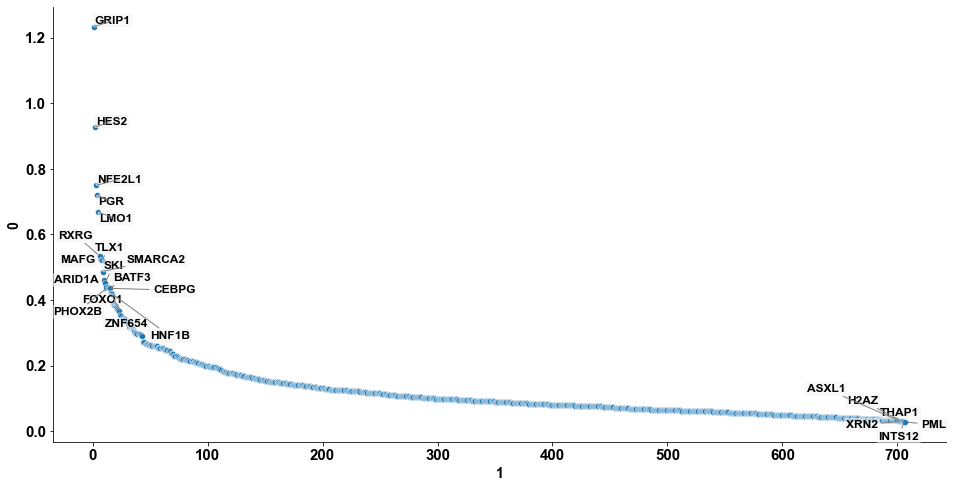

In [765]:
fig, ax = plt.subplots(1,1,figsize=(16,8))
sns.scatterplot(x=plot_table[1], y=plot_table[0])
# sns.scatterplot(data=data, y='ChromVAR', x='SCRIPT', hue='expression', palette='RdBu_r', ax=ax, legend=False)
# ax.set_title('%s Cell' % cell)
texts = []
for i in range(len(plot_table.index)):
    if plot_table.iloc[i,0] > 0.4:
        texts.append(plt.text(plot_table.iloc[i,1], plot_table.iloc[i,0], plot_table.index[i], size=12, 
                              bbox={'facecolor': '#F2F2F2', 
                                    'edgecolor': '#F2F2F2',
                                    'alpha': 0.5,
                                    'pad': 0.1,
                                    'boxstyle':'round'
                                    }))
    if plot_table.iloc[i,0] < 0.031:
        texts.append(plt.text(plot_table.iloc[i,1], plot_table.iloc[i,0], plot_table.index[i], size=12, 
                              bbox={'facecolor': '#F2F2F2', 
                                    'edgecolor': '#F2F2F2',
                                    'alpha': 0.5,
                                    'pad': 0.1,
                                    'boxstyle':'round'
                                    }))
adjust_text(texts, arrowprops=dict(arrowstyle='-', color='grey'))
fig.show()

In [ ]:
data_cell_frame_zscore.std(1).sort_values()[-50:]

In [ ]:
sns.displot(result.loc['GRIP1',:])

In [ ]:
sns.displot(data_cell_frame_zscore.loc['EBF1',:])

In [ ]:
sns.displot(data_cell_frame_zscore.loc['EBF1',:])

In [ ]:
sns.displot(data_cell_frame_zscore.loc[:,"TGGTCTATCATGGTTT"])

In [ ]:
sns.displot(result.loc[:,"TGGTCTATCATGGTTT"])

In [581]:
result.std(1).sort_values()

Factor
PML      0.373637
E2F3     0.373922
NPAT     0.374623
THAP1    0.375246
TAF1     0.375521
           ...   
PGR      2.691557
HES2     2.697012
HOXA9    2.706487
MEIS1    2.712481
GRIP1    2.829960
Length: 707, dtype: float64

In [ ]:
index_ovlp

In [168]:
index_ovlp = set(metadata.index).intersection(tmp1.T.index)

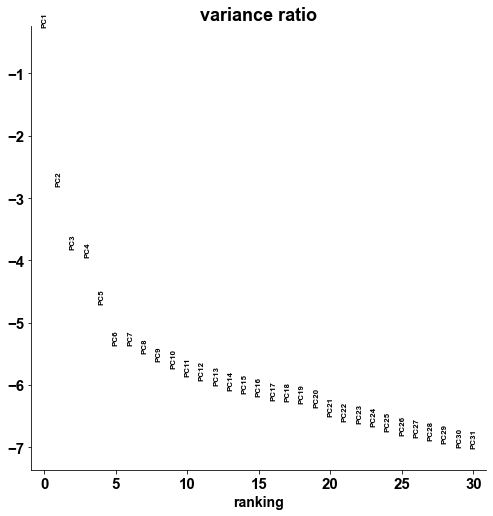

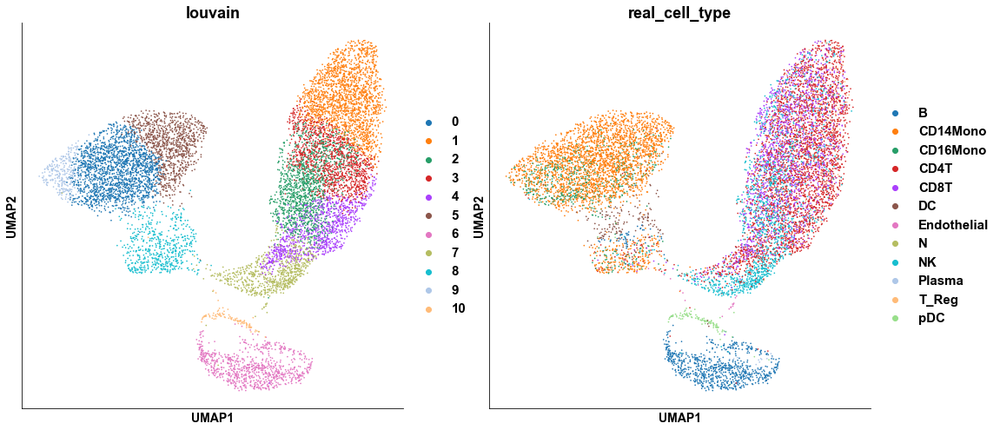

0.49069359967617787
0.4894830564367115


In [175]:
test1 = umap_table(tmp1.T.loc[index_ovlp,:], metadata.loc[index_ovlp,:])

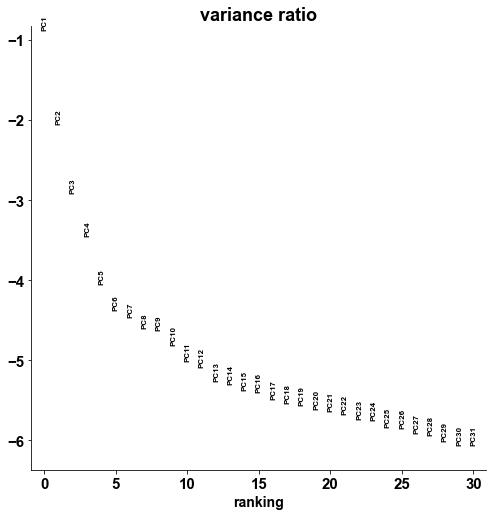

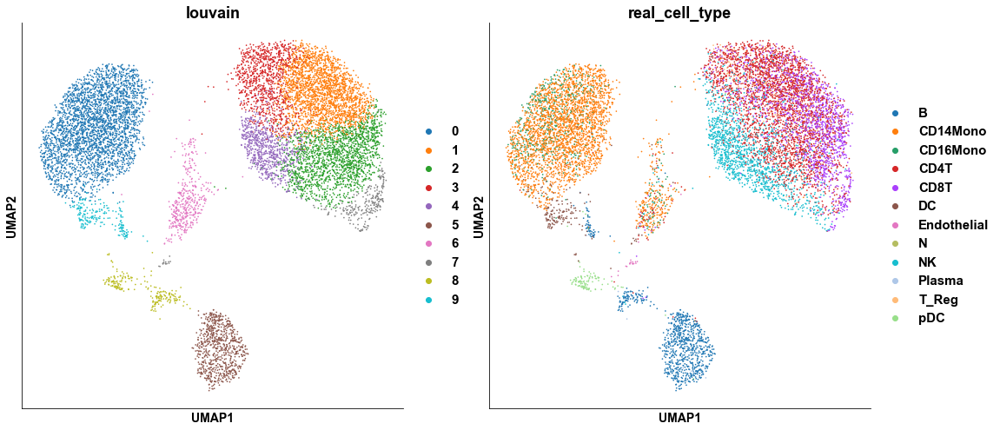

0.5492233627148729
0.5481868666425996


In [174]:
test = umap_table(ChIP_table_res.T.loc[index_ovlp,:], metadata.loc[index_ovlp,:])

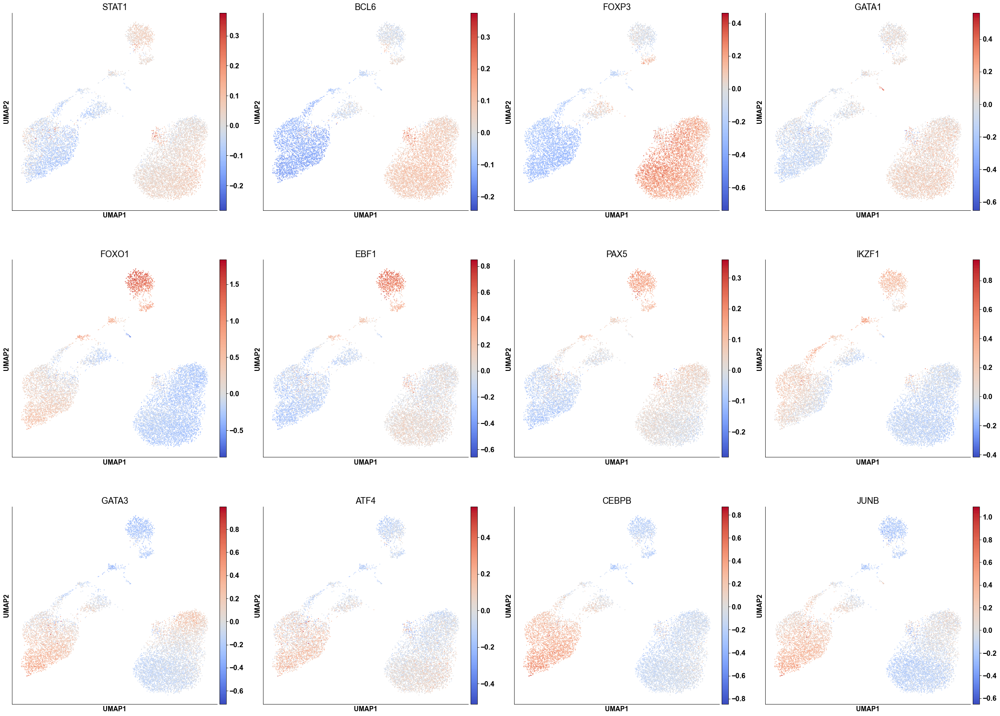

In [752]:
sc.pl.umap(test, color=['STAT1', 'BCL6', 'FOXP3', 'GATA1', 'FOXO1', 'EBF1', 'PAX5', 'IKZF1', 'GATA3', 'ATF4','CEBPB', 'JUNB'], color_map='coolwarm', vcenter=0)

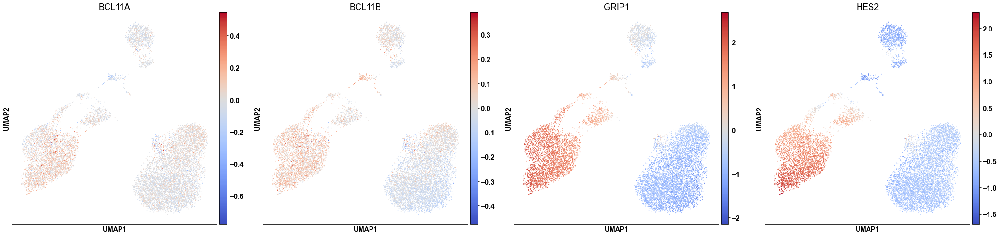

In [768]:
sc.pl.umap(test, color=['BCL11A', 'BCL11B', 'GRIP1', 'HES2'], color_map='coolwarm', vcenter=0)

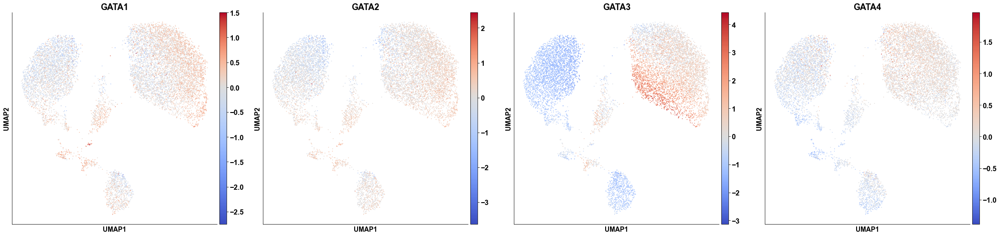

In [176]:
sc.pl.umap(test, color=['GATA1', 'GATA2', 'GATA3', 'GATA4'], color_map='coolwarm', vcenter=0)

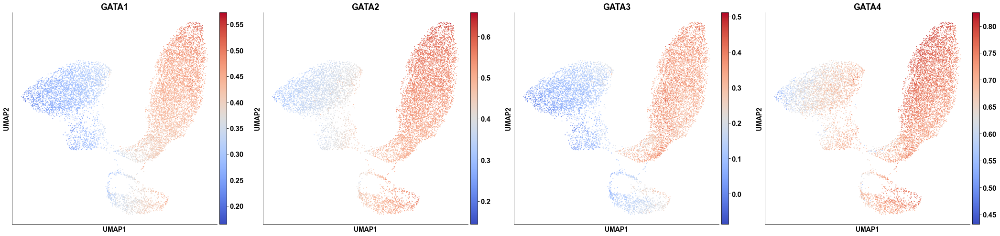

In [178]:
sc.pl.umap(test1, color=['GATA1', 'GATA2', 'GATA3', 'GATA4'], color_map='coolwarm')

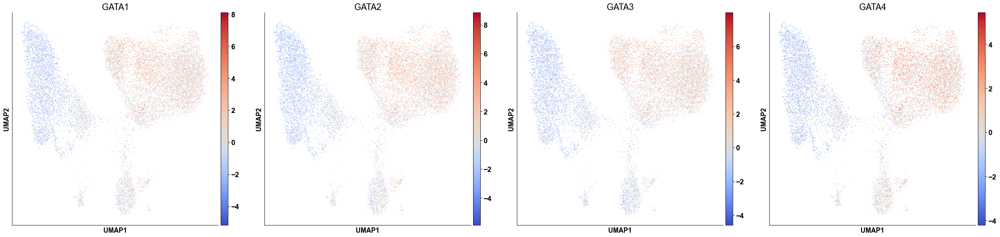

In [775]:
sc.pl.umap(sudo_expression_chromVAR, color=['GATA1', 'GATA2', 'GATA3', 'GATA4'], color_map='coolwarm', vcenter=0)

In [210]:
factor = 'BCL3_46130'

all_peak_result['all_peak_result'][factor]

ref_number[1][factor]

(ref_number[1]*141535/926535)[factor]

affinity[factor]

ChIP_table_mbm.loc[factor,:].mean()

ChIP_table_hyper_bg.loc[factor,:].mean()

In [444]:
affinity

ADNP_63581       0.945881
ADNP_63582       0.989173
AFF1_34966       2.019100
AFF1_72089       1.333468
AFF1_73709       1.976503
                   ...   
ZSCAN5A_63376    1.736669
ZSCAN5A_63377    1.475975
ZXDB_63902       2.598526
ZXDB_63903       2.432318
ZXDC_77256       0.849956
Length: 3630, dtype: float64

In [243]:
factor_table_mbm = map_factor_on_ChIP(ChIP_table_mbm)

In [248]:
factor_source_mem = get_factor_source(ChIP_table_mbm)

In [240]:
ChIP_table_hyper_bg_norm = (ChIP_table_hyper_bg.T*affinity).T

In [314]:
factor_source_mem

,TGGTCTATCATGGTTT,TATCCGGGTGGGTAAC,GAACTTAAGATTCGTT,AGTAACGGTATAGTGG,AGTAATCCAGCTACCC,GAGAGGAGTTTATTCC,GGGATAAAGTGAGGAA,TTTGCTGAGTATCGCC,CACTTCAAGATATTGG,GTATTGTTCCCGGAAA,...,AATGGCCCAGTAATCG,AAGAATCGTAAACCGA,GGCGCTTGTCATCACG,CGTAACCTCGTCCTTT,AAGAATCGTTAGCTCG,CCAACTGGTCCTTGAG,TCCGGTTAGCTTTAAC,GAAGTCAGTTACTCCC,ATTTCGCCACCACAAA,GATTACGCATGACAAT
Factor,,,,,,,,,,,,,,,,,,,,,
ADNP,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,...,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582,ADNP_63582
AFF1,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,...,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713,AFF1_73713
AFF4,AFF4_48994,AFF4_48994,AFF4_69873,AFF4_48994,AFF4_48994,AFF4_48994,AFF4_48994,AFF4_48994,AFF4_48994,AFF4_48994,...,AFF4_69873,AFF4_48994,AFF4_48994,AFF4_48994,AFF4_48994,AFF4_48994,AFF4_48994,AFF4_48994,AFF4_48994,AFF4_48994
AGO1,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,...,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026,AGO1_44026
AHR,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,...,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157,AHR_86157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSCAN23,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,...,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289,ZSCAN23_64289
ZSCAN29,ZSCAN29_62920,ZSCAN29_62920,ZSCAN29_62920,ZSCAN29_62920,ZSCAN29_62920,ZSCAN29_62920,ZSCAN29_62920,ZSCAN29_62920,ZSCAN29_62920,ZSCAN29_62920,...,ZSCAN29_62920,ZSCAN29_62920,ZSCAN29_62920,ZSCAN29_62920,ZSCAN29_62920,ZSCAN29_62920,ZSCAN29_62920,ZSCAN29_62920,ZSCAN29_62920,ZSCAN29_62920
ZSCAN5A,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,...,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376,ZSCAN5A_63376


In [327]:
def get_background(table, source):
    ret = source.copy()
    for i in ret.index:
        ret.loc[i,:] = np.diagonal(table.loc[source.loc[i,:],table.columns])
        print(i)
    return ret

In [328]:
tmp = get_background(tf_logfc,factor_source_mem )

ADNP
AFF1
AFF4
AGO1
AHR
AP4
APOBEC3B
AR
ARID1A
ARID2
ARID3A
ARID5B
ARNT
ARNTL
ARRB1
ASCL1
ASH2L
ASXL1
ATF1
ATF2
ATF3
ATF4
AUTS2
BACH1
BACH2
BANF1
BARX1
BARX2
BATF
BATF3
BCL11A
BCL11B
BCL3
BCL6
BCLAF1
BCOR
BHLHE40
BIRA
BMI1
BPTF
BRCA1
BRD1
BRD2
BRD3
BRD4
BRD7
BRD9
BRPF3
C11orf30
C17orf49
CAMTA2
CBFB
CBX1
CBX3
CBX5
CCND2
CCNT2
CD74
CDC5L
CDK12
CDK6
CDK7
CDK8
CDK9
CDX2
CEBPA
CEBPB
CEBPD
CEBPG
CHAMP1
CHD1
CHD2
CHD4
CHD5
CHD7
CHD8
CLOCK
CNOT3
CPSF3L
CREB1
CREB3
CREBBP
CREM
CSDE1
CSNK2A1
CTBP1
CTBP2
CTCF
CTCFL
CTNNB1
CUX1
DAXX
DCP1A
DDX20
DDX21
DDX5
DEAF1
DEK
DIDO1
DLX1
DNMT1
DNMT3A
DNMT3B
DPF1
DPF2
DRAP1
E2F1
E2F2
E2F3
E2F4
E2F5
E2F6
E2F7
E2F8
EBF1
EBF3
EBNA2
EBNA3C
EED
EGLN2
EGR1
EGR2
EGR3
EHMT2
ELF1
ELF3
ELK1
ELK3
ELK4
ELL2
EMSY
EMX1
EOMES
EP300
EP400
EPC1
ERCC2
ERCC3
ERCC6
ERF
ERG
ESCO2
ESR1
ESR2
ESRRA
ETS1
ETS2
ETV1
ETV4
ETV5
ETV6
ETV7
EWSR1
EZH1
EZH2
FAM208A
FEZF1
FGFR1
FLI1
FOS
FOSL1
FOSL2
FOXA1
FOXA2
FOXD2
FOXH1
FOXJ2
FOXK1
FOXK2
FOXM1
FOXO1
FOXO3
FOXP1
FOXP3
FUS
FXR2
GABP
GABPA
GATA

In [402]:
tmp

,TGGTCTATCATGGTTT,TATCCGGGTGGGTAAC,GAACTTAAGATTCGTT,AGTAACGGTATAGTGG,AGTAATCCAGCTACCC,GAGAGGAGTTTATTCC,GGGATAAAGTGAGGAA,TTTGCTGAGTATCGCC,CACTTCAAGATATTGG,GTATTGTTCCCGGAAA,...,AATGGCCCAGTAATCG,AAGAATCGTAAACCGA,GGCGCTTGTCATCACG,CGTAACCTCGTCCTTT,AAGAATCGTTAGCTCG,CCAACTGGTCCTTGAG,TCCGGTTAGCTTTAAC,GAAGTCAGTTACTCCC,ATTTCGCCACCACAAA,GATTACGCATGACAAT
Factor,,,,,,,,,,,,,,,,,,,,,
ADNP,1.905075,1.932538,1.911285,1.855905,1.976613,1.892438,1.634719,1.533501,1.870641,1.602387,...,1.828758,1.360792,1.572554,1.689046,1.814134,1.862290,1.531928,1.976597,1.645406,1.903187
AFF1,2.913427,2.960156,3.087524,2.955013,2.992463,2.949471,2.713588,2.488474,2.979591,2.459332,...,3.013375,2.241390,2.569957,2.753114,2.977278,2.970768,2.561334,2.986651,2.483190,2.964718
AFF4,2.953396,3.013881,3.145116,2.999702,3.023613,3.040429,2.756004,2.508836,3.057338,2.571688,...,3.018230,2.182360,2.598099,2.743039,2.995137,2.985289,2.581031,3.016662,2.506673,3.043609
AGO1,2.421570,2.512906,2.558504,2.487037,2.442111,2.481952,2.185063,2.018812,2.463059,2.026312,...,2.462388,1.745350,2.092308,2.264634,2.524143,2.436537,2.045346,2.506761,2.034129,2.482558
AHR,0.800319,0.868953,0.675075,0.705590,0.829479,0.909988,0.416177,0.779250,0.905580,0.854748,...,0.723157,0.747522,0.802323,0.695431,0.844107,0.719244,0.783300,0.833924,0.850732,0.878092
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSCAN23,1.939300,2.114229,2.222819,1.982133,2.064742,1.931676,1.819558,1.641997,2.102449,1.657378,...,2.036980,1.492345,1.639133,1.803068,2.003250,1.918718,1.563741,2.035572,1.723802,2.133857
ZSCAN29,2.125680,2.099231,2.264671,2.150482,2.179898,2.132466,1.956525,1.764266,2.163757,1.820350,...,2.128431,1.671013,1.785108,1.974841,2.157985,2.064237,1.709748,2.157040,1.802684,2.140364
ZSCAN5A,2.404316,2.536445,2.606497,2.406664,2.539506,2.438235,2.223405,2.024959,2.453501,2.048577,...,2.528473,1.764282,1.951013,2.304771,2.460817,2.448868,1.999281,2.434629,2.049341,2.445162


In [401]:
tmp = map_factor_on_ChIP(tf_logfc)

In [275]:
(ChIP_table_mbm/ChIP_table_hyper_bg_norm).loc['GATA6_51478',:].sort_values()

ACAACATCAGGTTTCT    0.000000
CAGCTTATCCATTACG    0.000000
TAATGCAAGGATGCGC    0.000000
GATTGCCTCCTCTACT    0.000000
CGGGCTACAGGTATTG    0.000000
                      ...   
ATAATCGAGGATGCGC    4.041994
TCATCAGTCCAATACT    4.125616
TATACCTAGTCCTCCC    4.190271
GGTCAACCAGGCAACT    5.019180
TTGATCAGTGCTCATG    5.081295
Name: GATA6_51478, Length: 11162, dtype: float64

In [307]:
tf_logfc = np.log2((ChIP_table_mbm+1)/(ChIP_table_hyper_bg_norm+1))

In [400]:
tf_logfc

,TGGTCTATCATGGTTT,TATCCGGGTGGGTAAC,GAACTTAAGATTCGTT,AGTAACGGTATAGTGG,AGTAATCCAGCTACCC,GAGAGGAGTTTATTCC,GGGATAAAGTGAGGAA,TTTGCTGAGTATCGCC,CACTTCAAGATATTGG,GTATTGTTCCCGGAAA,...,AATGGCCCAGTAATCG,AAGAATCGTAAACCGA,GGCGCTTGTCATCACG,CGTAACCTCGTCCTTT,AAGAATCGTTAGCTCG,CCAACTGGTCCTTGAG,TCCGGTTAGCTTTAAC,GAAGTCAGTTACTCCC,ATTTCGCCACCACAAA,GATTACGCATGACAAT
ADNP_63581,1.905075,1.898961,1.911285,1.854589,1.911825,1.848230,1.613553,1.504513,1.870641,1.548899,...,1.785955,1.360792,1.530763,1.689046,1.814134,1.862290,1.531928,1.972764,1.602983,1.903187
ADNP_63582,1.842545,1.932538,1.899285,1.855905,1.976613,1.892438,1.634719,1.533501,1.864316,1.602387,...,1.828758,1.321432,1.572554,1.686764,1.811861,1.811782,1.529794,1.976597,1.645406,1.873833
AFF1_34966,2.349871,2.284171,2.337757,2.362915,2.091203,2.425916,1.999883,1.779468,2.338548,1.845692,...,2.381675,1.525884,1.928284,2.286002,2.297527,2.313581,1.954706,2.341375,2.024179,2.284953
AFF1_72089,2.760159,2.836555,2.921813,2.815073,2.768509,2.856034,2.518866,2.351899,2.856720,2.286060,...,2.817394,2.044451,2.442534,2.687307,2.875463,2.792086,2.415273,2.811506,2.409708,2.805082
AFF1_73709,2.410407,2.441244,2.623772,2.602612,2.302391,2.521144,1.839596,2.125901,2.542056,2.017411,...,2.554310,1.858068,2.143726,2.444760,2.553057,2.498811,2.081916,2.502017,2.149037,2.427763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSCAN5A_63376,2.404316,2.536445,2.606497,2.406664,2.539506,2.438235,2.223405,2.024959,2.453501,2.048577,...,2.528473,1.764282,1.951013,2.304771,2.460817,2.448868,1.999281,2.434629,2.049341,2.445162
ZSCAN5A_63377,2.303128,2.386757,2.558548,2.344761,2.440332,2.275093,2.034811,1.922132,2.354106,1.935098,...,2.206446,1.674768,1.858442,2.247929,2.328346,2.188487,1.928361,2.355041,1.994883,2.381497
ZXDB_63902,2.632424,2.707748,2.797477,2.681118,2.723787,2.673804,2.445122,2.202431,2.713567,2.268654,...,2.697763,1.983498,2.331342,2.475551,2.726421,2.615743,2.275536,2.691489,2.213310,2.709481
ZXDB_63903,2.624642,2.709489,2.784610,2.683475,2.699060,2.663453,2.479576,2.207530,2.705700,2.256264,...,2.680028,1.987459,2.317465,2.461646,2.710584,2.643016,2.261741,2.686543,2.201327,2.688753


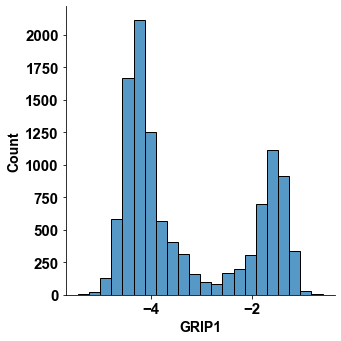

In [730]:
sns.displot(tmp.loc['GRIP1',:])

In [346]:
tmp.loc['SMAD1',:].mean()

1.9396738814153456

In [404]:
tmp.std(1).sort_values(ascending=False)[0:50]

Factor
GRIP1      0.931007
HES2       0.671333
NFE2L1     0.597640
PGR        0.558468
LMO1       0.427554
MAFG       0.405395
TLX1       0.370200
SMARCA2    0.369229
BATF3      0.363691
HNF1B      0.342700
ARID1A     0.333967
PHOX2B     0.312638
FOXP3      0.304890
FOXO1      0.302251
MAFF       0.300763
RXRG       0.297090
HOXA9      0.296902
KDM6A      0.284797
ARID5B     0.282471
SKI        0.273342
CREBBP     0.270651
MYB        0.267830
MORC2      0.265424
CEBPG      0.260052
HDAC1      0.258248
POLR3A     0.253066
HAND2      0.252899
SOX10      0.248380
CDK12      0.247710
EBNA3C     0.247688
BCL6       0.247343
NOTCH1     0.245003
GUCY1B3    0.240633
THAP11     0.240029
CHD5       0.238876
RBPJ       0.237139
HLF        0.236223
LYL1       0.235582
EHMT2      0.235420
SP140      0.232379
ZNF547     0.231899
NFIL3      0.231772
SNAI2      0.231656
MAF        0.230863
NCOR1      0.230147
KDM2B      0.229646
CTNNB1     0.228743
GLI4       0.228108
RAG2       0.227850
H2AFX      0.

In [353]:
tmp.std(1)['BARX2']

0.21390974588559403

In [358]:
tmp

,TGGTCTATCATGGTTT,TATCCGGGTGGGTAAC,GAACTTAAGATTCGTT,AGTAACGGTATAGTGG,AGTAATCCAGCTACCC,GAGAGGAGTTTATTCC,GGGATAAAGTGAGGAA,TTTGCTGAGTATCGCC,CACTTCAAGATATTGG,GTATTGTTCCCGGAAA,...,AATGGCCCAGTAATCG,AAGAATCGTAAACCGA,GGCGCTTGTCATCACG,CGTAACCTCGTCCTTT,AAGAATCGTTAGCTCG,CCAACTGGTCCTTGAG,TCCGGTTAGCTTTAAC,GAAGTCAGTTACTCCC,ATTTCGCCACCACAAA,GATTACGCATGACAAT
Factor,,,,,,,,,,,,,,,,,,,,,
ADNP,1.842545,1.932538,1.899285,1.855905,1.976613,1.892438,1.634719,1.533501,1.864316,1.602387,...,1.828758,1.321432,1.572554,1.686764,1.811861,1.811782,1.529794,1.976597,1.645406,1.873833
AFF1,2.913427,2.960156,3.087524,2.955013,2.992463,2.949471,2.713588,2.488474,2.979591,2.459332,...,3.013375,2.24139,2.569957,2.753114,2.977278,2.970768,2.561334,2.986651,2.48319,2.964718
AFF4,2.432997,2.503095,3.132193,2.49243,2.488294,2.484164,2.221848,2.065153,2.511483,2.096814,...,3.018154,1.803049,2.131015,2.296323,2.512872,2.474739,2.090578,2.495317,2.094738,2.473762
AGO1,2.42157,2.512906,2.558504,2.487037,2.442111,2.481952,2.185063,2.018812,2.463059,2.026312,...,2.462388,1.74535,2.092308,2.264634,2.524143,2.436537,2.045346,2.506761,2.034129,2.482558
AHR,0.659309,0.78619,0.527935,0.620328,0.829479,0.867174,0.416177,0.77925,0.90558,0.672217,...,0.399707,0.747522,0.685784,0.519082,0.68105,0.719244,0.7833,0.56661,0.766396,0.646303
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSCAN23,1.9393,2.114229,2.222819,1.982133,2.064742,1.931676,1.762343,1.641997,2.075397,1.657378,...,2.03698,1.492345,1.623971,1.803068,2.00325,1.918718,1.563741,2.035572,1.723802,2.133857
ZSCAN29,2.025227,2.019461,2.095075,2.067841,2.037766,1.987319,1.848733,1.70316,2.057385,1.699452,...,2.069404,1.537085,1.700979,1.851456,1.995121,1.98444,1.658381,2.071412,1.690006,2.052381
ZSCAN5A,2.404316,2.536445,2.606497,2.406664,2.539506,2.438235,2.223405,2.024959,2.453501,2.048577,...,2.528473,1.764282,1.951013,2.304771,2.460817,2.448868,1.999281,2.434629,2.049341,2.445162


In [217]:
(ChIP_table_mbm.loc[factor,:].mean()/affinity[factor])/ChIP_table_hyper_bg.loc[factor,:].mean()

2.041192576530659

In [133]:
res = ((ChIP_table_mbm.T/affinity).T/ChIP_table_h yper_bg)-1

In [ ]:
[i for i in res.index if i.startswith('B')]

In [163]:
res.std(1).sort_values(ascending=False)['CEBPA_8444']

0.5906221488467119

In [91]:
ChIP_table_score.mean().mean()

5.517802568442954

In [18]:
peaks = atac_peakcount.var_names.to_list()

file_path='/fs/home/dongxin/Projects/SCRIPT/scATAC/example/PBMC/all_peak.bed'

peaks = pd.DataFrame([p.rsplit("_", 2) for p in peaks])
peaks.to_csv(file_path, sep="\t", header= None, index=None)
cmd = 'sort --buffer-size 2G -k1,1 -k2,2n -k3,3n {bed_path} | bgzip -c > {bed_path}.gz\n'.format(bed_path=file_path)
cmd += 'rm {bed_path}'.format(bed_path=file_path)
subprocess.run(cmd, shell=True, check=True)

search_seqpare('/fs/home/dongxin/Projects/SCRIPT/scATAC/example/PBMC/all_peak.bed.gz', '/fs/home/dongxin/Projects/SCRIPT/scATAC/example/PBMC/all_peak_result.txt', '/fs/home/dongxin/Projects/SCRIPT/indices/human/tf_chip_qc_1_10k')

all_peak_result = read_seqpare_result(['/fs/home/dongxin/Projects/SCRIPT/scATAC/example/PBMC/all_peak_result.txt'])

affinity_norm = all_peak_result/all_peak_result.mean()

In [ ]:
ChIP_table_mbm

In [ ]:
ChIP_table_hyper_bg

In [45]:
affinity_norm

,all_peak_result
ADNP_63581,0.673654
ADNP_63582,0.704487
AFF1_34966,0.257689
AFF1_72089,0.706192
AFF1_73709,0.264499
...,...
ZSCAN5A_63376,0.417314
ZSCAN5A_63377,0.272362
ZXDB_63902,1.850664
ZXDB_63903,1.732291


In [92]:
all_peak_result/

,all_peak_result
ADNP_63581,1444.902222
ADNP_63582,1511.034058
AFF1_34966,552.710571
AFF1_72089,1514.691284
AFF1_73709,567.317688
...,...
ZSCAN5A_63376,895.084595
ZSCAN5A_63377,584.182495
ZXDB_63902,3969.438477
ZXDB_63903,3715.544189


In [84]:
ChIP_table_mbm_norm

,TGGTCTATCATGGTTT,TATCCGGGTGGGTAAC,GAACTTAAGATTCGTT,AGTAACGGTATAGTGG,AGTAATCCAGCTACCC,GAGAGGAGTTTATTCC,GGGATAAAGTGAGGAA,CACTTCAAGATATTGG,GTATTGTTCCCGGAAA,ACGTCAACAAGCCTCC,...,CTGTGAGAGCGATATA,GGCTAAGTCATAAGCA,AATGGCCCAGTAATCG,GGCGCTTGTCATCACG,CGTAACCTCGTCCTTT,AAGAATCGTTAGCTCG,TCCGGTTAGCTTTAAC,GAAGTCAGTTACTCCC,ATTTCGCCACCACAAA,GATTACGCATGACAAT
ADNP_63581,354.835869,369.379935,267.335451,345.761196,179.448804,349.581251,72.849423,318.334680,315.682681,272.880815,...,231.003622,366.849888,130.833751,234.393085,431.059709,360.033023,248.212417,380.458500,401.223603,330.109530
ADNP_63582,339.553947,377.929507,264.931389,345.907833,187.568564,360.329105,73.811282,316.764050,327.530051,271.895768,...,225.465406,365.198213,134.652541,241.197464,430.231874,359.300909,247.720618,381.283949,413.102847,323.257682
AFF1_34966,493.329842,492.158176,369.511124,502.367220,211.217600,532.944936,102.862576,450.581592,394.343461,294.946432,...,311.915722,540.665011,208.569834,315.947391,662.038342,513.311019,340.128079,501.393032,545.107240,439.842791
AFF1_72089,642.655869,708.423628,539.643302,673.829715,325.764552,704.028647,137.415645,631.584235,526.933932,452.446737,...,453.578477,700.883683,268.568458,441.981184,862.189620,752.516217,458.821797,681.205057,702.652012,617.695331
AFF1_73709,514.205830,548.771358,450.868194,593.361902,244.733030,569.101473,91.380472,518.948122,444.374311,371.067069,...,363.936671,553.724677,235.088474,367.117083,739.057453,613.043128,371.515459,560.440116,594.392695,485.576186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSCAN5A_63376,506.078689,579.815731,438.409424,511.567762,282.461193,530.988062,115.303118,481.628455,449.817859,344.511473,...,357.376045,548.965753,224.245397,316.771071,664.908262,568.602623,346.472637,528.591490,550.106121,485.358418
ZSCAN5A_63377,476.655887,527.830329,430.237255,495.183877,269.184013,478.854824,104.830769,454.649011,419.212318,349.277500,...,316.906965,495.566015,183.515326,300.283955,643.910271,523.637167,333.316356,505.341340,533.447282,469.672288
ZXDB_63902,583.527382,642.948960,489.753718,609.214758,310.868824,615.607827,126.604424,566.921681,517.253684,421.065016,...,390.689611,603.733062,242.278172,405.559731,740.300144,673.597210,412.970370,622.252996,609.857607,573.147145
ZXDB_63903,580.576419,643.930942,485.617764,610.411923,305.779673,611.400019,129.846383,564.039411,512.965516,421.492115,...,393.902236,607.838377,239.511124,401.819583,733.360396,666.441942,409.175550,620.005305,604.941597,565.164954


In [78]:
ChIP_table_mbm_norm = (ChIP_table_mbm.T / affinity_norm['all_peak_result']).T

In [76]:
ChIP_table_hyper_bg

,TGGTCTATCATGGTTT,TATCCGGGTGGGTAAC,GAACTTAAGATTCGTT,AGTAACGGTATAGTGG,AGTAATCCAGCTACCC,GAGAGGAGTTTATTCC,GGGATAAAGTGAGGAA,CACTTCAAGATATTGG,GTATTGTTCCCGGAAA,ACGTCAACAAGCCTCC,...,CTGTGAGAGCGATATA,GGCTAAGTCATAAGCA,AATGGCCCAGTAATCG,GGCGCTTGTCATCACG,CGTAACCTCGTCCTTT,AAGAATCGTTAGCTCG,TCCGGTTAGCTTTAAC,GAAGTCAGTTACTCCC,ATTTCGCCACCACAAA,GATTACGCATGACAAT
ADNP_63581,66.700125,69.765308,49.841614,67.326113,33.220548,68.383817,16.243315,61.206538,76.187084,60.084077,...,44.639436,71.794374,26.280713,57.116029,94.545808,72.204504,60.494207,68.265095,93.380175,62.123935
ADNP_63582,66.700125,69.765308,49.841614,67.326113,33.220548,68.383817,16.243315,61.206538,76.187084,60.084077,...,44.639436,71.794374,26.280713,57.116029,94.545808,72.204504,60.494207,68.265095,93.380175,62.123935
AFF1_34966,11.952662,12.501943,8.931617,12.064839,5.953122,12.254380,2.910802,10.968212,13.652725,10.767067,...,7.999387,12.865552,4.709504,10.235192,16.942609,12.939047,10.840562,12.233105,16.733727,11.132609
AFF1_72089,49.598213,51.877483,37.062224,50.063698,24.702799,50.850206,12.078529,45.513182,56.652716,44.678519,...,33.193885,53.386296,19.542338,42.471479,70.304263,53.691269,44.983492,50.761925,69.437498,46.195358
AFF1_73709,12.532953,13.108901,9.365239,12.650577,6.242141,12.849319,3.052119,11.500709,14.315553,11.289798,...,8.387750,13.490163,4.938146,10.732102,17.765157,13.567226,11.366861,12.827011,17.546135,11.673087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSCAN5A_63376,22.504622,23.538815,16.816561,22.715830,11.208613,23.072700,5.480495,20.651086,25.705522,20.272367,...,15.061346,24.223422,8.867112,19.270948,31.899756,24.361800,20.410745,23.032643,31.506471,20.960616
ZSCAN5A_63377,17.282002,18.076191,12.913962,17.444196,8.607444,17.718247,4.208643,15.858614,19.740073,15.567784,...,11.566078,18.601922,6.809333,14.798763,24.496819,18.708187,15.674049,17.687486,24.194803,16.096312
ZXDB_63902,66.700125,69.765308,49.841614,67.326113,33.220548,68.383817,16.243315,61.206538,76.187084,60.084077,...,44.639436,71.794374,26.280713,57.116029,94.545808,72.204504,60.494207,68.265095,93.380175,62.123935
ZXDB_63903,66.700125,69.765308,49.841614,67.326113,33.220548,68.383817,16.243315,61.206538,76.187084,60.084077,...,44.639436,71.794374,26.280713,57.116029,94.545808,72.204504,60.494207,68.265095,93.380175,62.123935


In [97]:
background_score = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210424/enrichment/bg_files/bg_dataset_cell_raw_score_df_ChIP.pk')
foreground_score = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210424/enrichment/fg_files/fg_dataset_cell_raw_score_df_ChIP.pk')

fisher_foreground = read_giggle_result_fisher_batch('example/PBMC/multiome_pbmc_SCRIPT_20210520/enrichment/fg_files/fg_chip_result/')

odd_foreground = read_giggle_result_odd_batch('example/PBMC/multiome_pbmc_SCRIPT_20210520/enrichment/fg_files/fg_chip_result/')

odd_background = read_giggle_result_odd_batch('example/PBMC/multiome_pbmc_SCRIPT_20210520/enrichment/bg_files/bg_chip_result/')

# utils.store_to_pickle(odd_foreground, 'example/PBMC/multiome_pbmc_SCRIPT_20210520/enrichment/odd_foreground.pk')
# utils.store_to_pickle(odd_background, 'example/PBMC/multiome_pbmc_SCRIPT_20210520/enrichment/odd_background.pk')
# utils.store_to_pickle(fisher_foreground, 'example/PBMC/multiome_pbmc_SCRIPT_20210520/enrichment/fisher_foreground.pk')
utils.store_to_pickle(odd_deviation, 'example/PBMC/multiome_pbmc_SCRIPT_20210520/enrichment/odd_deviation.pk')

odd_foreground = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210424/enrichment/odd_foreground.pk')
odd_background = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210424/enrichment/odd_background.pk')
fisher_foreground = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210424/enrichment/fisher_foreground.pk')

odd_deviation = cal_deviation_table_batch(odd_foreground, odd_background, 8)

sns.displot(odd_deviation.loc['1010_FOXH1',:])

fisher_foreground

fish_log_foreground = -np.log10(fisher_foreground)
fish_log_foreground_true_table = (fish_log_foreground.T/fish_log_foreground.max(1)).T
# fish_log_foreground_true_table = fish_log_foreground.copy()
# for i in fish_log_foreground.index:
#     max_score = max(fish_log_foreground.loc[i,:])
#     fish_log_foreground_true_table.loc[i,:] = fish_log_foreground.loc[i,:]/max_score
fish_log_foreground_true_table = fish_log_foreground_true_table.reindex(index = odd_deviation.index, columns=odd_deviation.columns)



[i for i in fish_log_foreground_true_table.index if i.endswith('BCL11A')]

index_peak_number = pd.read_csv('/mnt/Storage/home/dongxin/Projects/scATAC/index/human_ChIP_index/peaks_number.txt',sep=' ', header=None, index_col=0)
data_peak_number = pd.read_csv('/mnt/Storage/home/dongxin/Storage2/Projects/scATAC/example/PBMC/multiome_pbmc_SCRIPT_20210520/enrichment/fg_files/peaks_number.txt', sep=' ', header=None, index_col=0)

index_peak_number.to_csv('/mnt/Storage/home/dongxin/Projects/scATAC/index/human_ChIP_index/peaks_number.txt', sep='\t', header=None)

index_peak_number.index = [i[0:-7]for i in index_peak_number.index]
index_peak_number = index_peak_number.reindex(index = odd_deviation.index)

data_peak_number.index = [i[0:-7]for i in data_peak_number.index]
data_peak_number = data_peak_number.reindex(index = odd_deviation.columns)

peak_cell_index_norm_table = pd.DataFrame(np.zeros([index_peak_number.index.__len__(), data_peak_number.index.__len__()]), index=odd_deviation.index, columns=odd_deviation.columns)

for dts in peak_cell_index_norm_table.index:
    dts_number = index_peak_number.loc[dts,1]
    peak_cell_index_norm_table.loc[dts,:] = [i/dts_number if i <= dts_number else dts_number/i for i in data_peak_number[1]]

peak_cell_index_norm_table = peak_cell_index_norm_table.reindex(index = odd_deviation.index, columns=odd_deviation.columns)

# for dts in peak_dts_index_norm_table.index:
# #     print(dts)
#     dts_number = index_peak_number.loc[dts,1]
#     peak_dts_index_norm_table.loc[dts,:] = [2**-(abs(i-dts_number)/min(i,dts_number)) for i in data_peak_number[1]]

# peak_dts_index_norm_table = peak_number_table.reindex(index = odd_deviation.index, columns=odd_deviation.columns)



peak_number_dts_mean_value = data_peak_number[1].mean()
peak_number_dts_norm_series = data_peak_number[1].apply(lambda x: 2**-(abs(x-peak_number_dts_mean_value)/x))
peak_number_dts_norm_series = peak_number_dts_norm_series.reindex(index = odd_deviation.columns)



peak_number_norm_coef = peak_cell_index_norm_table*peak_number_dts_norm_series



table.loc['1006_EOMES',:]

### key multiply
table = odd_deviation*fish_log_foreground_true_table*peak_number_norm_coef

tmp = map_factor_on_ChIP_max(table)

tmp.max(1).sort_values()[-20:]

odd_deviation.max(1).sort_values()

peak_number_norm_coef.loc['72366_TCF4', 'TCCACAATCAAGGTGT']

fish_log_foreground_true_table.loc['72366_TCF4', 'GGTTCGCGTTGGGTAA']

sns.displot(odd_deviation.loc['55543_RAG2',:])

sns.displot(table.loc['55543_RAG2',:])



sns.displot(tmp.loc['RAG2',:])

sns.displot(tmp.loc[:,'TCAGGCTTCCACAATT'])

tmp.max().sort_values()

tmp.loc[:,'GCGATGCAGGCGTAAT'].sort_values()



[i for i in odd_background.index if i.endswith('TCF4')]

---------------

check_factor = 'TCF4'

tmp.loc[check_factor,:].sort_values()[-20:]

atac_adata.obs.loc['GTTGGTGAGCTCATGC',:]

check_cell = 'GTTGGTGAGCTCATGC'

odd_deviation.loc[[i for i in odd_foreground.index if i.endswith(check_factor)],check_cell]

fish_log_foreground_true_table.loc[[i for i in odd_foreground.index if i.endswith(check_factor)],check_cell]

peak_cell_index_norm_table.loc[[i for i in odd_foreground.index if i.endswith(check_factor)],check_cell]

print_full(table.loc[[i for i in odd_foreground.index if i.endswith(check_factor)],check_cell])

peak_number_norm_series[check_cell]



fisher_foreground.loc[[i for i in odd_background.index if i.endswith(check_factor)],check_cell]

odd_foreground.loc[[i for i in odd_foreground.index if i.endswith(check_factor)],check_cell]

----

sudo_expression_SCRIPT = ad.AnnData(tmp.T)
sc.tl.pca(sudo_expression_SCRIPT, svd_solver='arpack')
sc.pl.pca_variance_ratio(sudo_expression_SCRIPT, log=True)
sc.pp.neighbors(sudo_expression_SCRIPT, n_neighbors=10, n_pcs=10)
sc.tl.umap(sudo_expression_SCRIPT)
sc.tl.louvain(sudo_expression_SCRIPT)

sudo_expression_SCRIPT.obs['RNA_cluster']=atac_adata.obs['seurat_clusters'][sudo_expression_SCRIPT.obs.index]
sudo_expression_SCRIPT.obs['RNA_cell_type']=atac_adata.obs['assign.celltype'][sudo_expression_SCRIPT.obs.index]

sc.pl.umap(sudo_expression_SCRIPT, color=['louvain', 'RNA_cluster','RNA_cell_type'])

sc.pl.umap(sudo_expression_SCRIPT, color=['CEBPB','BCL11B','BCL11A','TBX21','TCF4','CBFA2T3','FOXO1'], color_map=regulation_cmp)

atac_adata.obs.loc['CGTAACCTCTAACTAC',:]



sklearn.metrics.normalized_mutual_info_score(sudo_expression_SCRIPT.obs['RNA_cluster'], sudo_expression_SCRIPT.obs['louvain'])

sklearn.metrics.normalized_mutual_info_score(sudo_expression_SCRIPT.obs['RNA_cell_type'], sudo_expression_SCRIPT.obs['louvain'])

atac_adata.obs['seurat_clusters'].cat.categories

atac_adata.obs.shape[0]

int(np.round(9.4))

generate_cluster_background_bed(atac_adata, pbmc_10X_inputMat, 'example/PBMC/clus_bg_files/bed' , 'example/PBMC/clus_bg_files/bg_dict.pk', step=20, iteration=1000, peak_confidence=5, n_cores=16)

input_mat_sub

random.seed(12)
cells =  random.sample(input_mat_sub.obs_names.to_list(), 50)

cells

cell_above_cutoff_index = sc.pp.filter_genes(input_mat_sub[cells,:], min_cells=2, inplace=False)[0]
peaks = input_mat_sub.var_names[cell_above_cutoff_index].to_list()

peaks.__len__()

search_giggle_batch('example/PBMC/clus_bg_files/bed', 'example/PBMC/clus_bg_files/chip_result', human_chip_index, n_cores=8)
search_giggle_batch('example/PBMC/clus_bg_files/bed', 'example/PBMC/clus_bg_files/motif_result', human_motif_index, n_cores=8)

chip_background = read_giggle_result_batch('example/PBMC/clus_bg_files/chip_result')
motif_background = read_giggle_result_batch('example/PBMC/clus_bg_files/motif_result')

In [ ]:
odd_foreground.loc[[i for i in odd_background.index if i.endswith('ZFP90')],:].T.sort_values('77188_ZFP90')

fisher_true_table.loc[[i for i in odd_background.index if i.endswith('ZFP90')],:].T.sort_values('77188_ZFP90')

sns.displot(odd_foreground.loc['62978_YBX1',fisher_foreground.loc['62978_YBX1',:].sort_values().index.tolist()[-300:-1]])

tmp = -np.log10(odd_p_table)

a = correct_pvalues_for_multiple_testing(fisher_foreground['ATAGGTTCACGGATCG'])

sns.displot(odd_background.loc['64780_JUNB',:])
sns.displot(odd_foreground.loc['64780_JUNB',:])

odd_background.loc['64464_BCL11B',:].std()

odd_foreground.loc['64464_BCL11B',fisher_foreground.columns[fisher_foreground.loc['64464_BCL11B',:] < np.quantile(fisher_foreground.loc['64464_BCL11B',:],0.8)]].max()

np.quantile(fisher_foreground.loc['64464_BCL11B',:],0.95)

sns.displot(odd_foreground.loc['64464_BCL11B',fisher_foreground.columns[fisher_foreground.loc['64464_BCL11B',:] < np.quantile(fisher_foreground.loc['64464_BCL11B',:],0.95)]])

odd_foreground.loc['955_NANOG',fisher_foreground.columns[fisher_foreground.loc['955_NANOG',:] < 10e-50]].mean()

set(odd_foreground.columns) - (set(set(odd_foreground.loc['62978_YBX1',:].sort_values().index[-500:-1]) - set(fisher_foreground.loc['62978_YBX1',:].sort_values().index[-500:-1])))

odd_background.loc['46149_CEBPB',:].mean()

odd_background.loc['46149_CEBPB',:].std()

odd_foreground.loc['46149_CEBPB',:].mean()

tmp[[i.endswith('CEBPB') for i in tmp.index]]

tmp_odd[[i.endswith('CEBPB') for i in tmp_odd.index]]

odd_table = map_factor_on_ChIP_max(tmp_odd)

odd_table

odd_foreground

10*np.log2(343748.104952404)

tmp_odd = np.log2(odd_foreground)

# sns.displot(odd_background.loc[:,'22'])
sns.displot(np.log2(odd_background).loc['1007_EP300',:])

np.log2(odd_background).loc['1007_EP300',:].std()

sns.displot(np.log2(odd_foreground).loc['1007_EP300',:])

sns.displot(tmp_odd.loc[:,'ATAGGTTCACGGATCG'])
sns.displot(tmp_odd.loc['46149_CEBPB',:])

utils.store_to_pickle(table, 'example/PBMC/multiome_pbmc_SCRIPT_20210424/universal_background.pk') 

table = utils.read_pickle('example/PBMC/multiome_pbmc_SCRIPT_20210424/deviation.pk')

background_score.mean().mean()

score = []
for i in background_score.index:
    score += background_score.loc[i,:].tolist()

sns.displot(foreground_score.loc[:,'ATAGGTTCACGGATCG'])
sns.displot(foreground_score.loc['49604_ZNF486',:])

sns.displot(foreground_score.loc[:,'TAGTTACTCGCTTGTA'])
sns.displot(foreground_score.loc['53324_NELFE',:])

foreground_score.min().sort_values()

foreground_score.min(1).sort_values()

foreground_score.loc[:,'TAGTTACTCGCTTGTA'].sort_values()

sns.displot(np.log10(foreground_score.loc['37641_POLR2A',:]+1))

sns.displot(chip_background.iloc[30,:])

sns.displot(chip_background.iloc[30,:])

table

sns.displot(table.loc['1006_EOMES',:])

tmp = map_factor_on_ChIP_max(table)

tmp

l = [i.endswith('CEBPB') for i in foreground_score.index]

foreground_score[l].mean(1) - background_score[l].mean(1)

foreground_score[l].std(1) - background_score[l].std(1)

foreground_score[l].max(1)

match_bc = atac_adata.obs.index[atac_adata.obs['assign.celltype'] != 'N']

t = odd_p_table.loc[:,match_bc].copy()

odd_p_table.shape

t

tmp = map_factor_on_ChIP(t)

# tmp = factor_cell_pvalue.iloc[0:30,0:20]
# tmp = t.copy()

tmp.replace(0, np.nan, inplace=True)
for i in tmp.index:
    tmp.loc[i,:].fillna(tmp.loc[i,:].min(), inplace=True)
tmp.replace(1, np.nan, inplace=True)
for i in tmp.index:
    tmp.loc[i,:].fillna(tmp.loc[i,:].max(), inplace=True)

t1 = tmp.copy()

t1.min().min()

t2 = -np.log10(t1).T

for i in ['BCL11A', 'BCL11B', 'CEBPB']:
    sns.displot(t2.loc[:,i])

# t1 = -np.log10(t).T
# t2 = minmaxScaler(t1)
t3 = l2norm(t)
# t3 = standardScaler(t2)

t3.max()['BCL11B']

t3.mean()['BCL11B']

# scaler = preprocessing.PowerTransformer(method='yeo-johnson', standardize=False)
# t3 = pd.DataFrame(scaler.fit_transform(t1), index = t1.index, columns=t1.columns)

p_table.T.apply(scipy.stats.zscore, axis=0).T.copy()

plot_tf_distribution(tmp.T, ['CEBPB','BCL11B', 'BCL11A'])

plot_tf_distribution(t2, ['CEBPB','BCL11B', 'BCL11A'])

plot_tf_distribution(t3.T, ['CEBPB','BCL11B', 'BCL11A'])

t4 = t3.T.apply(scipy.stats.zscore).T

plot_tf_distribution(t4, ['CEBPB','BCL11B', 'BCL11A'])

t4



sns.displot(t4.loc['AAACCAGGTGAACCGG',:])

factor_cell_pvalue.T.loc['AATCACGCATCATGCT', 'CEBPB']

t2.std().sort_values()[-50:-1]

t3 = t2.loc[t2.index[t2.max(1)<100],:].copy()

strange_bc = t2.index[t2.max(1)>100]

fisher_foreground.loc[:,strange_bc]

sns.displot(-np.log10(fisher_foreground.loc[:,'AAACCGGTCAGTTTAC']))

sns.displot(odd_p_table.loc[:,'AACCACACATGCTTTA'])

sns.displot(odd_foreground.loc[:,'AACCACACATGCTTTA'])

tmp = pbmc_10X_inputMat[strange_bc,:].copy()

sc.pp.calculate_qc_metrics(pbmc_10X_inputMat, inplace=True, log1p=False)

sc.pp.calculate_qc_metrics(tmp, inplace=True, log1p=False)

sns.jointplot(
        "total_counts", "n_genes_by_counts",
        data=tmp.obs, kind="hex"
    )

sns.jointplot(
        "total_counts", "n_genes_by_counts",
        data=pbmc_10X_inputMat.obs, kind="hex"
    )

t2.loc[t2.index[t2.max(1)<100],:].max(1).sort_values()

'TGAGATTCATCCTCAG' in t2.index[t2.max(1)<150]

tmp